In [1]:
import py4DSTEM

In [2]:
if py4DSTEM.__version__ != '0.13.13':
    !pip install Py4DSTEM==0.13.13

In [5]:
import py4DSTEM
import pandas
import pymatgen
import numpy as np
import matplotlib.pyplot as plt
import itertools as it
from copy import deepcopy
import pickle
from pathlib import Path
from matplotlib.colors import hsv_to_rgb
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import pandas as pd
import seaborn as sn
import joblib
import sys
from sklearn.metrics import log_loss
from matplotlib.ticker import PercentFormatter
import warnings
from matplotlib.cm import ScalarMappable
import matplotlib
# from pymatgen.symmetry.analyzer import SpacegroupAnalyzer
from sklearn.metrics import r2_score
import math
%load_ext autoreload
%autoreload 2
import matplotlib as mpl
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
plt.rcdefaults()
mpl.style.use('default')
plt.rcParams['pdf.fonttype'] = 'truetype'
from scipy.ndimage import gaussian_filter
from sklearn.decomposition import PCA
from tqdm import tqdm

from EDiffCrystals.RF_Diffraction_utils import *
from EDiffCrystals.RF_Diffraction import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


<font size="6"> Load Data and Define Objects 

In [7]:
rf_diff_obj = RF_Diffraction_model(full_df_filepath = 'data/no_input_vector_Final_0_05_spacing_radial_dataframe_100423.pkl',
                                  output_df = 'data/output_df_no_input_vectors.joblib')

In [8]:
rf_diff_obj.load_full_df() # load data from path provided 

In [6]:
# rf_diff_obj.output_df.drop('radial_200_ang_Colin_basis', axis =1, inplace = True)

In [7]:
# joblib.dump(rf_diff_obj.output_df, 'output_df_no_input_vectors.joblib')

In [8]:
# rf_diff_obj = RF_Diffraction_model()

In [9]:
rf_diff_obj2 = RF_Diffraction_model(full_df_filepath = 'data/Full_radial_200_ang_0.pkl')

In [10]:
rf_diff_obj2.load_full_df()

<font size="6"> Figure 2 and S2

In [14]:
example_id = 'mp-1001784'

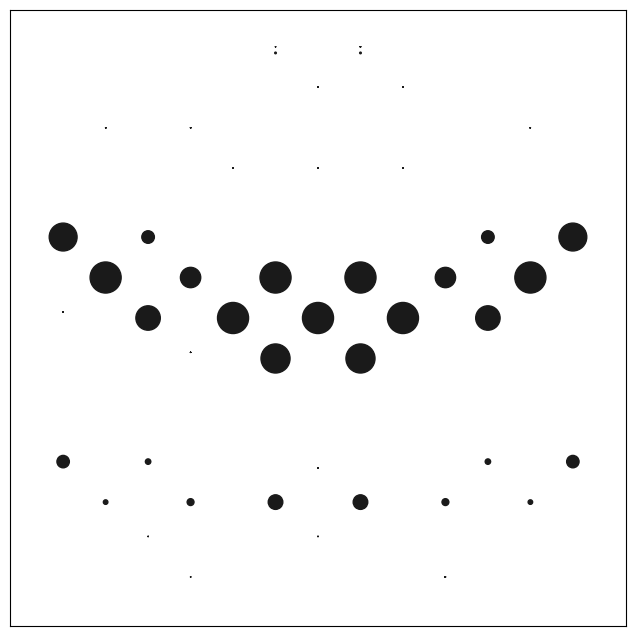

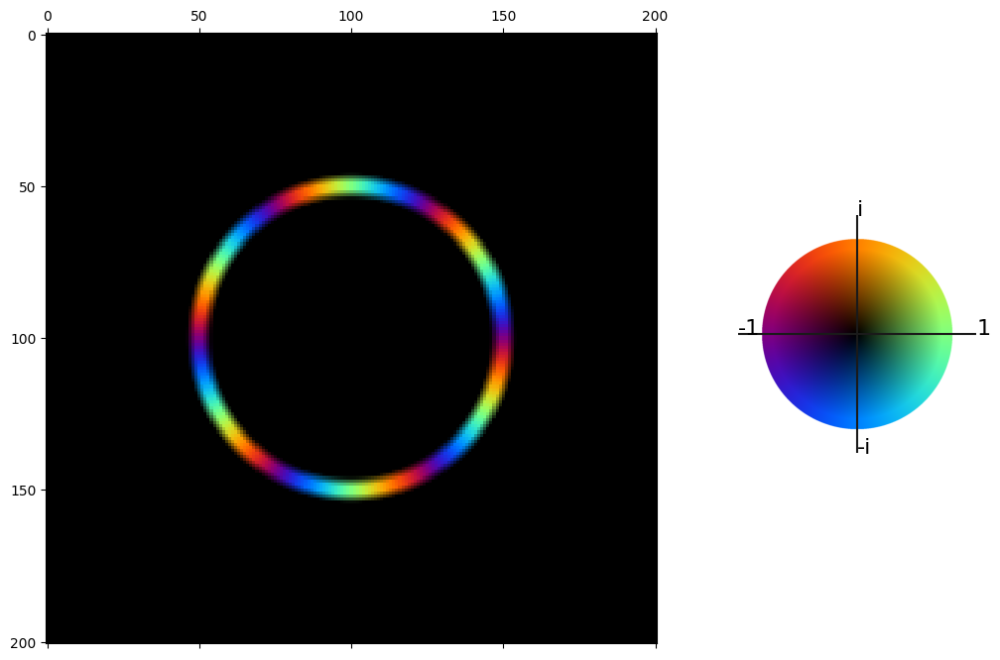

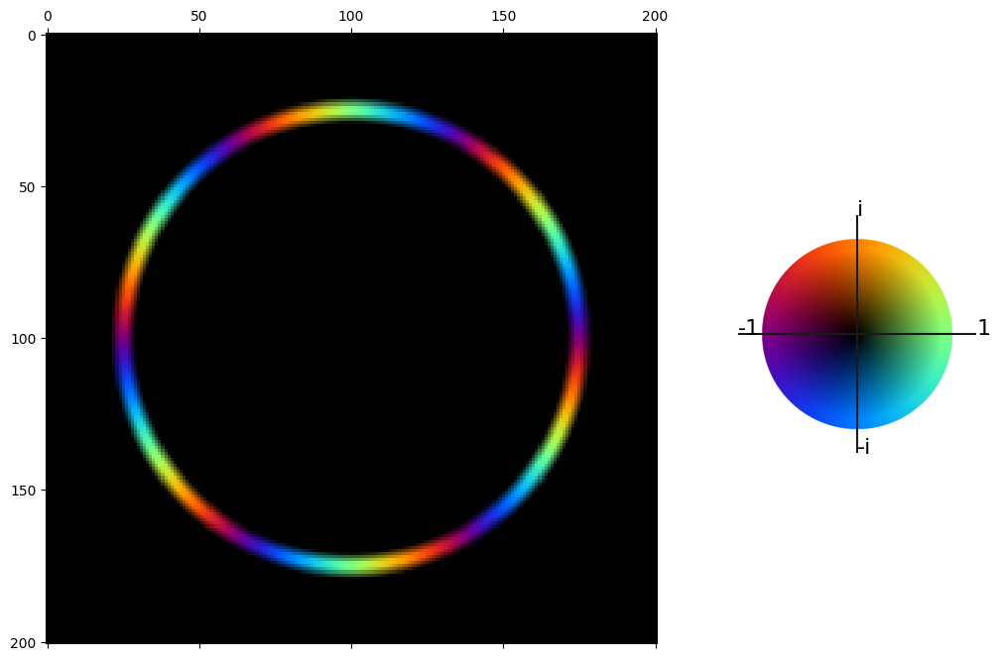

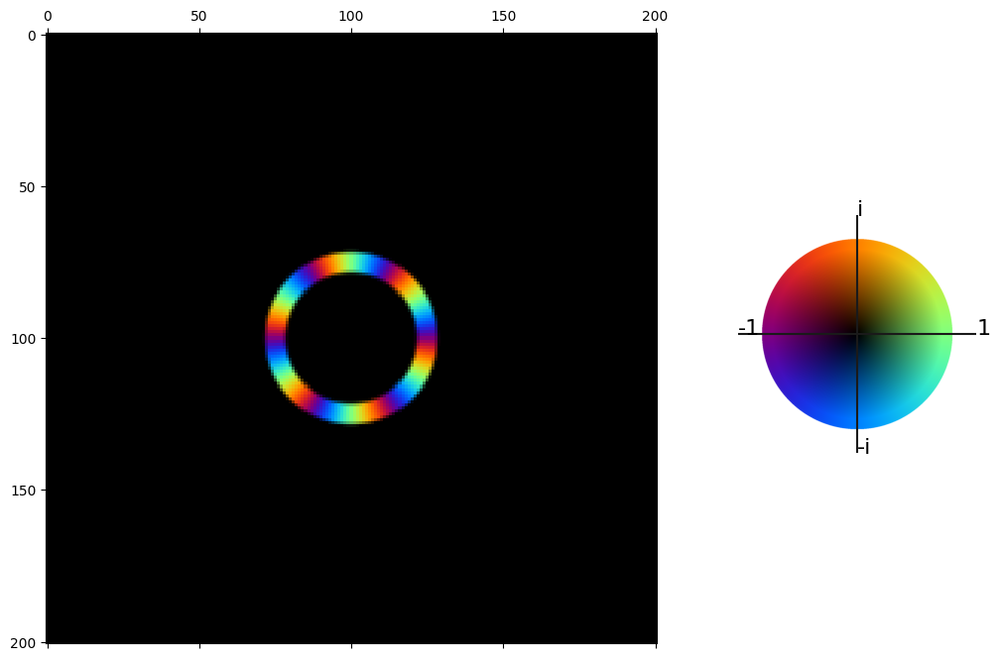

In [9]:
fig, scale = visualize_radial_components(rf_diff_obj2, mp_id = example_id, zone = (0.8872263013380515, 0.4436131506690257, 0.1266367354581659), include_x_label = False, include_y_label = False, radial_params = [[12, 6], [18, 6], [6, 6]])

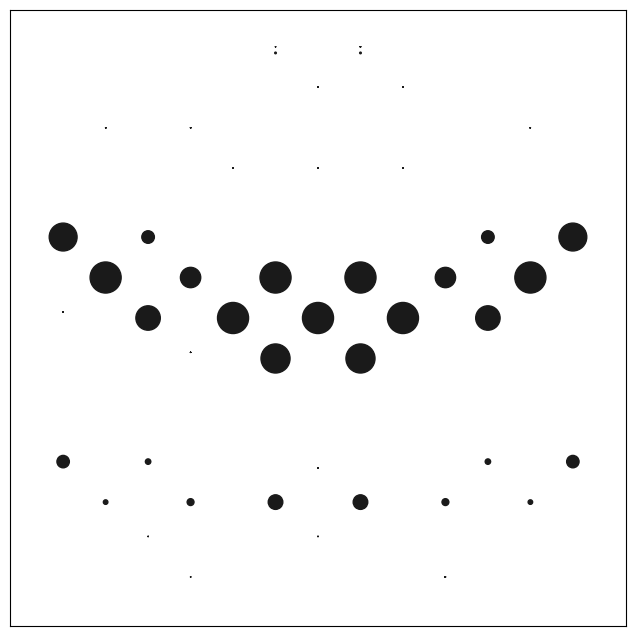

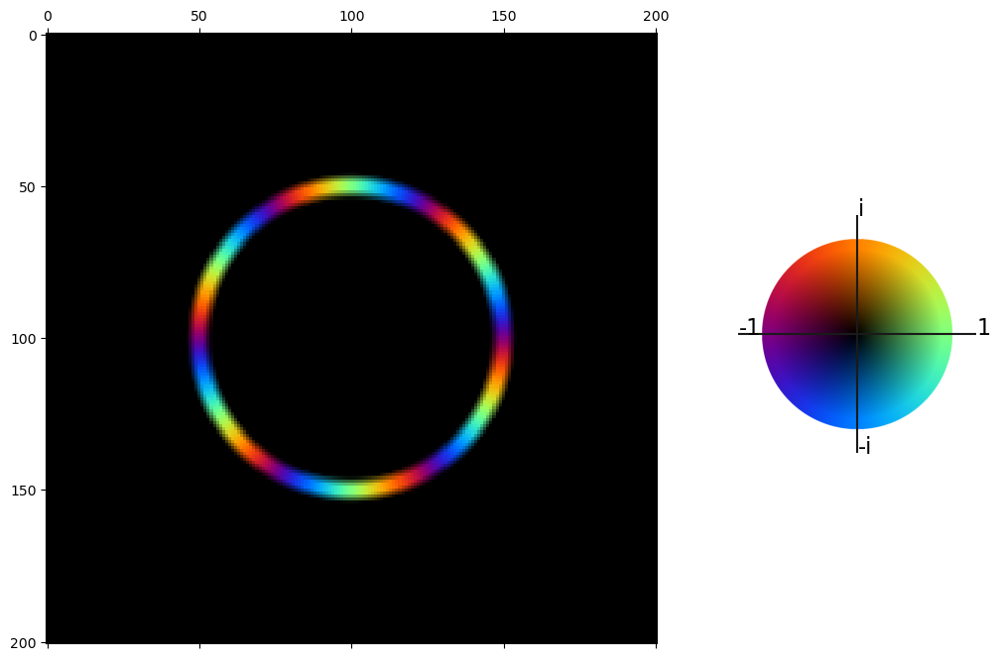

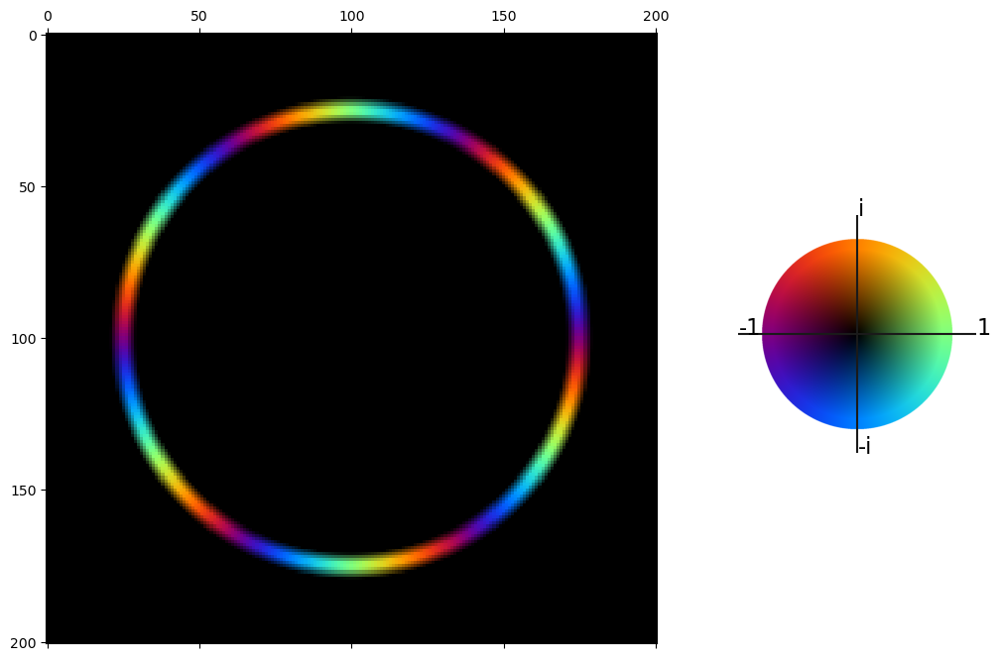

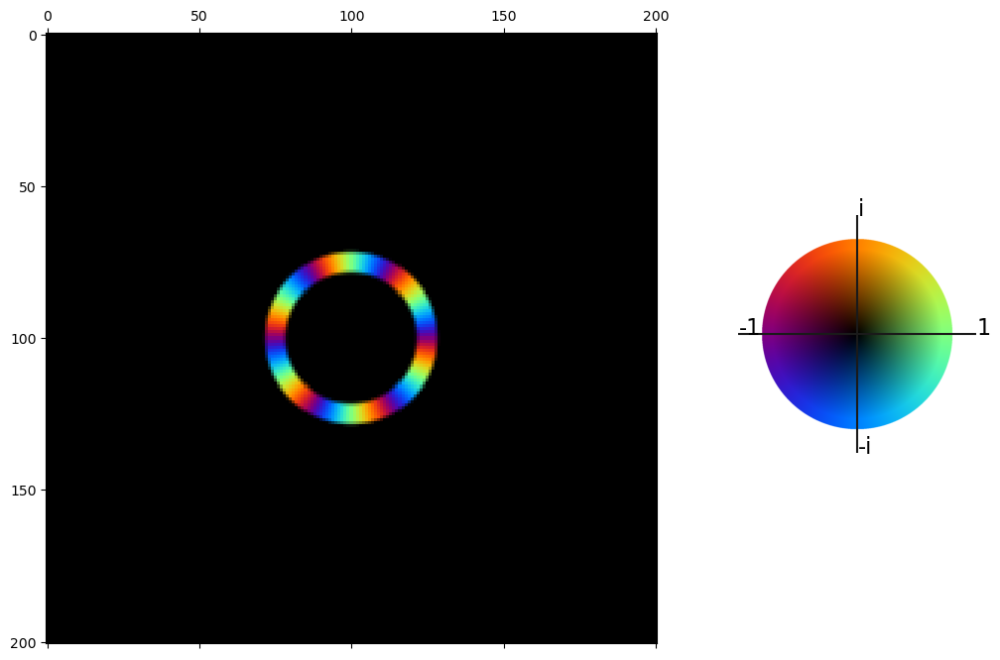

In [11]:
fig, scale = visualize_radial_components(rf_diff_obj2, mp_id = example_id, zone = (0.8872263013380515, 0.4436131506690257, 0.1266367354581659), include_x_label = False, include_y_label = False, radial_params = [[12, 6], [18, 6], [6, 6]])

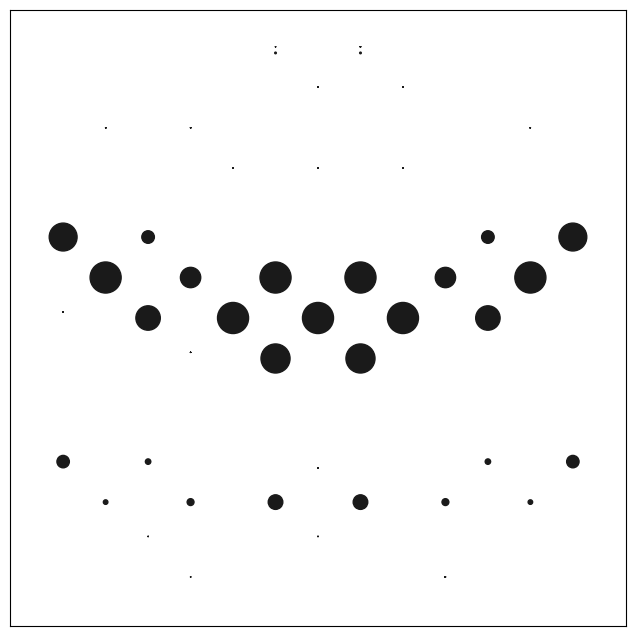

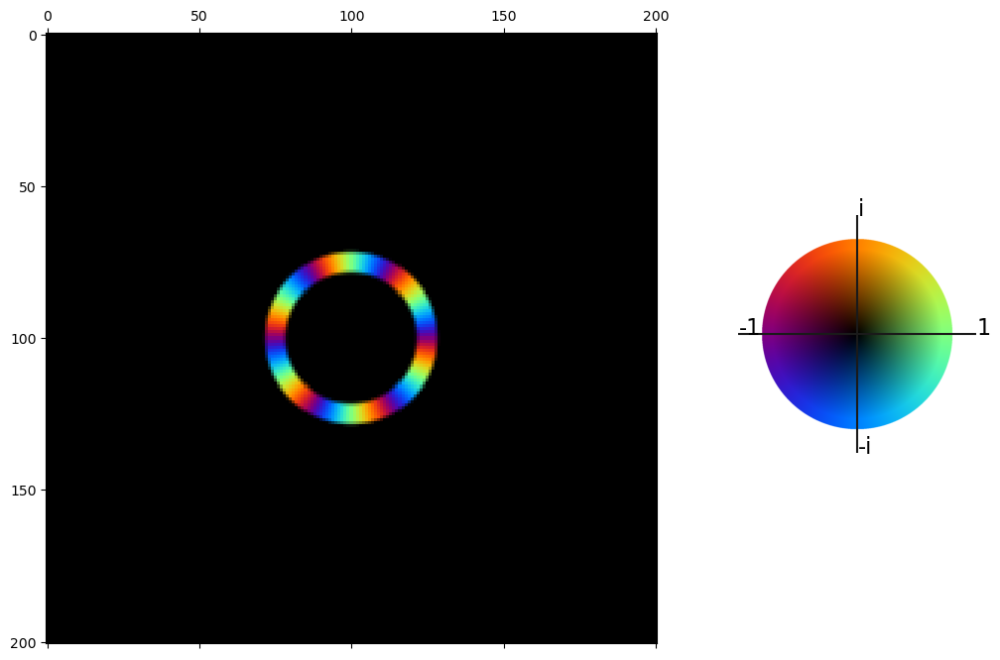

In [12]:
fig1_5, scale = visualize_radial_components(rf_diff_obj2, mp_id = example_id, zone = (0.8872263013380515, 0.4436131506690257, 0.1266367354581659), include_x_label = False, include_y_label = False, radial_params = [[6, 6]])

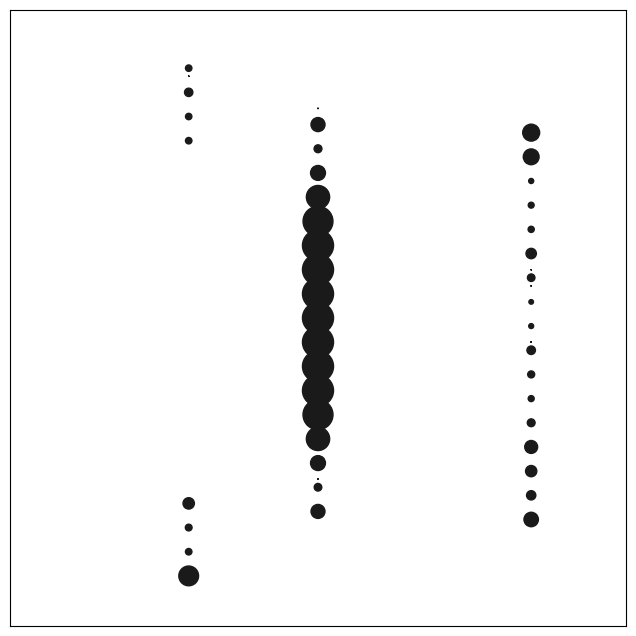

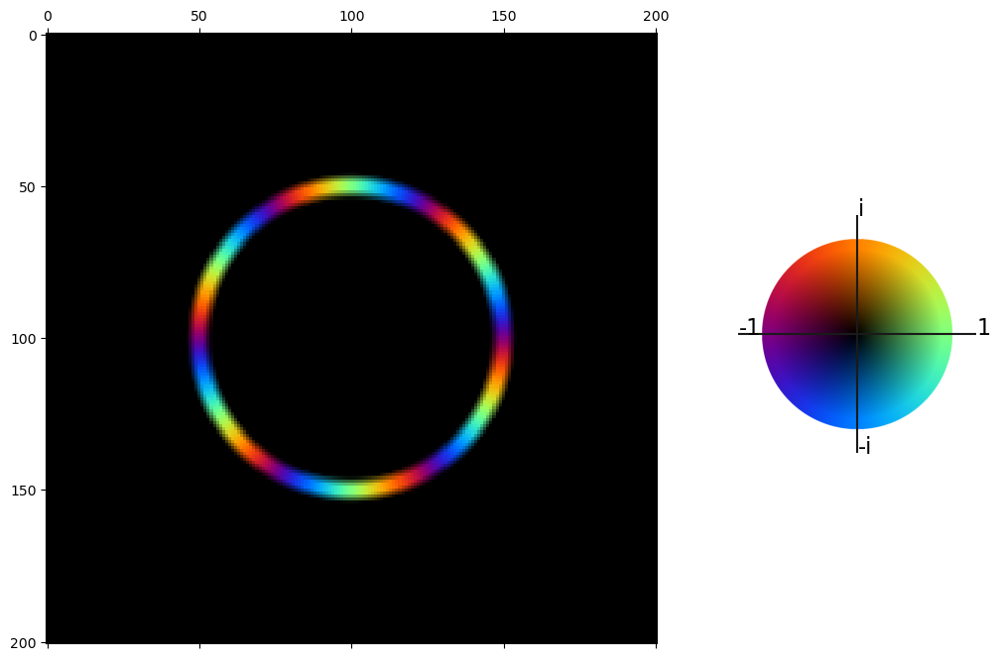

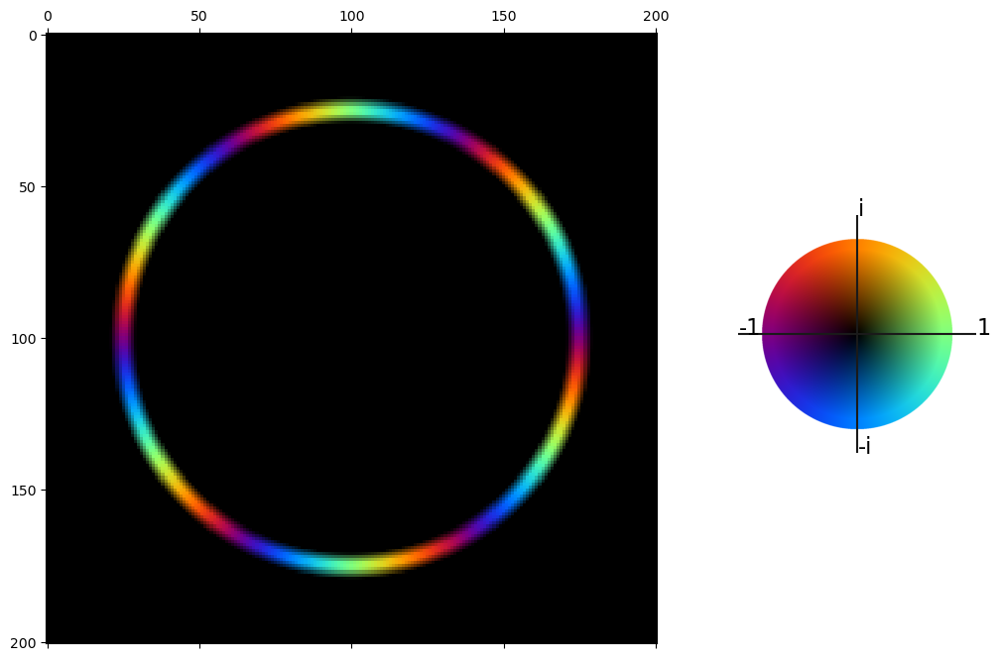

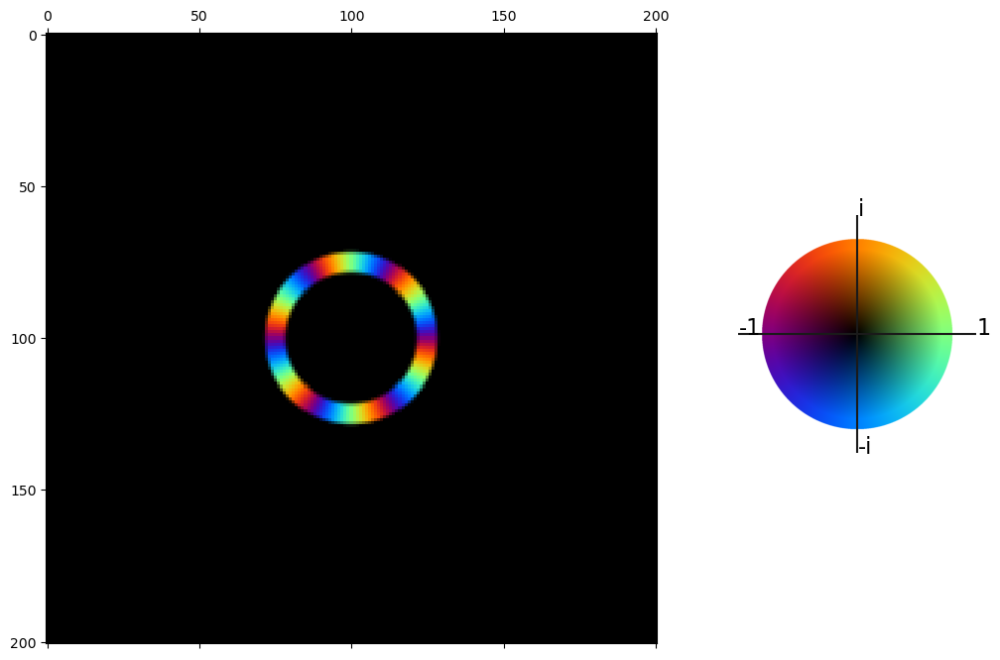

In [13]:
fig2, scale = visualize_radial_components(rf_diff_obj2, mp_id = example_id, zone = (0.857023392519904, -0.5152775025883378, 1.3983877300285665e-17), include_x_label = False, include_y_label = False, radial_params = [[12, 6], [18, 6], [6, 6]])

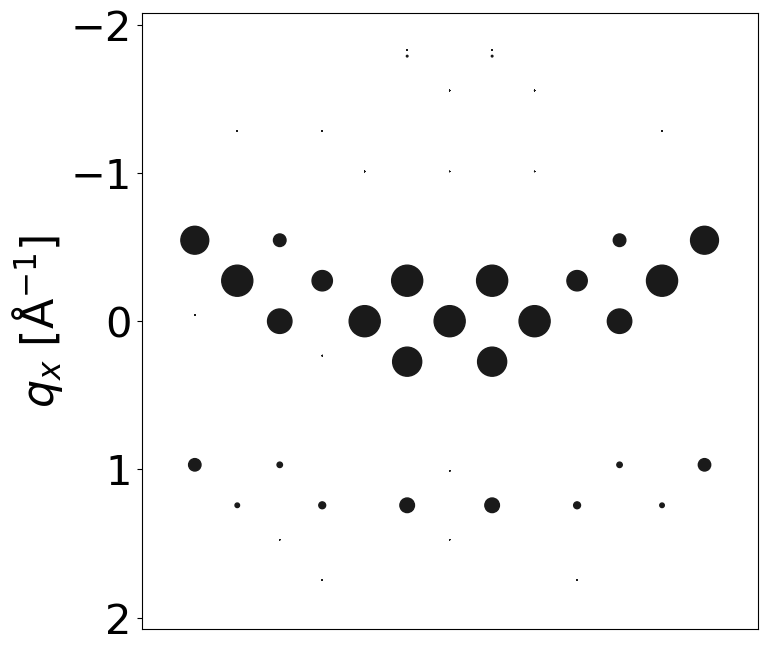

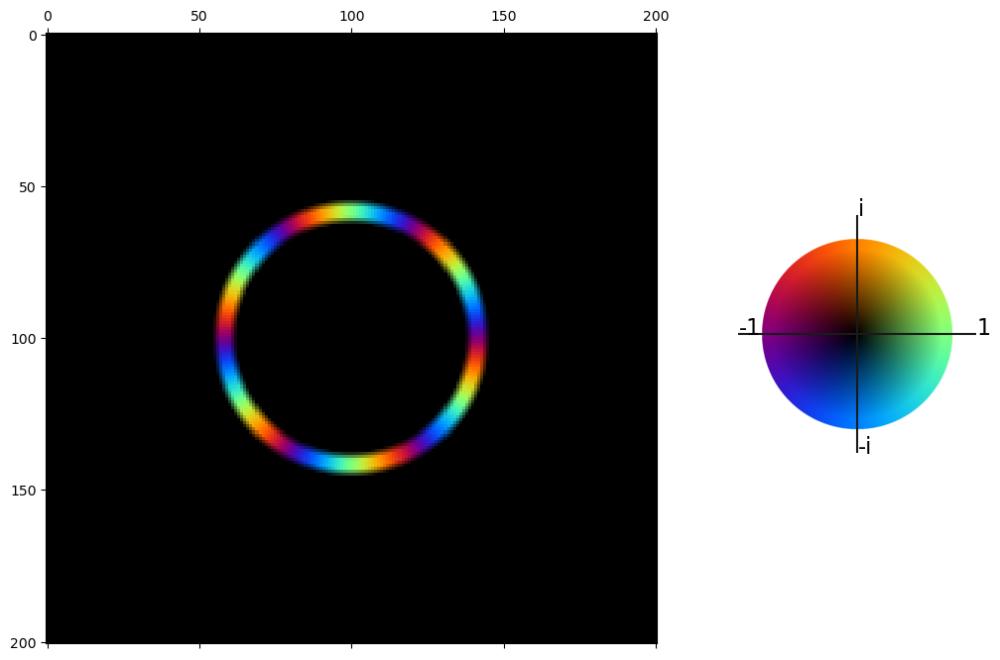

In [14]:
fig2_5, scale = visualize_radial_components(rf_diff_obj2, mp_id = example_id, zone = (0.8872263013380515, 0.4436131506690257, 0.1266367354581659), include_x_label = False, include_y_label = True, radial_params = [[10, 6]])

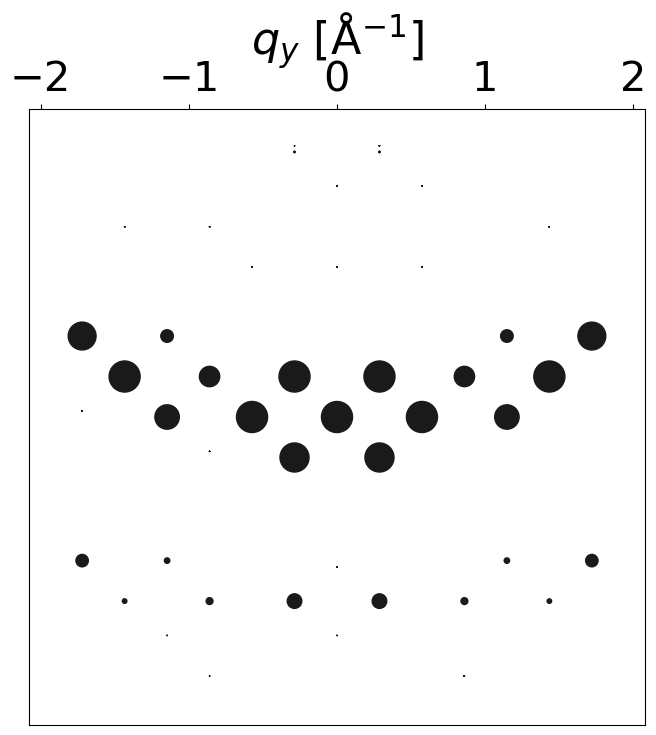

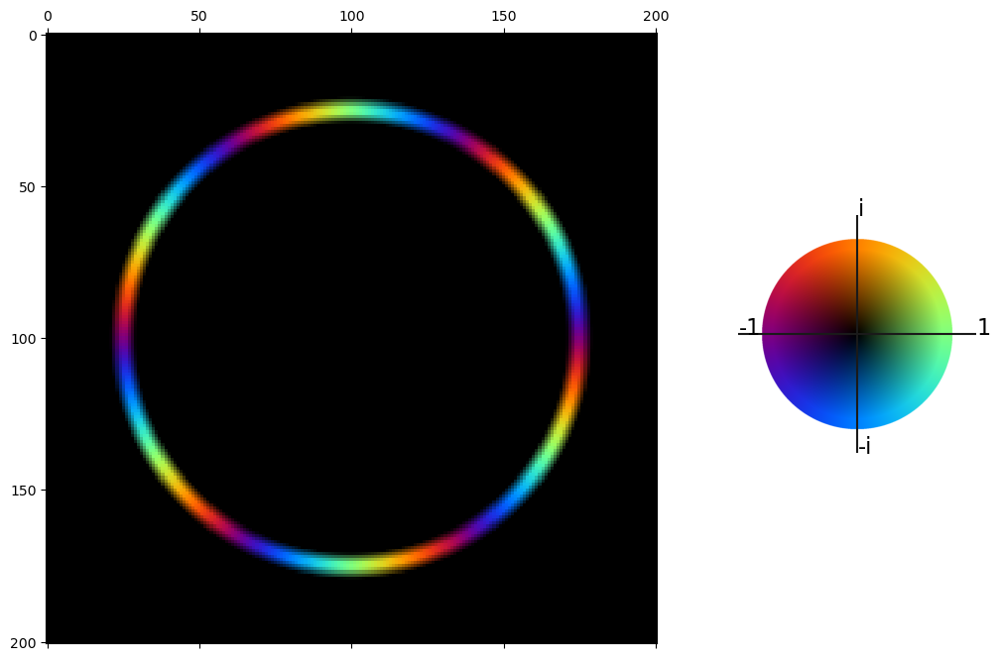

In [15]:
fig3, scale = visualize_radial_components(rf_diff_obj2, mp_id = example_id, zone = (0.8872263013380515, 0.4436131506690257, 0.1266367354581659), radial_params = [[18,6]], include_x_label = True, include_y_label = False)

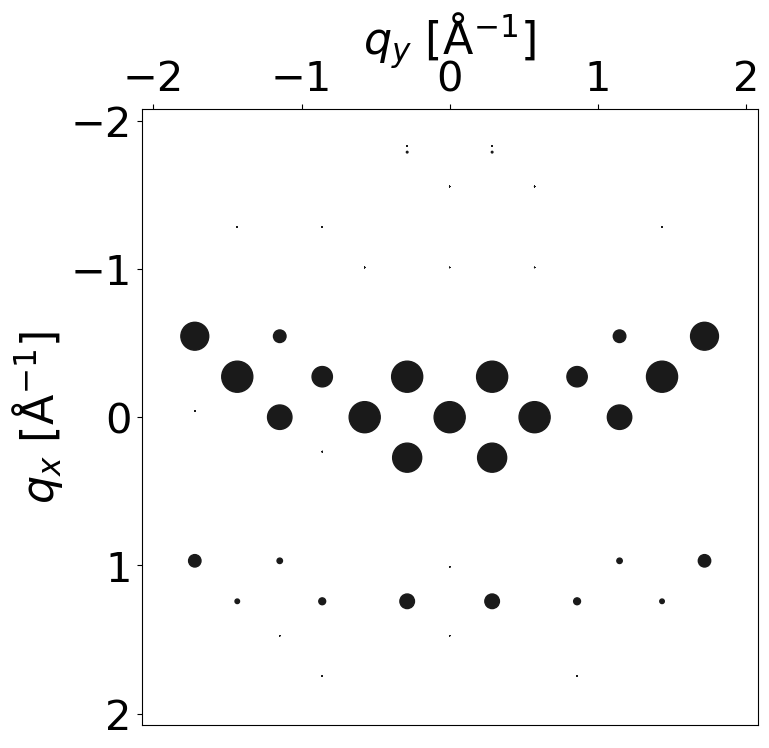

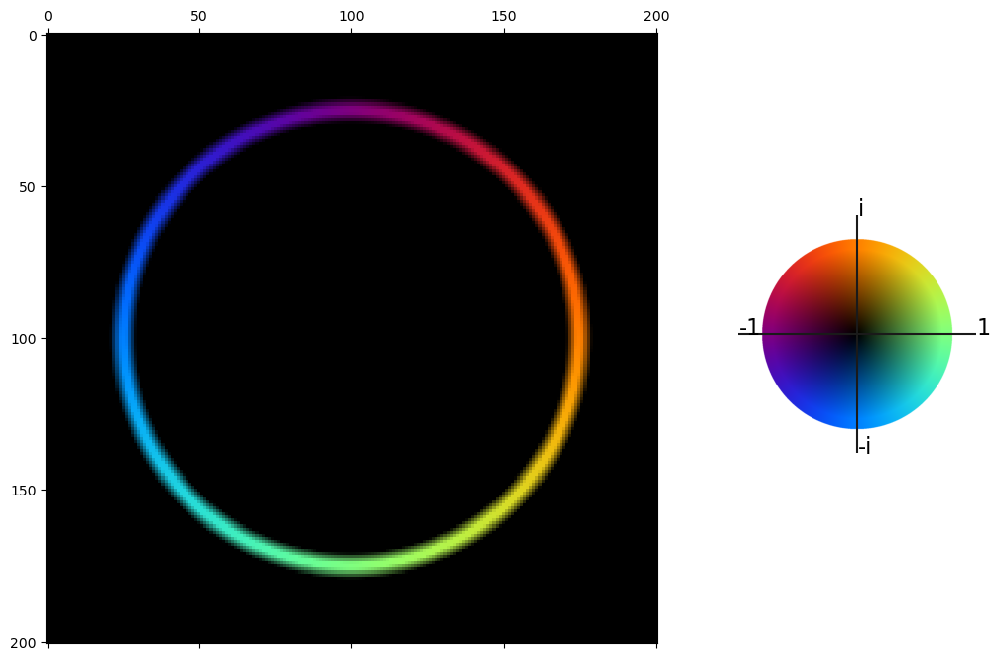

In [16]:
fig4, scale = visualize_radial_components(rf_diff_obj2, mp_id = example_id, zone = (0.8872263013380515, 0.4436131506690257, 0.1266367354581659), radial_params = [[18,1]], include_x_label = True, include_y_label = True)

<font size="6"> Save Figures

In [17]:
# plt.rcParams['pdf.fonttype'] = 'truetype'
# scale[0].savefig('radial_basis_colorbar.pdf', bbox_inches="tight")

# fig.savefig('radial_basis_example_1.pdf', bbox_inches="tight")

# fig1_5.savefig('radial_basis_example_1_5.pdf', bbox_inches="tight")

# fig2.savefig('pattern_example_2.pdf', bbox_inches="tight")

# fig2_5.savefig('radial_basis_example_2_5.pdf', bbox_inches="tight")

# fig3.savefig('radial_basis_example_3.pdf', bbox_inches="tight")

# fig4.savefig('radial_basis_example_4.pdf', bbox_inches="tight")

<font size="6"> Figure 2

In [18]:
rf_diff_obj.condense_crystal_system_output(method='Difference Aggregation', load_from_path = True, num=10,
            path = 'data/052224_10_pattern_lattice_added_difference_aggregation_condensed_df.joblib')

mp-1001784


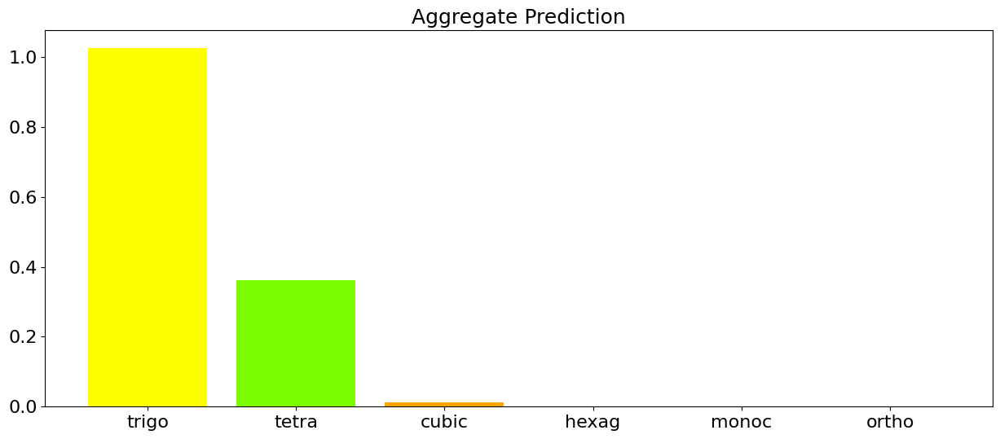

In [14]:
ind = rf_diff_obj.condensed_output_df.loc[rf_diff_obj.condensed_output_df.mat_id == example_id].index
sorted_df = sorted(rf_diff_obj.condensed_output_df.iloc[ind[0]]['Full Weights Crystal System'].items(), key=lambda x: x[1], reverse=True)
print(rf_diff_obj.condensed_output_df.iloc[ind[0]].mat_id)

labels = []
for i in sorted_df:
    labels.append(i[0][0:5])
plt.figure(figsize = (15,6))
# plt.title(rf_diff_obj.condensed_output_df.iloc[0]['mat_id'] + ' Difference Aggregate', fontsize = 18)
plt.title('Aggregate Prediction', fontsize = 18)
colors = ['yellow', 'lawngreen', 'orange', 'purple', 'orange', 'deepskyblue']
for i in range(0, 6): 
    plt.bar(labels[i], sorted_df[i][1], color = colors[i])
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.rcParams['pdf.fonttype'] = 'truetype'
# plt.savefig('agg_pred_example'+'.pdf', bbox_inches="tight")
plt.show()

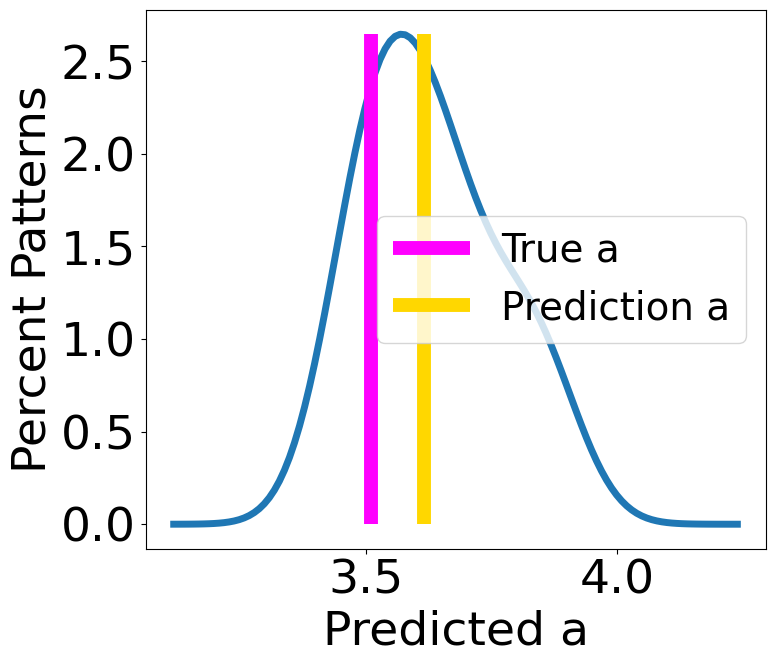

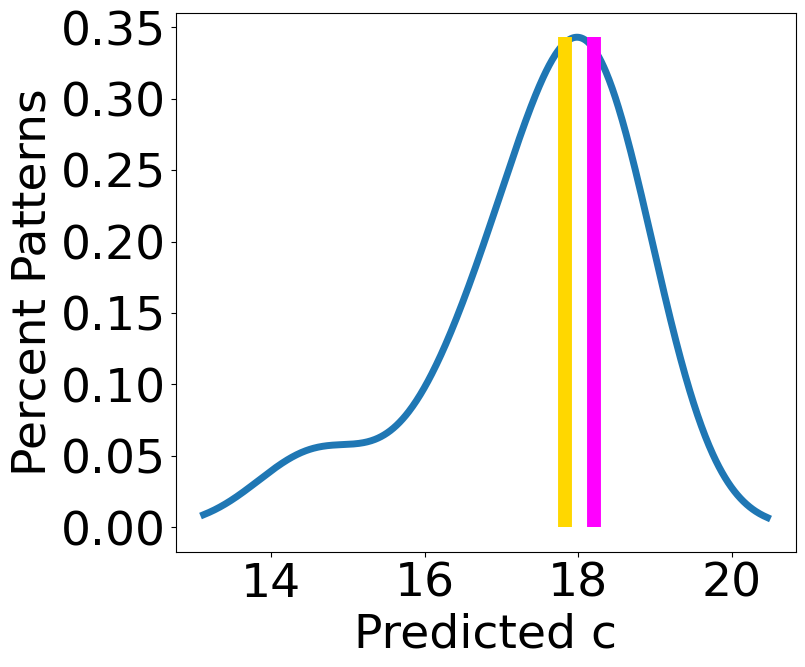

In [15]:
mpl.style.use('default')
plt.rcParams['pdf.fonttype'] = 'truetype'
t = rf_diff_obj.lattice_visualize_predictions_by_material(material_id = example_id, show_plots = False,param_list = ['a','c'], index_list = [0,2],
                                            savefigure=False, include_legend = [True,False], filename='figure2_lattice_example_',
                                            xticks = [[3.5,4,4.5,5,5.5], [10,12,14,16,18,20]])

Accurate Accuracy
0.8779761904761905
Inaccurate Accuracy
0.0
All Accuracy
0.8526011560693642


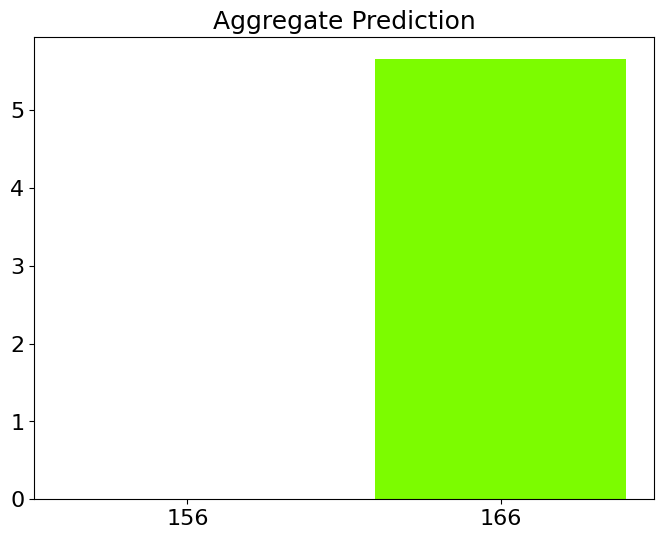

In [15]:
rf_diff_obj.loaded_submodels_space_group = [False, '']
out_df = rf_diff_obj.visualize_space_group_results_aggregate('trigonal', regen_sg_predictions = False)
    
sorted_df = sorted(out_df.loc[out_df['material_id'] == example_id]['averaged_weights_space_group'].items(), key=lambda x: x[1], reverse=True)[0][1]

labels = []
for i in sorted_df.keys():
    labels.append(i[0:5])
plt.figure(figsize = (8,6))
# plt.title(rf_diff_obj.condensed_output_df.iloc[0]['mat_id'] + ' Difference Aggregate', fontsize = 18)
plt.title('Aggregate Prediction', fontsize = 18)
colors = ['yellow', 'lawngreen', 'orange', 'purple', 'orange', 'deepskyblue']
for i in range(0, 2): 
    plt.bar(labels[i], sorted_df[labels[i]], color = colors[i])
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.rcParams['pdf.fonttype'] = 'truetype'
# plt.savefig('Figure2_SG_agg_pred_example'+'.pdf', bbox_inches="tight")
plt.show()

<font size="6"> Figure 3

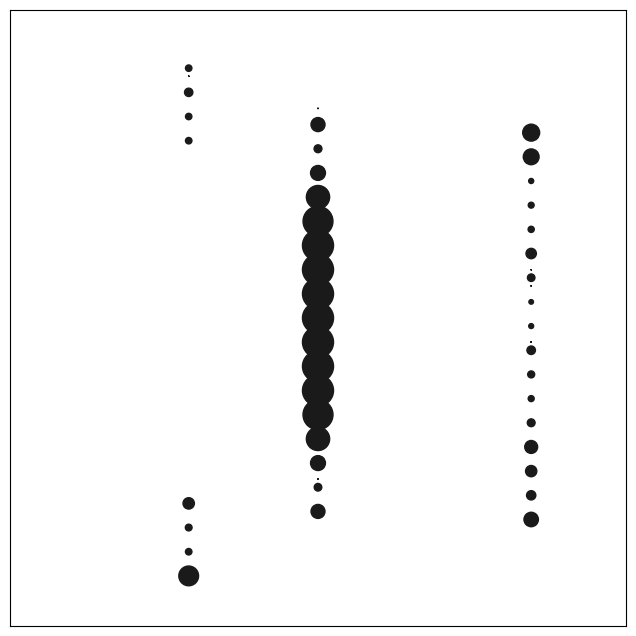

In [27]:
fig_3_example_1 = visualize_radial_components(rf_diff_obj2, mp_id = example_id, zone = (0.857023392519904, -0.5152775025883378, 1.3983877300285665e-17), 
                                          include_x_label = False, include_y_label = False, radial_params = [])

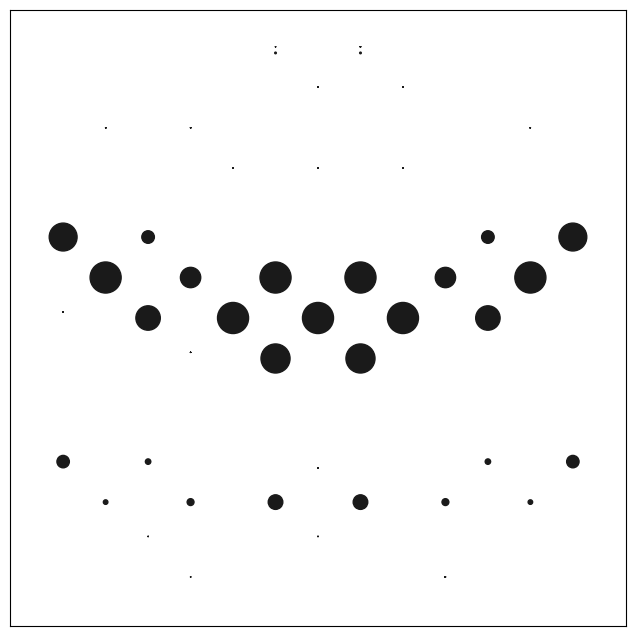

In [28]:
fig_3_example_2 = visualize_radial_components(rf_diff_obj2, mp_id = example_id, zone = (0.8872263013380515, 0.4436131506690257, 0.1266367354581659), 
                                          include_x_label = False, include_y_label = False, radial_params = [])

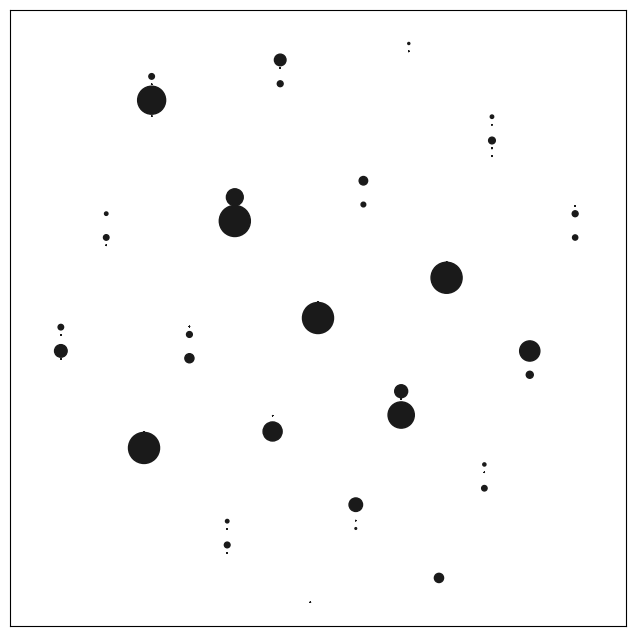

In [29]:
fig_3_example_3 = visualize_radial_components(rf_diff_obj2, mp_id = example_id, zone = (0.8685176453112567, -0.4945793782001556, 0.03268544694718834), 
                                          include_x_label = False, include_y_label = False, radial_params = [])

In [30]:
# plt.rcParams['pdf.fonttype'] = 'truetype'
# fig_3_example_1.savefig('fig_3_example_1.pdf', bbox_inches="tight")

# fig_3_example_2.savefig('fig_3_example_2.pdf', bbox_inches="tight")

# fig_3_example_3.savefig('fig_3_example_3.pdf', bbox_inches="tight")

In [31]:
rf_diff_obj.full_df.iloc[2470].zone

(0.857023392519904, -0.5152775025883378, 1.3983877300285665e-17)

In [32]:
rf_diff_obj.full_df.iloc[2502].zone

(0.8872263013380515, 0.4436131506690257, 0.1266367354581659)

In [33]:
rf_diff_obj.full_df.iloc[2496].zone

(0.8685176453112567, -0.4945793782001556, 0.03268544694718834)

2470
['trigonal', 'monoclinic', 'tetragonal', 'orthorhombic', 'hexagonal']
trigonal        47
monoclinic      20
tetragonal       6
orthorhombic     5
hexagonal        2
dtype: int64


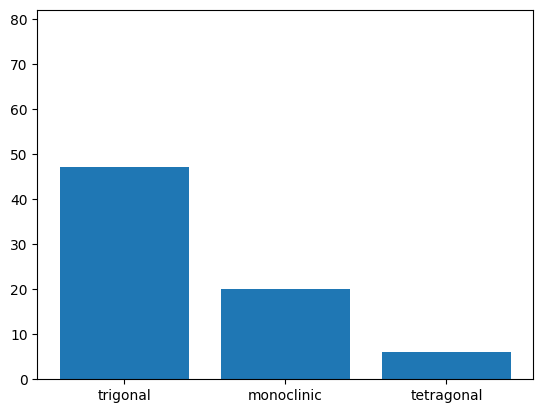

2502
['trigonal', 'cubic', 'hexagonal', 'tetragonal', 'orthorhombic', 'monoclinic']
trigonal        26
cubic           19
hexagonal       18
tetragonal       7
orthorhombic     6
monoclinic       4
dtype: int64


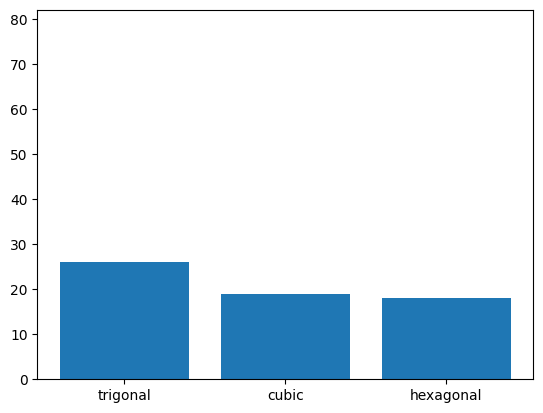

2496

['tetragonal', 'trigonal', 'cubic', 'orthorhombic', 'hexagonal', 'monoclinic']
tetragonal      24
trigonal        21
cubic           18
orthorhombic     7
hexagonal        6
monoclinic       4
dtype: int64


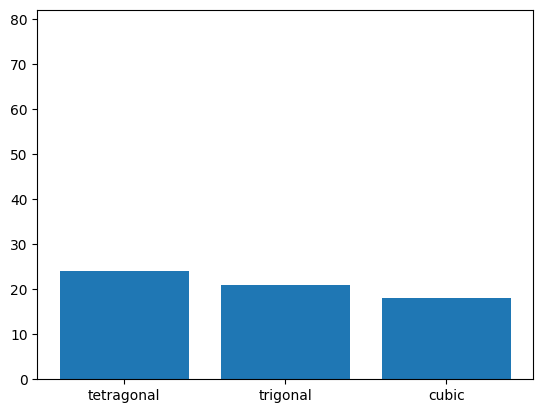

In [19]:
print(rf_diff_obj.output_df.loc[rf_diff_obj.output_df['mat_id'] == example_id].iloc[51]['Full DF Indicies'])
vals = pd.DataFrame(rf_diff_obj.output_df.loc[rf_diff_obj.output_df['mat_id'] == example_id].iloc[51]['Full Predictions Crystal System']).value_counts()
vals_use = []
for i in vals.index:
    vals_use.append(i[0])
print(vals_use)
mpl.style.use('default')
plt.rcParams['pdf.fonttype'] = 'truetype'
plt.bar(vals_use[0:3], np.asarray(vals)[0:3])
print(vals)
plt.ylim([0,82])
# plt.savefig('Accurate Example.pdf', bbox_inches="tight", transparent=True)
plt.show()

print(rf_diff_obj.output_df.loc[rf_diff_obj.output_df['mat_id'] == example_id].iloc[83]['Full DF Indicies'])
vals = pd.DataFrame(rf_diff_obj.output_df.loc[rf_diff_obj.output_df['mat_id'] == example_id].iloc[83]['Full Predictions Crystal System']).value_counts()
vals_use = []
for i in vals.index:
    vals_use.append(i[0])
print(vals_use)
mpl.style.use('default')
plt.rcParams['pdf.fonttype'] = 'truetype'
plt.bar(vals_use[0:3], np.asarray(vals)[0:3])
print(vals)
plt.ylim([0,82])
# plt.savefig('Accurate Low Con Example.pdf', bbox_inches="tight", transparent=True)
plt.show()

print(rf_diff_obj.output_df.loc[rf_diff_obj.output_df['mat_id'] == example_id].iloc[77]['Full DF Indicies'])
print()
vals = pd.DataFrame(rf_diff_obj.output_df.loc[rf_diff_obj.output_df['mat_id'] == example_id].iloc[77]['Full Predictions Crystal System']).value_counts()
vals_use = []
for i in vals.index:
    vals_use.append(i[0])
print(vals_use)
mpl.style.use('default')
plt.rcParams['pdf.fonttype'] = 'truetype'
plt.bar(vals_use[0:3], np.asarray(vals)[0:3])
print(vals)
plt.ylim([0,82])
# plt.savefig('Innacurate Example.pdf', bbox_inches="tight", transparent=True)
plt.show()



mp-1001784


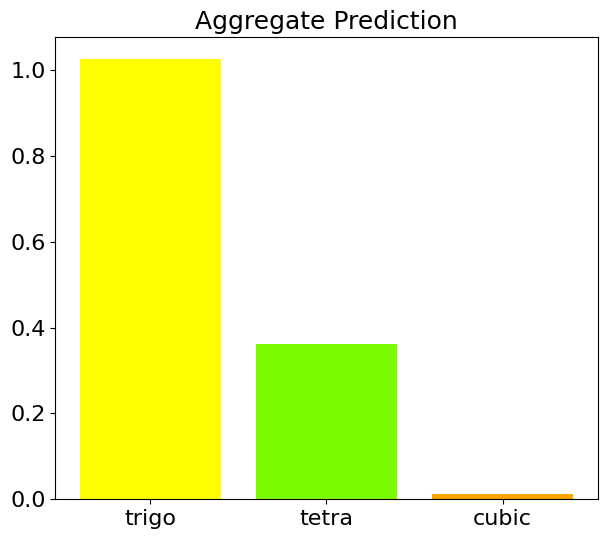

In [20]:
ind = rf_diff_obj.condensed_output_df.loc[rf_diff_obj.condensed_output_df.mat_id == example_id].index
sorted_df = sorted(rf_diff_obj.condensed_output_df.iloc[ind[0]]['Full Weights Crystal System'].items(), key=lambda x: x[1], reverse=True)
print(rf_diff_obj.condensed_output_df.iloc[ind[0]].mat_id)

labels = []
for i in sorted_df[0:3]:
    labels.append(i[0][0:5])
plt.figure(figsize = (7,6))
# plt.title(rf_diff_obj.condensed_output_df.iloc[0]['mat_id'] + ' Difference Aggregate', fontsize = 18)
plt.title('Aggregate Prediction', fontsize = 18)
colors = ['yellow', 'lawngreen', 'orange', 'purple', 'orange', 'deepskyblue']
for i in range(0, 3): 
    plt.bar(labels[i], sorted_df[i][1], color = colors[i])
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16)
plt.rcParams['pdf.fonttype'] = 'truetype'
# plt.savefig('Figure4_agg_pred_example'+'.pdf', bbox_inches="tight")
plt.show()

<font size="6"> Figure 4 

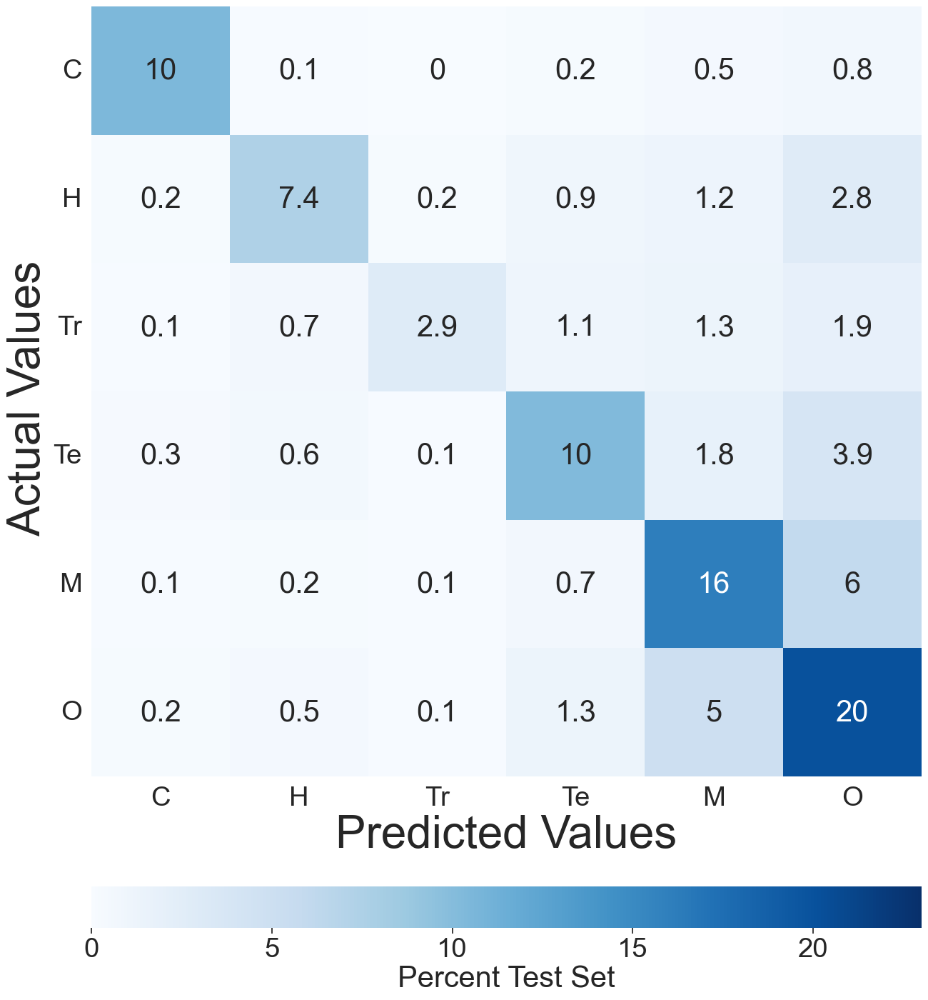

       C     H    Tr    Te     M     O
C   77.0  33.0  31.0  32.0  38.0  34.0
H   40.0  48.0  34.0  33.0  40.0  37.0
Tr  33.0  34.0  44.0  32.0  40.0  33.0
Te  38.0  35.0  31.0  51.0  40.0  36.0
M   33.0  32.0  32.0  32.0  55.0  39.0
O   35.0  33.0  27.0  33.0  46.0  48.0


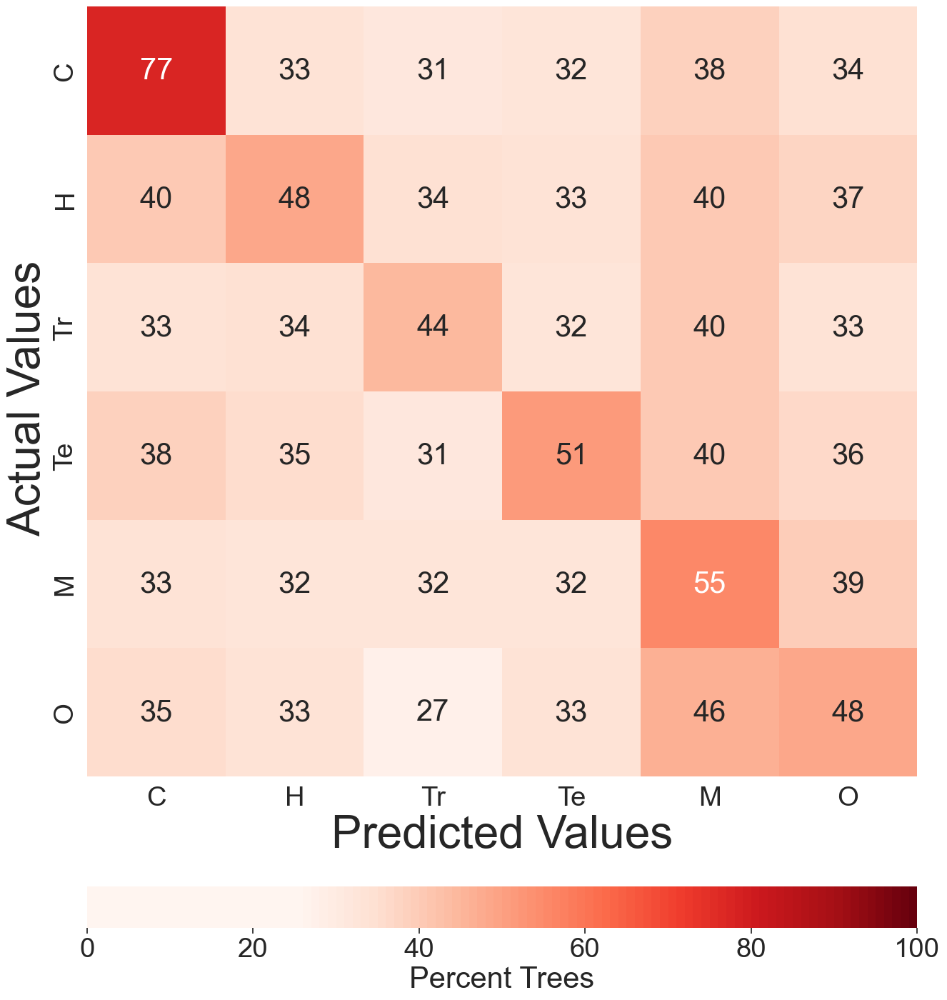

In [24]:
plt.rcParams['pdf.fonttype'] = 'truetype'
sn.set(font_scale=2.5)
rf_diff_obj.show_cm_and_uncertianty_individual_prediction(savefigure=False, reset_output_df = False, visualize_from_saved_data = True, save_cm = False,
                                                          saved_accuracy_cm = 'data/individual_pattern_df_cm_percent.pkl', 
                                                          saved_confidence_cm = 'data/individual_pattern_prediction_matrix_confidence.npy',
                                                         figure_path = ['fig3_individual_prediction_accuracy.pdf', 
                                                                   'fig3_individual_prediction_confidence.pdf'])

In [25]:
for act in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'monoclinic', 'orthorhombic']:
    for pred in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'monoclinic', 'orthorhombic']: 
        test_cry_sys = rf_diff_obj.output_df.loc[(rf_diff_obj.output_df['Predictions Crystal System'] == pred) & 
                                                                             (rf_diff_obj.output_df['True Values Crystal System'] == act)]
        print(act, pred, np.mean(test_cry_sys['Confidence Crystal System']))

cubic cubic 0.774099797669897
cubic hexagonal 0.33297655453618774
cubic trigonal 0.30506944444444445
cubic tetragonal 0.322670549084859
cubic monoclinic 0.38417238523426367
cubic orthorhombic 0.33553962606390403
hexagonal cubic 0.39794197031039114
hexagonal hexagonal 0.4814268663536351
hexagonal trigonal 0.3434983896940417
hexagonal tetragonal 0.3295141065830716
hexagonal monoclinic 0.40121361594061367
hexagonal orthorhombic 0.36537013282575326
trigonal cubic 0.32585055986218764
trigonal hexagonal 0.340143449284785
trigonal trigonal 0.4394210912989944
trigonal tetragonal 0.31562819725803165
trigonal monoclinic 0.402706364647026
trigonal orthorhombic 0.32665820276212454
tetragonal cubic 0.37677586938083063
tetragonal hexagonal 0.34751205061257356
tetragonal trigonal 0.3052334337349396
tetragonal tetragonal 0.5121740374049839
tetragonal monoclinic 0.40417863203237314
tetragonal orthorhombic 0.3623445423810675
monoclinic cubic 0.33176729986431447
monoclinic hexagonal 0.3194900430570501
mo

       C    H   Tr    Te     M     O
C   10.8  0.0  0.0   0.1   0.4   0.7
H    0.2  9.3  0.1   0.3   1.0   1.9
Tr   0.1  0.4  3.9   0.7   1.6   1.2
Te   0.2  0.2  0.0  11.7   1.5   3.3
M    0.1  0.0  0.0   0.2  20.9   2.1
O    0.1  0.1  0.0   0.7   3.5  22.7


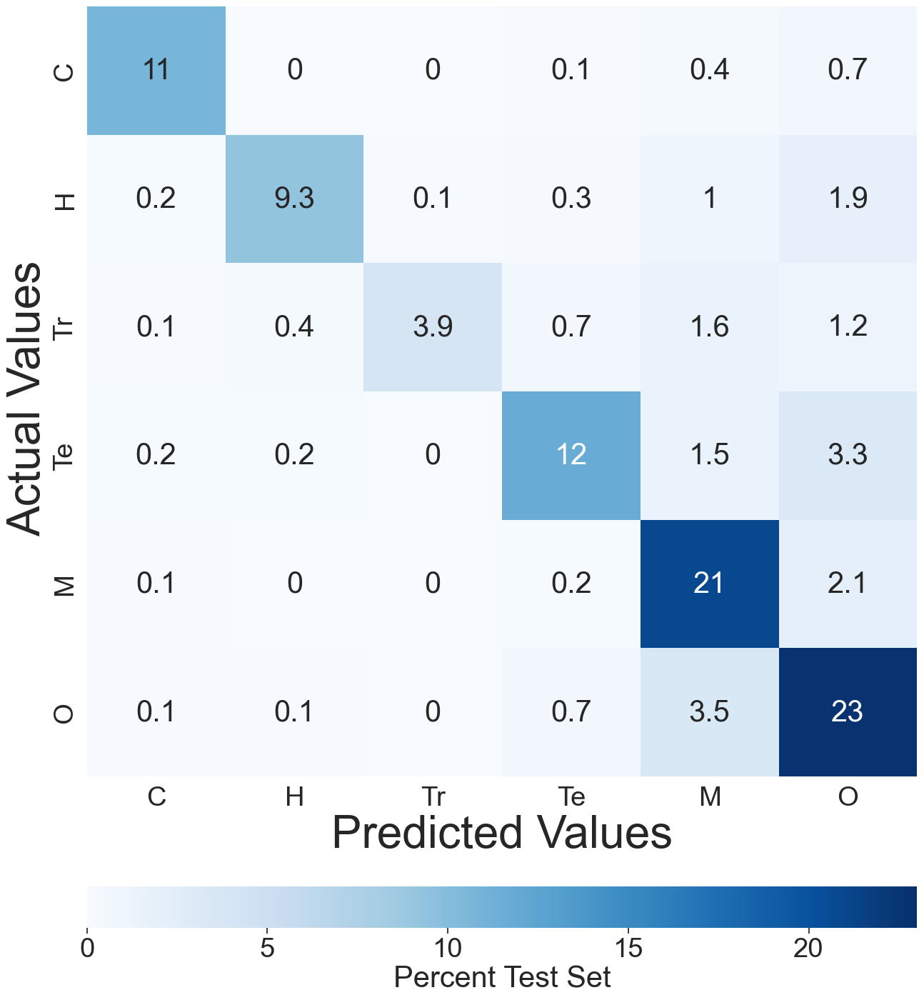

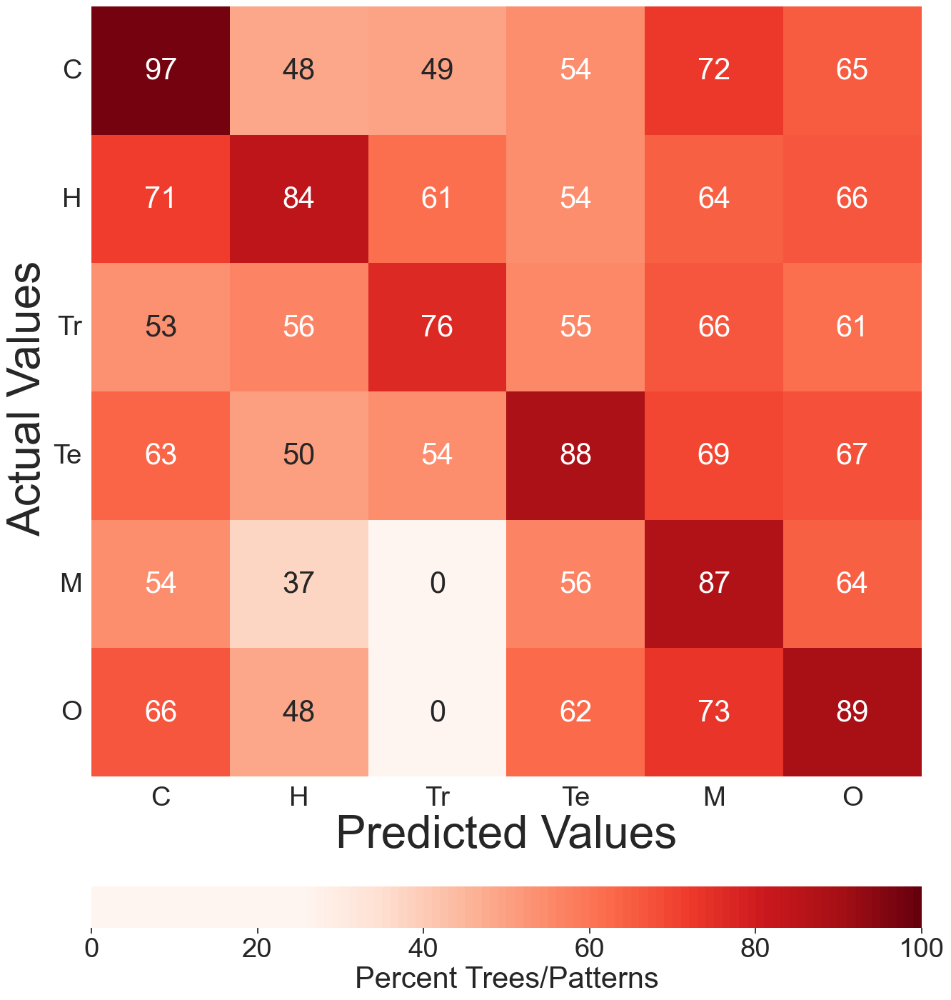

In [26]:
plt.rcParams['pdf.fonttype'] = 'truetype'
sn.set(font_scale=2.5)
rf_diff_obj.show_aggregate_confusion_matrix(show_individual = False, savefigure = False, visualize_from_saved_data = True, 
                                              filenames = ['10_pattern_fig3_aggregate_prediction_accuracy',
                                                            '10_pattern_fig3_aggregate_prediction_confidence'],
                                           save_cm = False)

In [27]:
for act in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'monoclinic', 'orthorhombic']:
    for pred in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'monoclinic', 'orthorhombic']: 
        test_cry_sys = rf_diff_obj.condensed_output_df.loc[(rf_diff_obj.condensed_output_df['Aggregate Predictions Crystal System'] == pred) & 
                                                                             (rf_diff_obj.condensed_output_df['True Values Crystal System'] == act)]
        print(act, pred, np.mean(test_cry_sys['Prediction Confidence']))

cubic cubic 0.9735548435758333
cubic hexagonal 0.4790370127743203
cubic trigonal 0.4863453815261044
cubic tetragonal 0.535609797937337
cubic monoclinic 0.724081293005405
cubic orthorhombic 0.6510981592818794
hexagonal cubic 0.7101476471423456
hexagonal hexagonal 0.8371531363952057
hexagonal trigonal 0.6146507323920802
hexagonal tetragonal 0.5413133241228812
hexagonal monoclinic 0.6446802430163053
hexagonal orthorhombic 0.6639570022103699
trigonal cubic 0.5316402664642873
trigonal hexagonal 0.5611973381051428
trigonal trigonal 0.7597083383648794
trigonal tetragonal 0.5512009427044628
trigonal monoclinic 0.6632299566070344
trigonal orthorhombic 0.6054749780209402
tetragonal cubic 0.632444254583538
tetragonal hexagonal 0.5048242278823595
tetragonal trigonal 0.5405405405405405
tetragonal tetragonal 0.882157870306119
tetragonal monoclinic 0.6901277997182441
tetragonal orthorhombic 0.6736298447376714
monoclinic cubic 0.5408896612899496
monoclinic hexagonal 0.3658536585365853
monoclinic trigo

<font size="6"> Figure 5, S6, S7

<font size="5"> Individual Patterns

<font size="4"> Crystal System

In [28]:
crystal_sys_alph = ['cubic', 'hexagonal', 'monoclinic', 'orthorhombic', 'tetragonal', 'trigonal']
with open('data/df_cm_percent_unrounded.pkl', 'rb') as f:
    df_cm = pickle.load(f)
    
trues = []
print('Sensitivity')
for i in range(0, len(np.asarray(df_cm))):
    print(crystal_sys_alph[i] + ' ' + str(np.asarray(df_cm)[i][i]/sum(np.asarray(df_cm)[i])))
    
print('True Positive Rate')
trues = []
for i in range(0, len(np.asarray(df_cm))):
    print(crystal_sys_alph[i] + ' ' + str(np.asarray(df_cm)[i][i]/sum(np.asarray(df_cm).T[i])))

Sensitivity
cubic 0.8623599163330262
hexagonal 0.5812387318232992
monoclinic 0.6935343431333167
orthorhombic 0.7395169701194799
tetragonal 0.6099508362354229
trigonal 0.36383928016912653
True Positive Rate
cubic 0.9232859766013449
hexagonal 0.7805331889843696
monoclinic 0.6230406146026326
orthorhombic 0.5659680831043485
tetragonal 0.7042884018301169
trigonal 0.8583958504278514


<font size="4"> Lattice

cubic
a
Median All 0.02999999999999936
0.9427870646996105


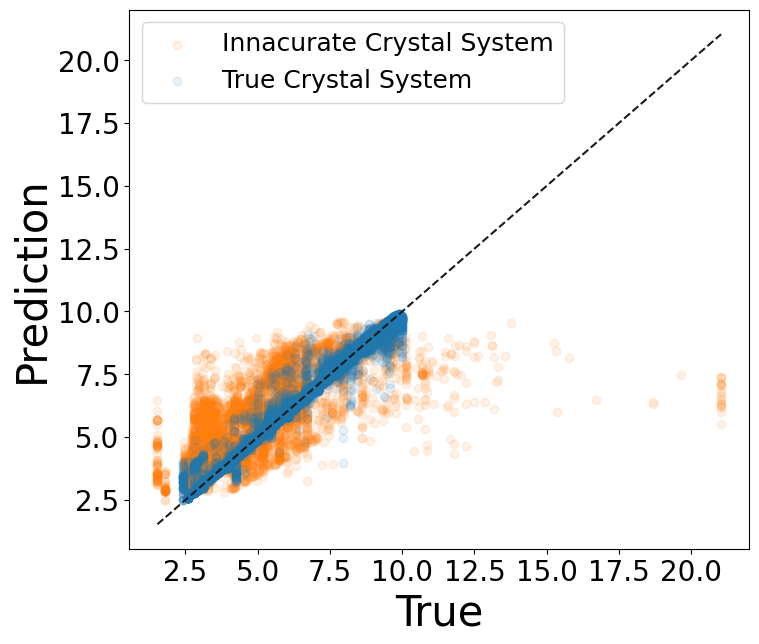

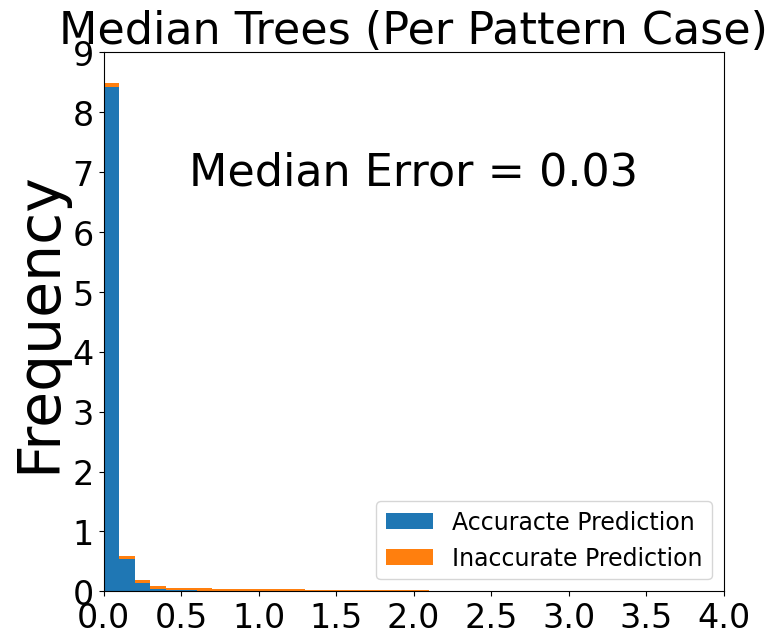

b
Median All 0.02999999999999936
0.9424613947707706


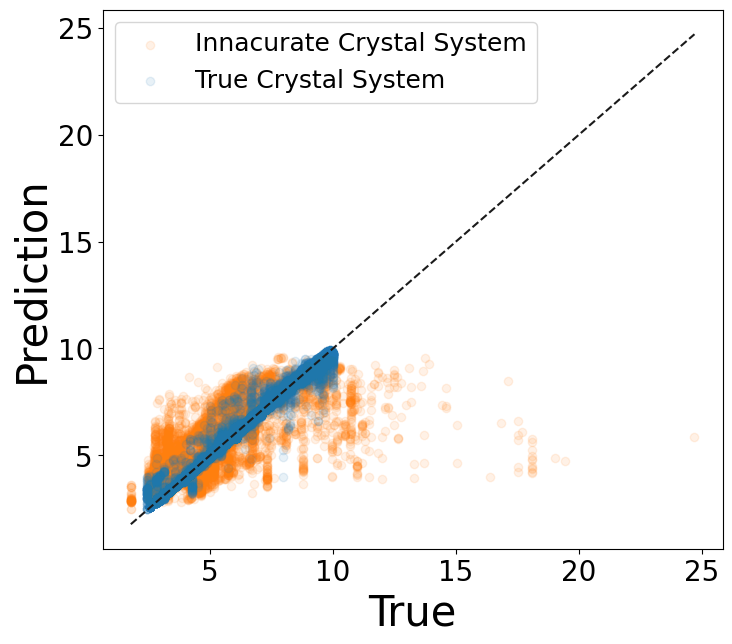

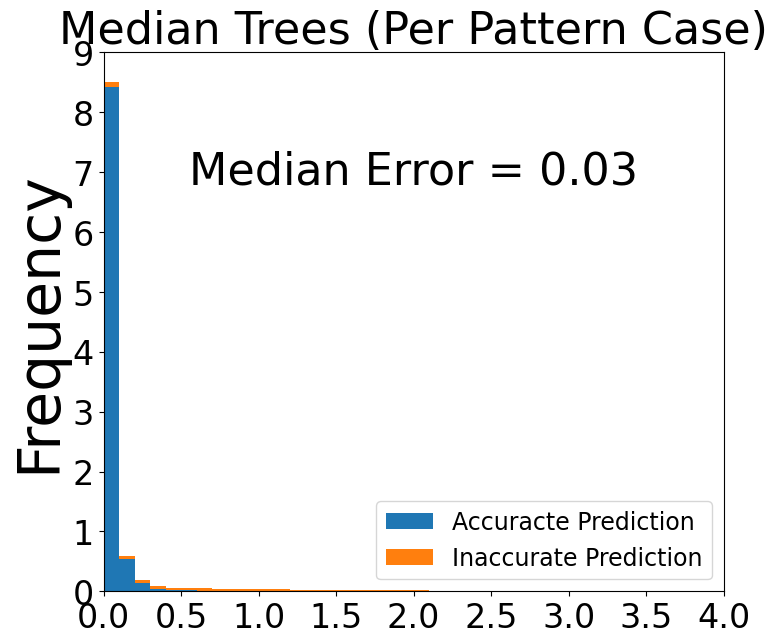

c
Median All 0.02999999999999936
0.6588207026701036


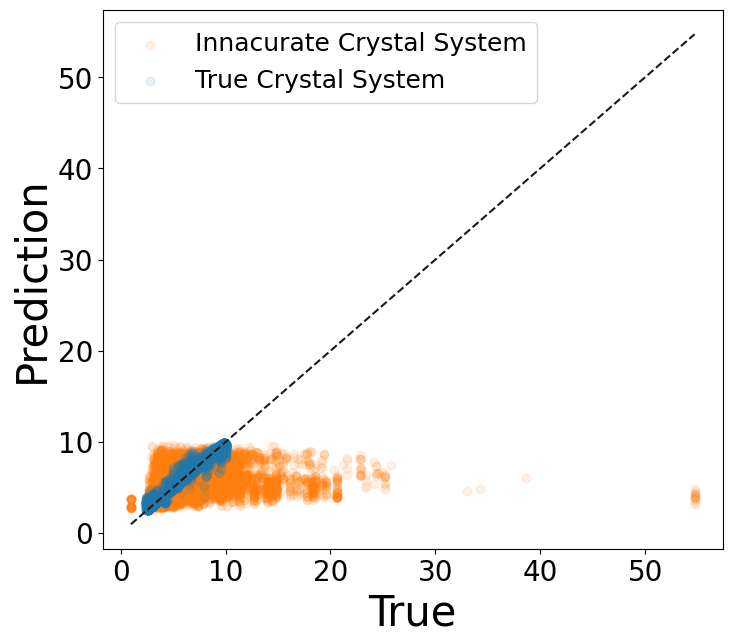

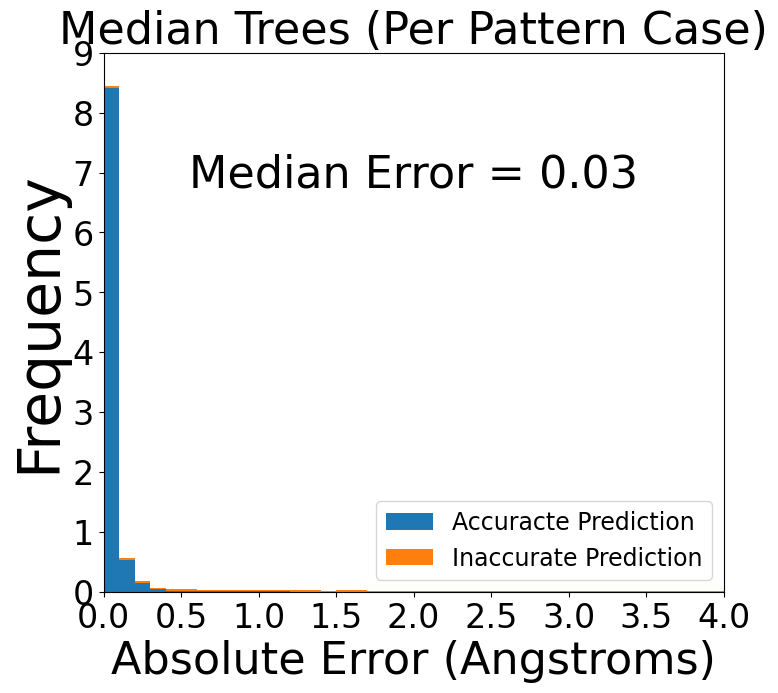

hexagonal
a
Median All 0.1200000000000001
0.8473841651197469


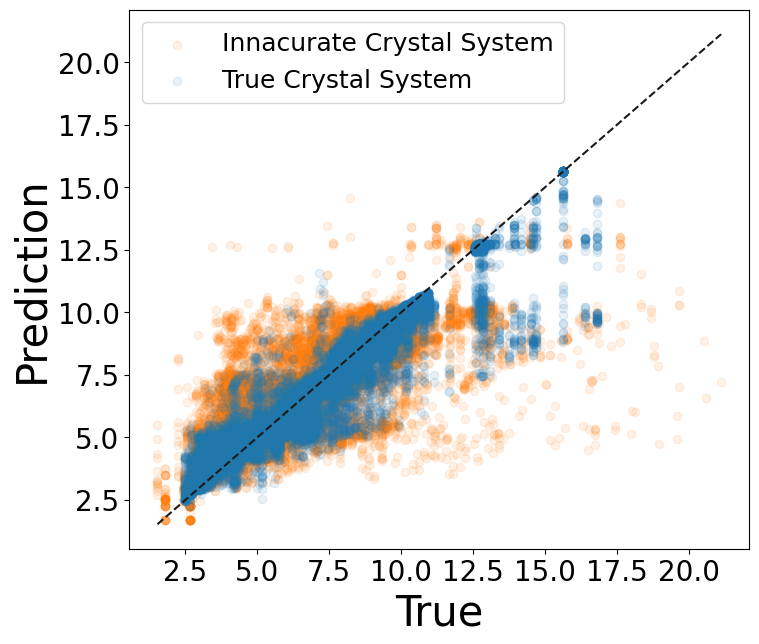

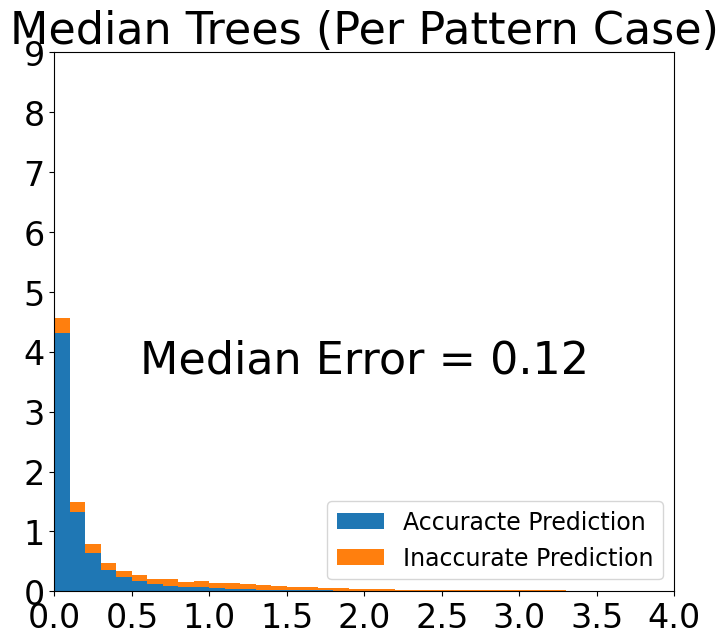

b
Median All 0.1200000000000001
0.7680488791153836


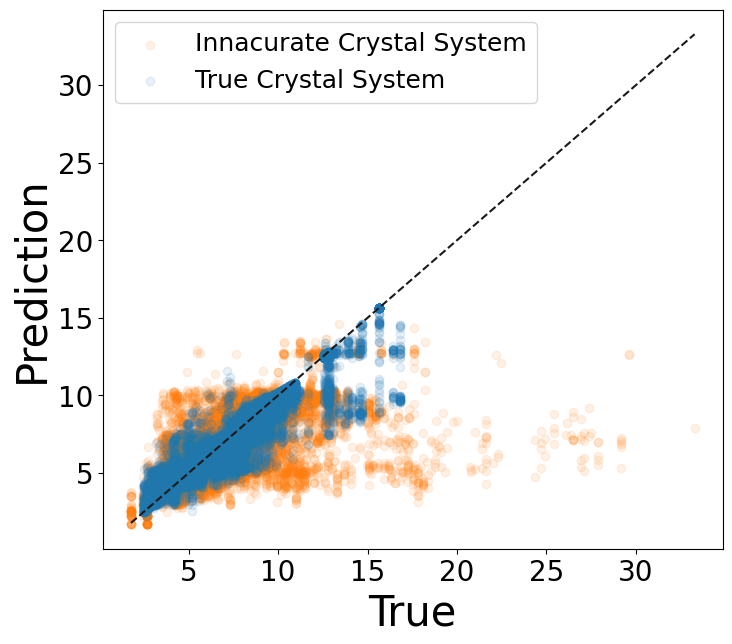

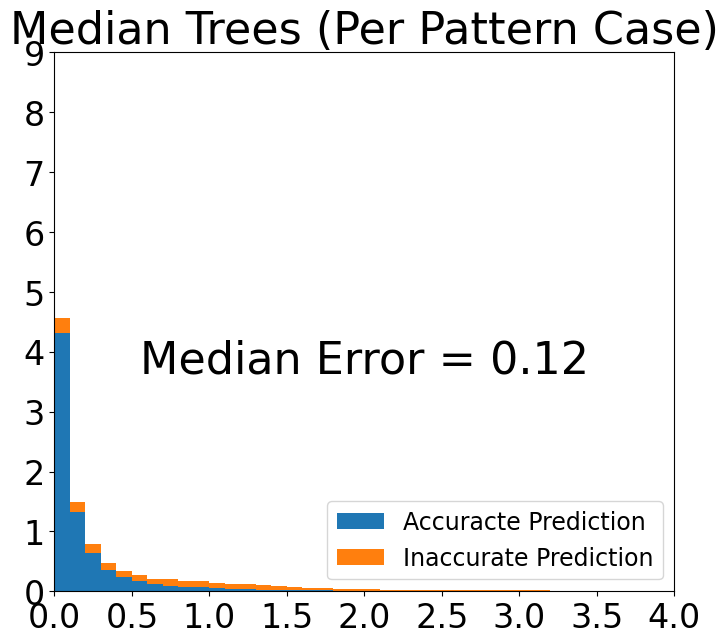

c
Median All 0.25500000000000034
0.5418827019291875


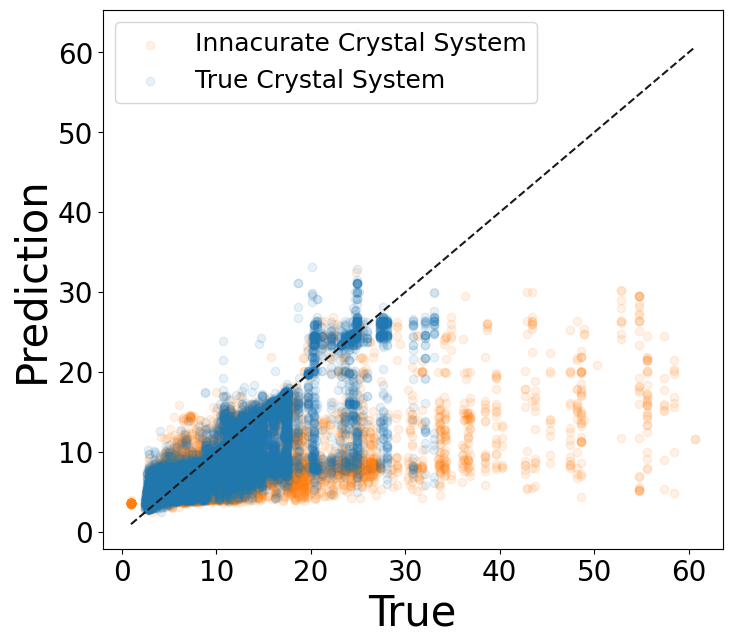

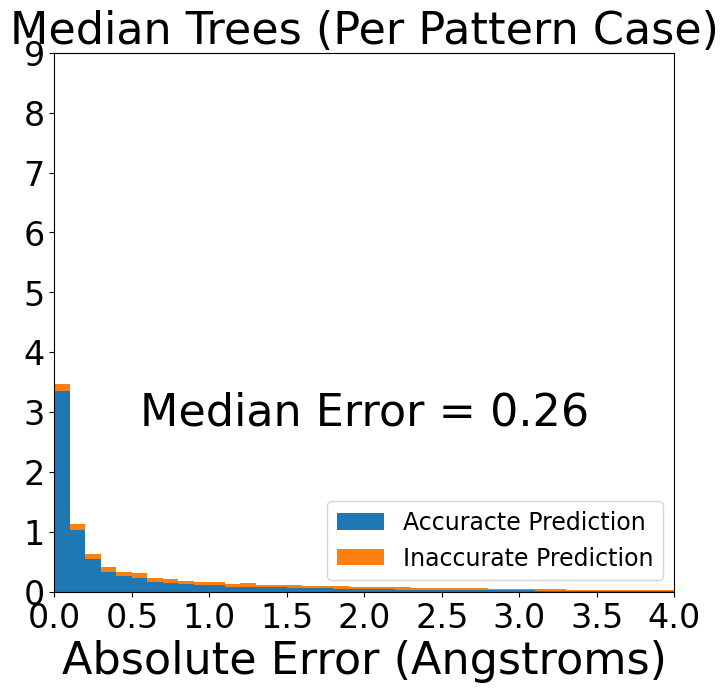

trigonal
a
Median All 0.09000000000000075
0.828954419203231


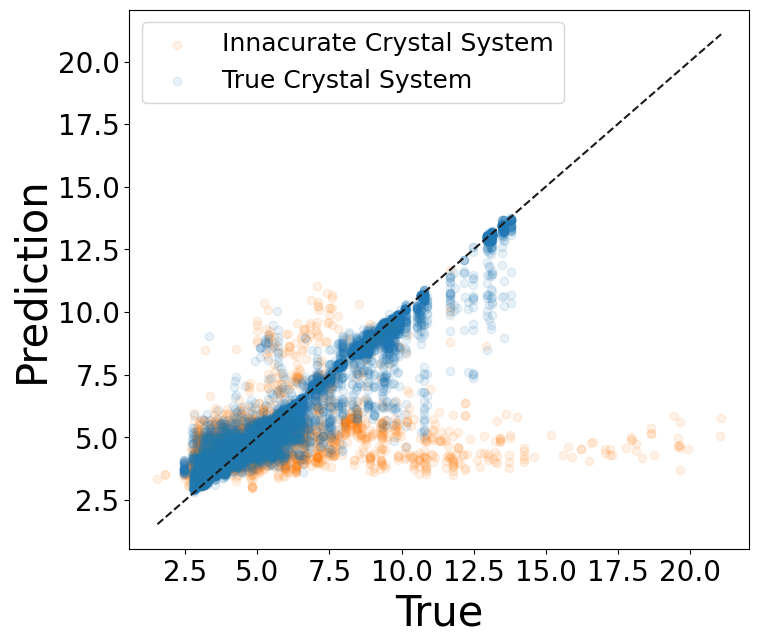

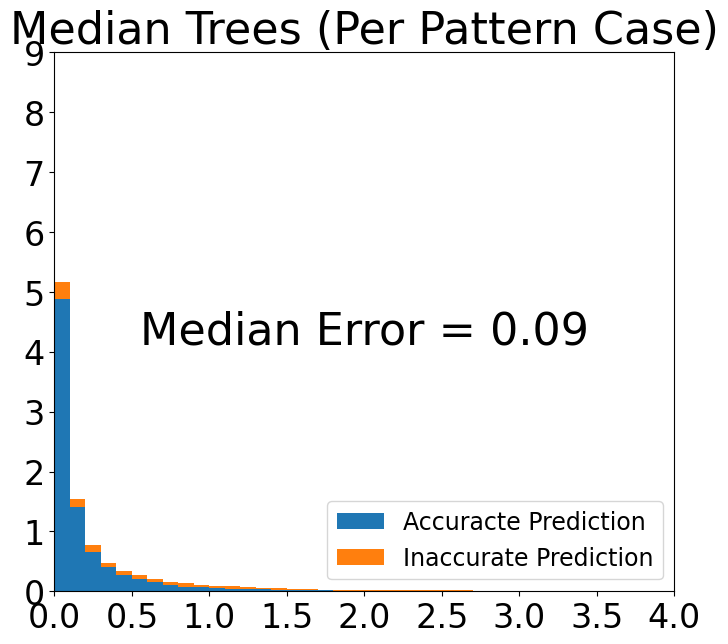

b
Median All 0.09000000000000075
0.8464694000115909


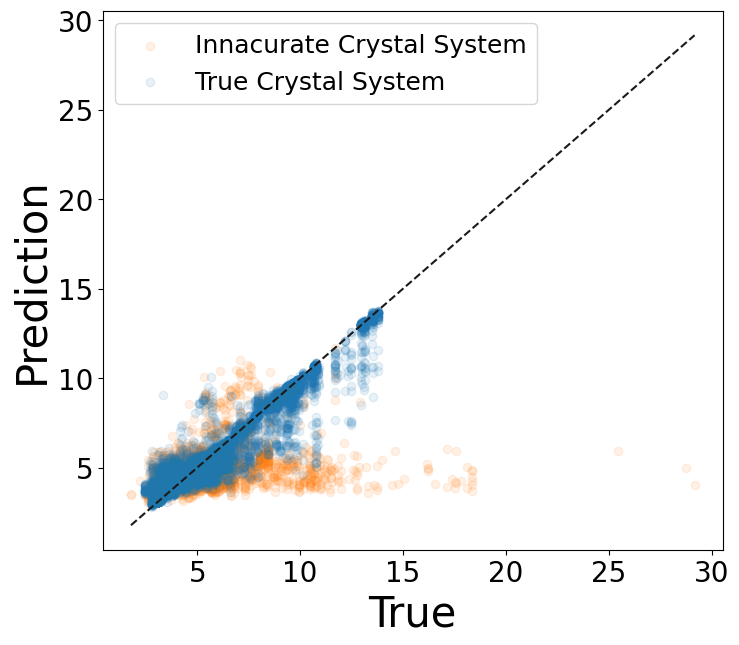

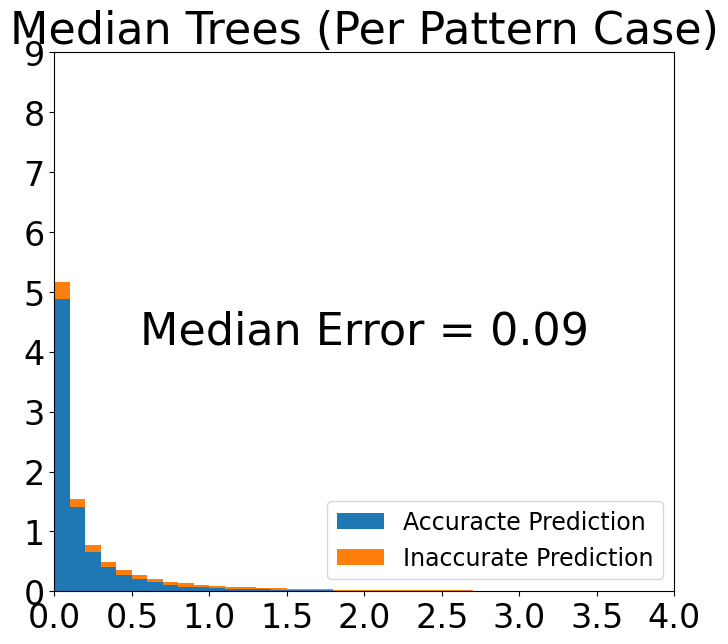

c
Median All 0.5950000000000006
0.7796042052381182


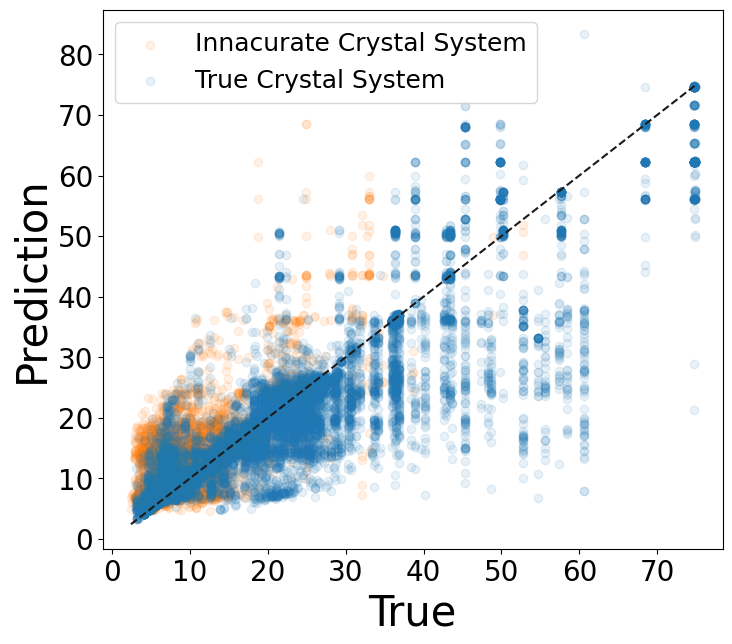

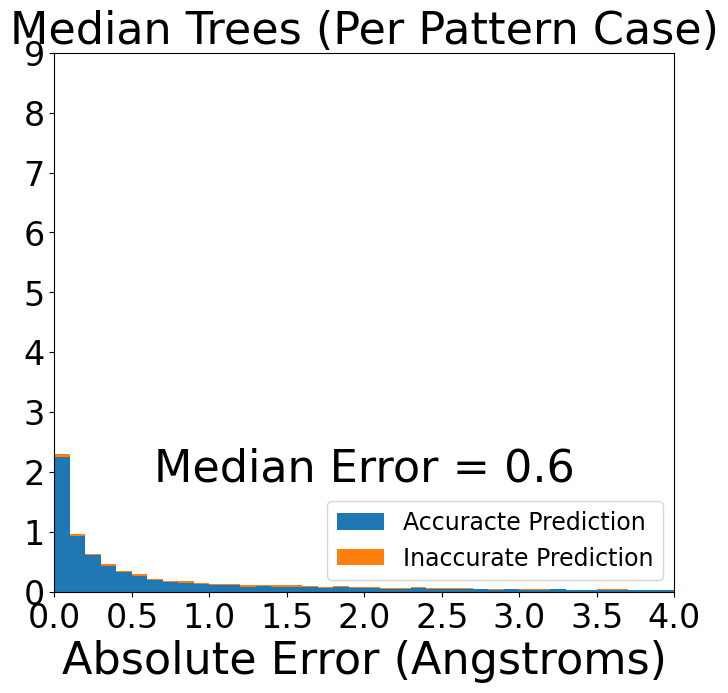

tetragonal
a
Median All 0.13000000000000078


In [ ]:
for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
# for cry_sys in ['cubic']:
    print(cry_sys)
    for pred_type in ['Median']:
        median_errors = rf_diff_obj.visualize_lattice_results_individual(cry_sys, cry_sys_type = 'Predictions Crystal System', 
                                                             prediction_type = pred_type, show_hists = True, show_r2 = True,  savefig=False,
                                                                         update_output_df_with_lattice = False, load_lattice_output_df_from_path = False, 
                                                                         savenp = False, output_df_path = 'output_df.joblib')

<font size="4"> Space Group

In [59]:
rf_diff_obj.loaded_submodels_space_group = [False, '']
for cry_sys in ['cubic', 'hexagonal','trigonal','tetragonal', 'monoclinic', 'orthorhombic']:
    print(cry_sys)
    df = rf_diff_obj.show_individual_sg_predictions(cry_sys, use_only_correct_cry_sys=False, regen_sg_predictions = False)
    # joblib.dump(df, cry_sys+'_sg_individ_df.joblib')
    # df.drop('radial_200_ang_Colin_basis', axis = 1, inplace = True)
    # joblib.dump(df, cry_sys+'NO_INPUT_VEC_sg_individ_df.joblib')

cubic
Accurate Accuracy
0.933408929206688
Inaccurate Accuracy
0.0
All Accuracy
0.8618028041795824
hexagonal
Accurate Accuracy
0.8352503702769987
Inaccurate Accuracy
0.0
All Accuracy
0.6519413117536372
trigonal
Accurate Accuracy
0.8300305786108574
Inaccurate Accuracy
0.0
All Accuracy
0.7124936083177092
tetragonal
Accurate Accuracy
0.7662471538452824
Inaccurate Accuracy
0.0
All Accuracy
0.5396594916308979
monoclinic
Accurate Accuracy
0.6471069770137425
Inaccurate Accuracy
0.0
All Accuracy
0.4031739010728616
orthorhombic
Accurate Accuracy
0.5470361048932395
Inaccurate Accuracy
0.0
All Accuracy
0.309605001887195


<font size="5"> Aggregate Patterns

<font size="4"> Crystal System

In [60]:
crystal_sys_alph = ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'monoclinic', 'orthorhombic']

with open('data/cm_ag_percent.pkl', 'rb') as f:
    df_cm = pickle.load(f)

trues = []
print('True Positive Rate')
for i in range(0, len(np.asarray(df_cm))):
    print(crystal_sys_alph[i] + ' ' + str(np.asarray(df_cm)[i][i]/sum(np.asarray(df_cm).T[i])))
    
trues = []
print('Sensitivity')
for i in range(0, len(np.asarray(df_cm))):
    print(crystal_sys_alph[i] + ' ' + str(np.asarray(df_cm)[i][i]/sum(np.asarray(df_cm)[i])))

True Positive Rate
cubic 0.9391304347826089
hexagonal 0.93
trigonal 0.975
tetragonal 0.854014598540146
monoclinic 0.7231833910034602
orthorhombic 0.7115987460815048
Sensitivity
cubic 0.9
hexagonal 0.7265625
trigonal 0.4936708860759493
tetragonal 0.6923076923076923
monoclinic 0.8969957081545064
orthorhombic 0.8376383763837638


<font size="4"> Lattice

cubic
a
Median All 0.020000000000000462
0.9784120892400645


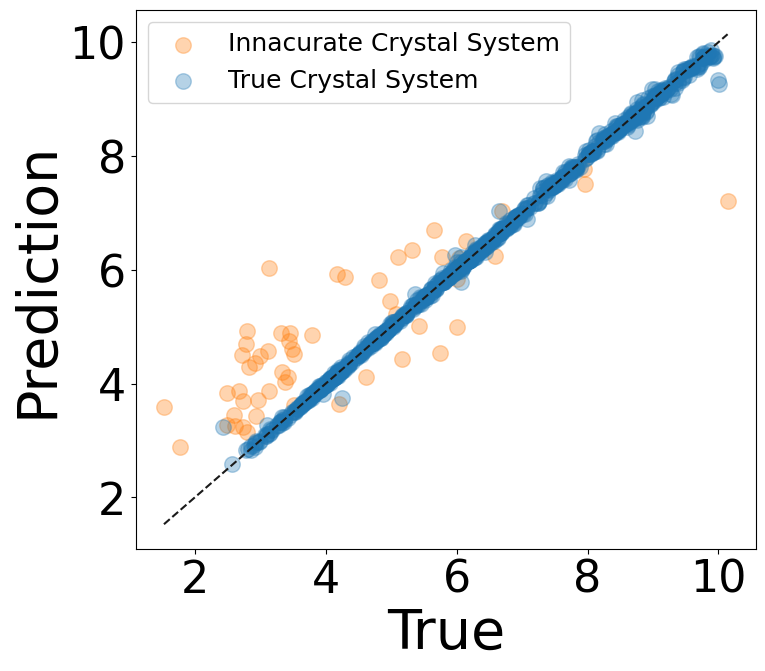

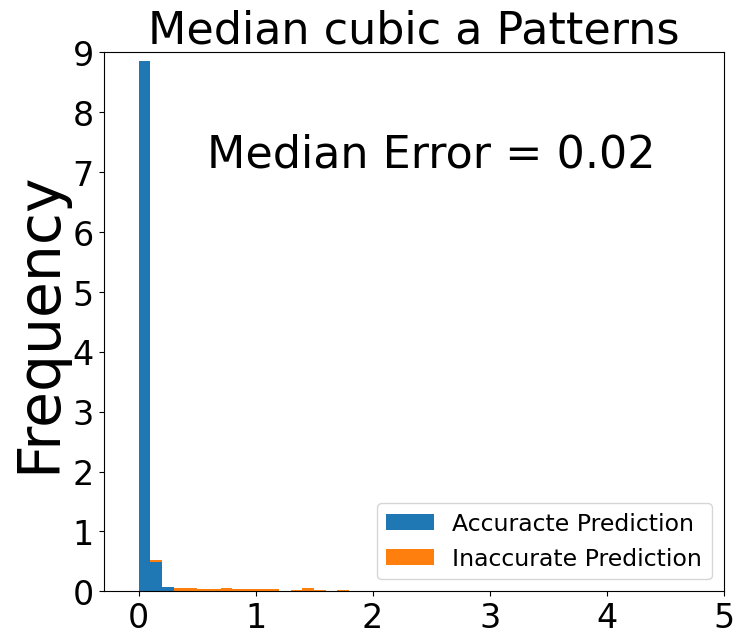

b
Median All 0.020000000000000462
0.9810991444990877


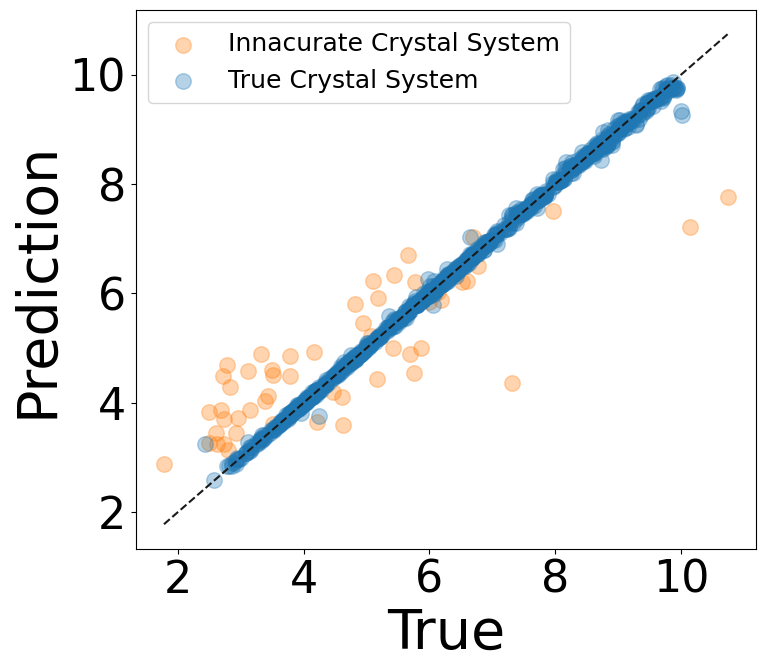

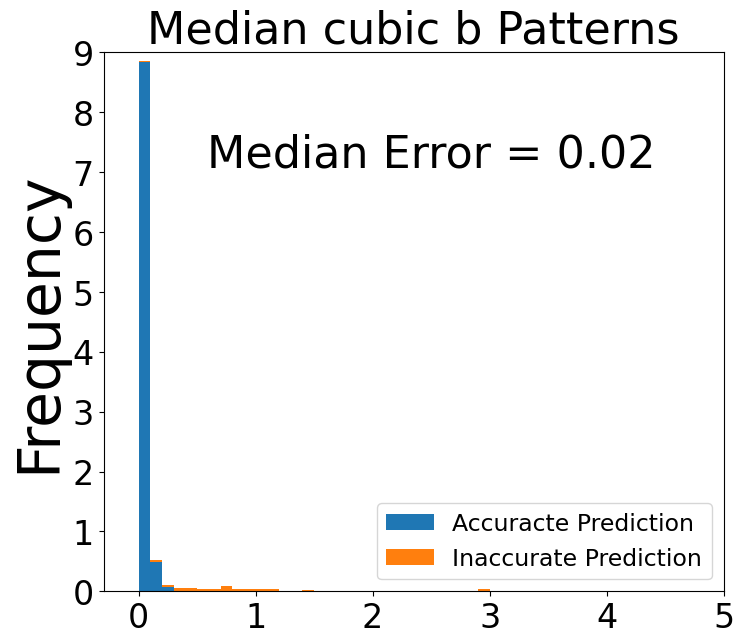

c
Median All 0.020000000000000462
0.8319265388434601


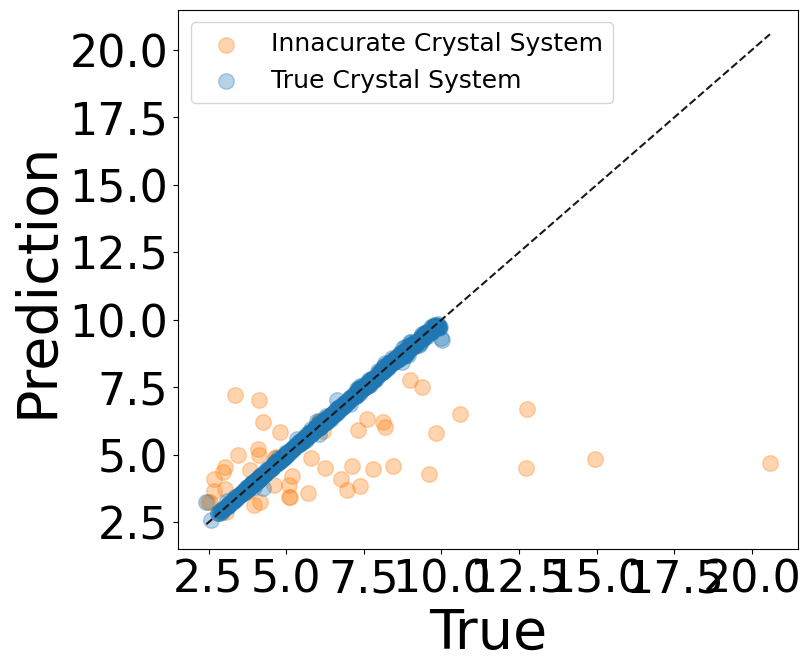

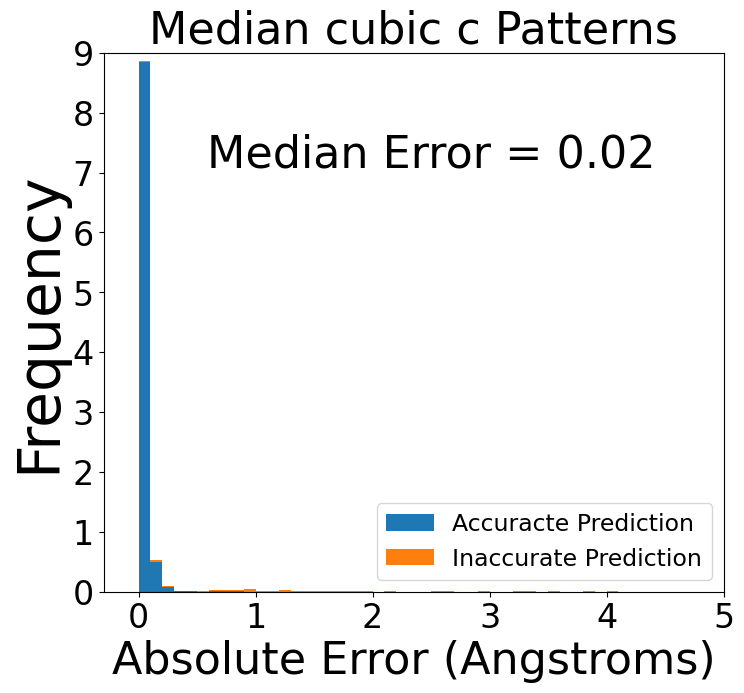

hexagonal
a
Median All 0.08500000000000041
0.9622476315775179


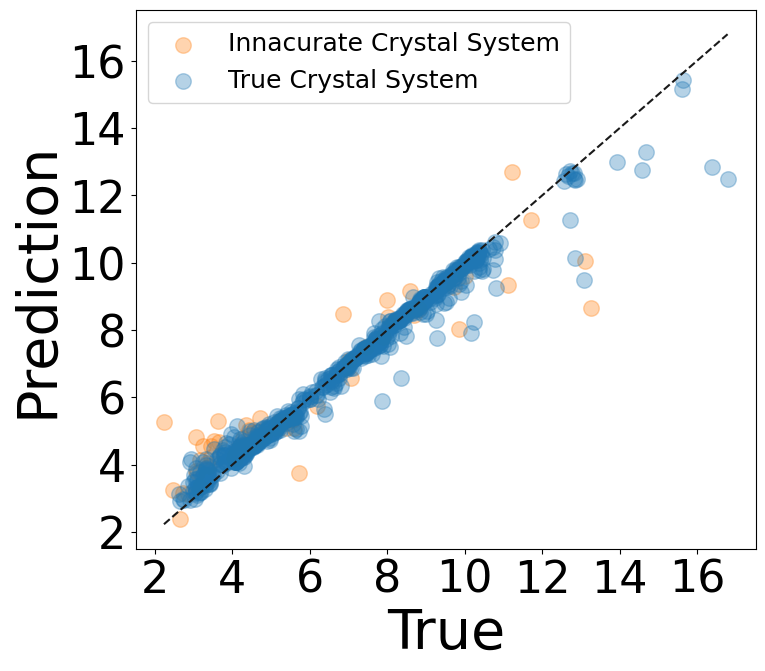

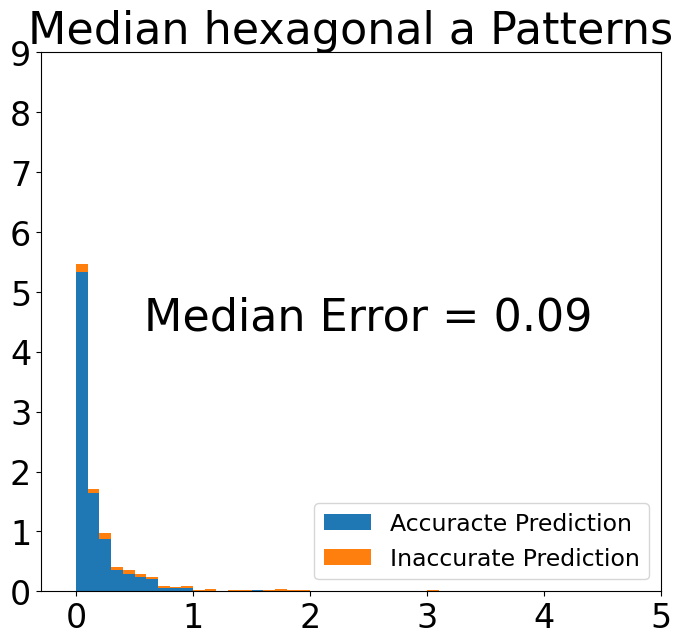

b
Median All 0.08500000000000041
0.9489437186182417


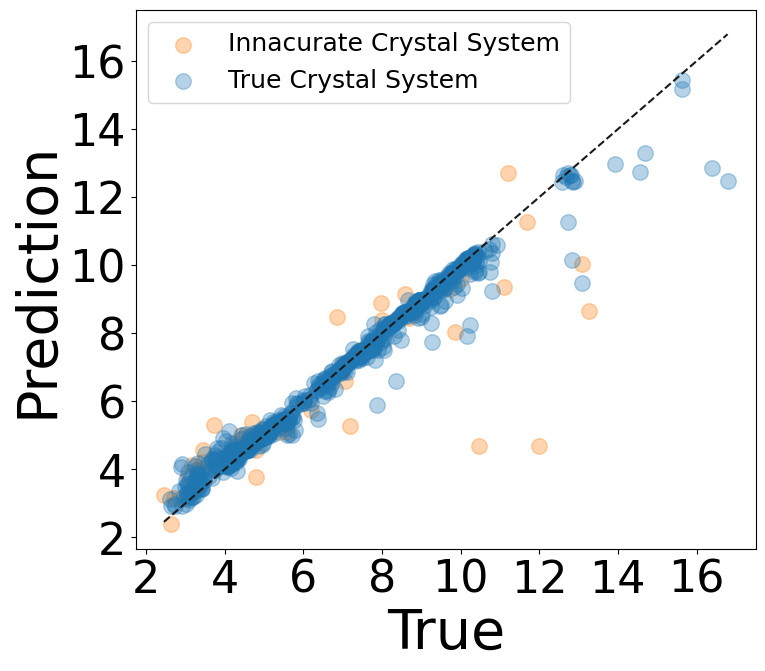

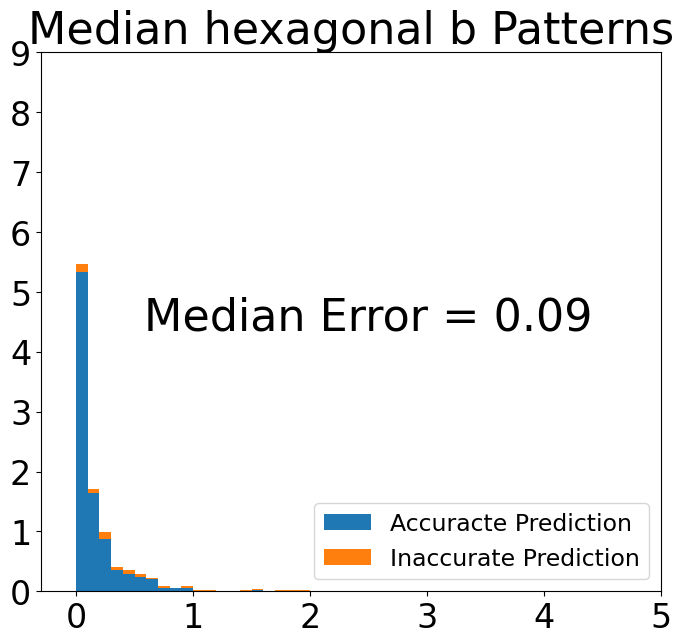

c
Median All 0.14374999999999982
0.7470212540045453


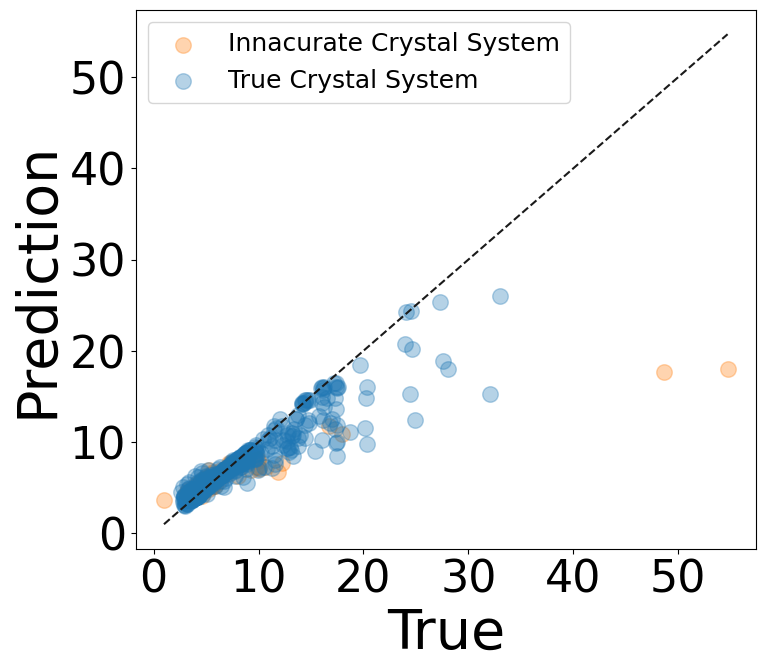

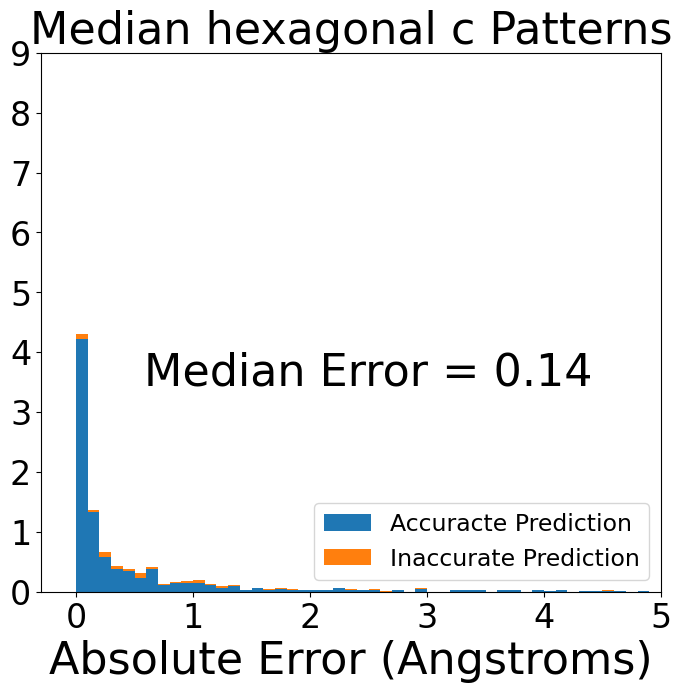

trigonal
a
Median All 0.07000000000000028
0.9861628203904802


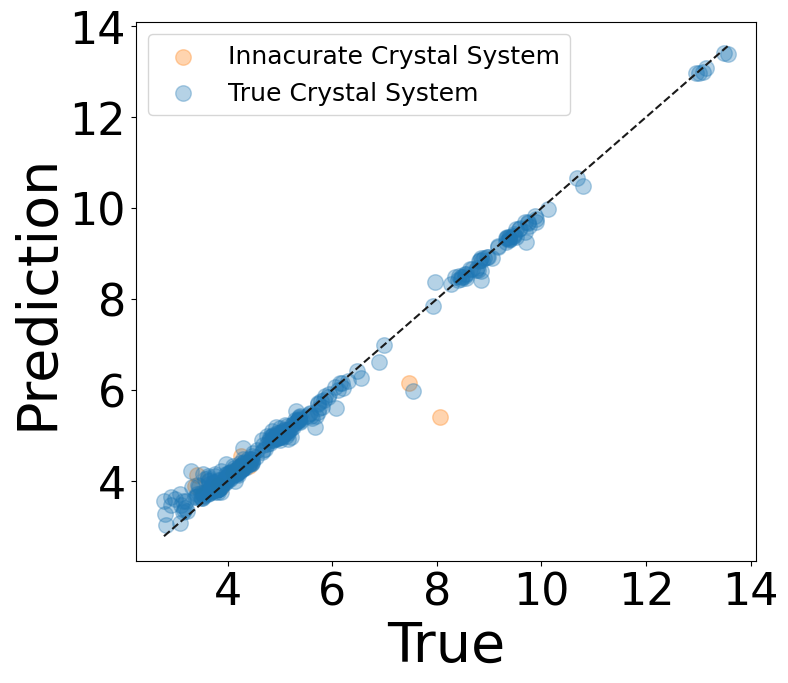

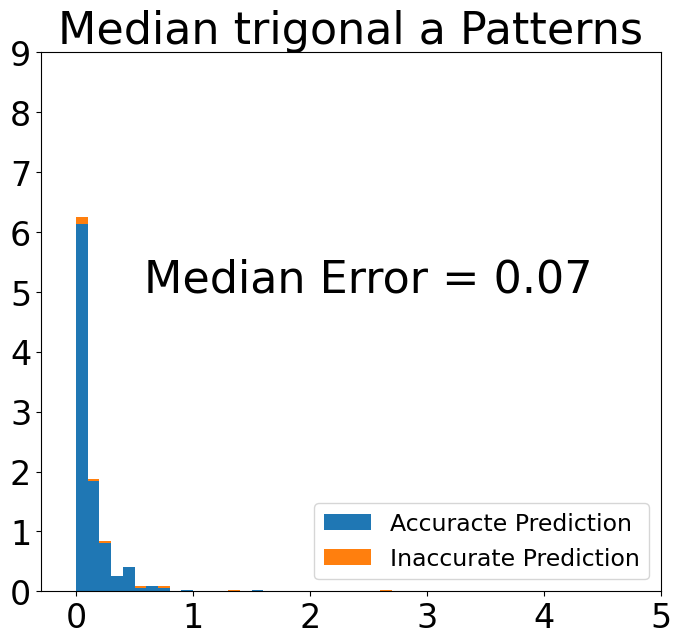

b
Median All 0.07000000000000028
0.9861628203904802


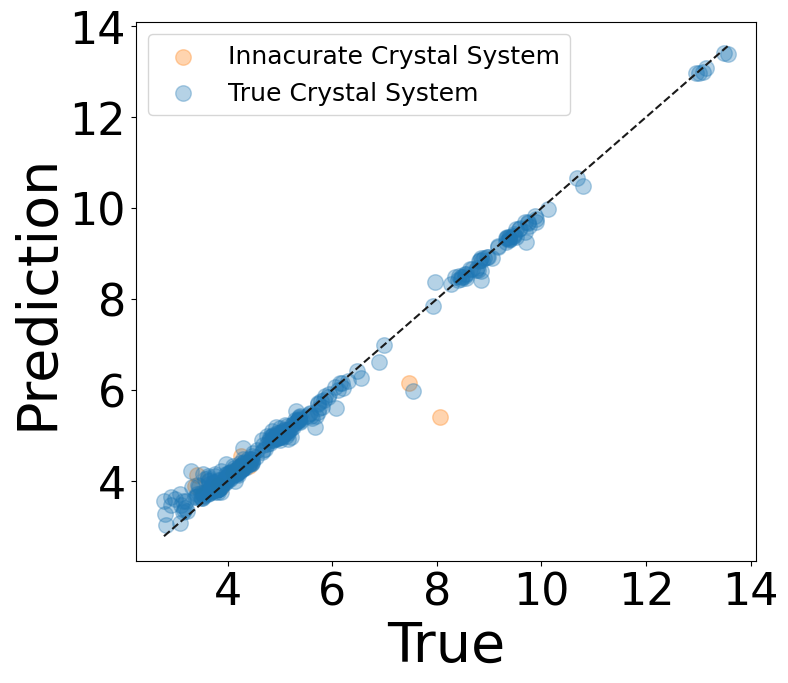

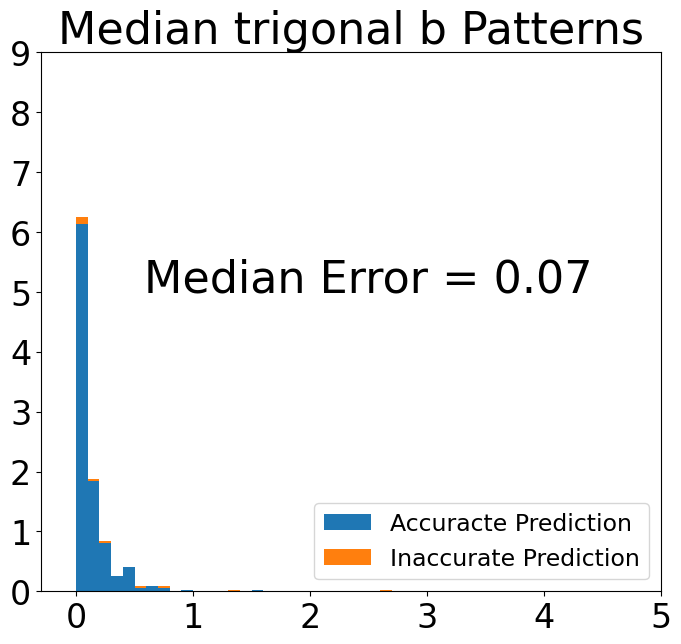

c
Median All 0.3962499999999993
0.862312363560019


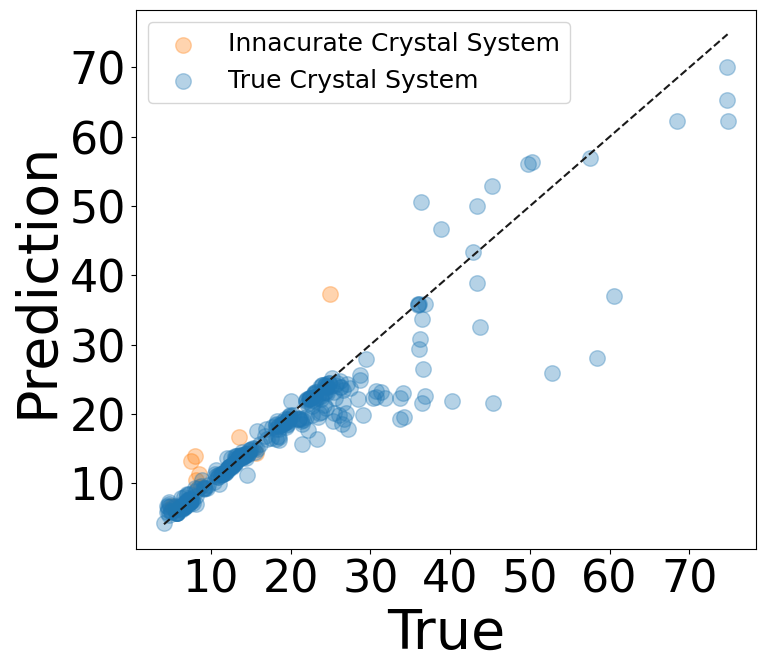

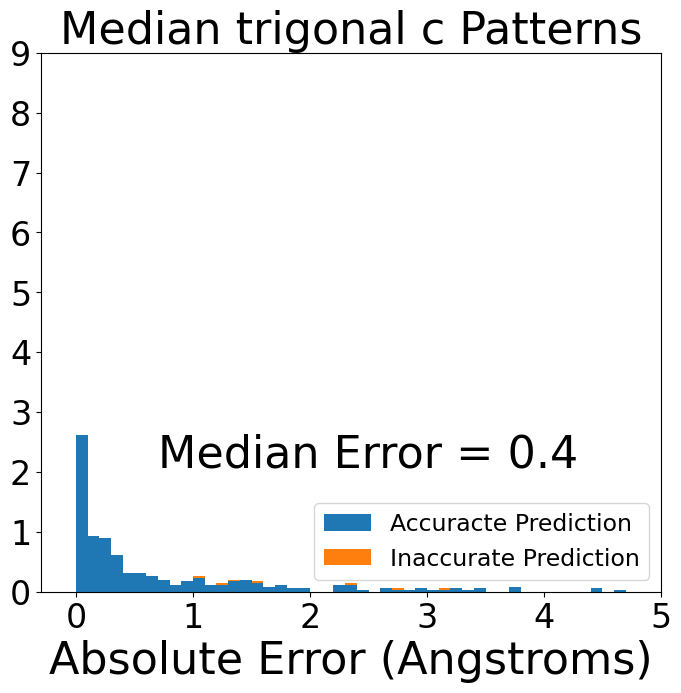

tetragonal
a
Median All 0.0674999999999999
0.9111105973207567


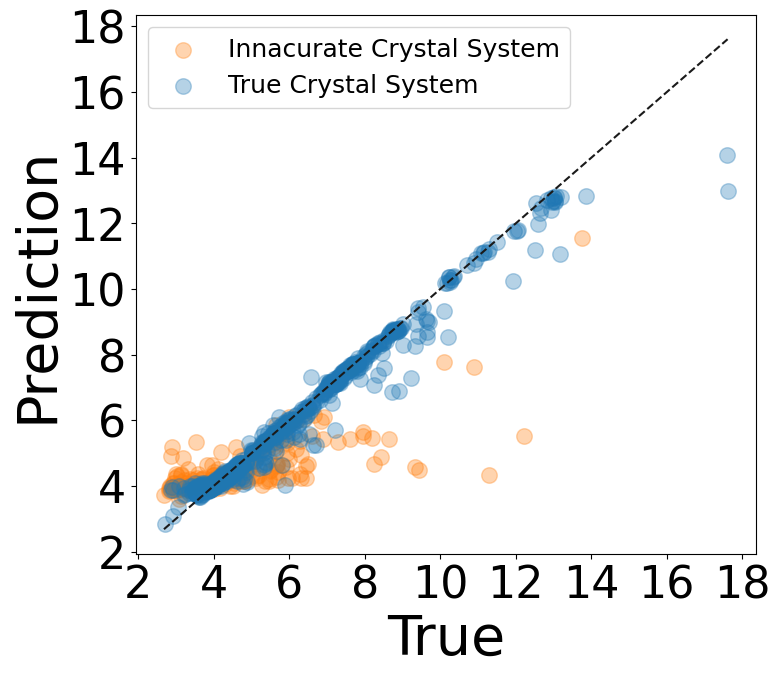

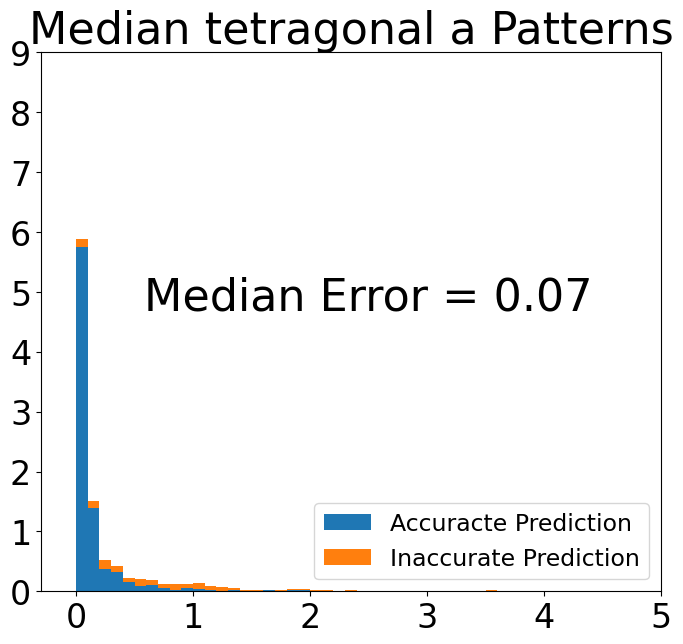

b
Median All 0.06500000000000039
0.907183476952859


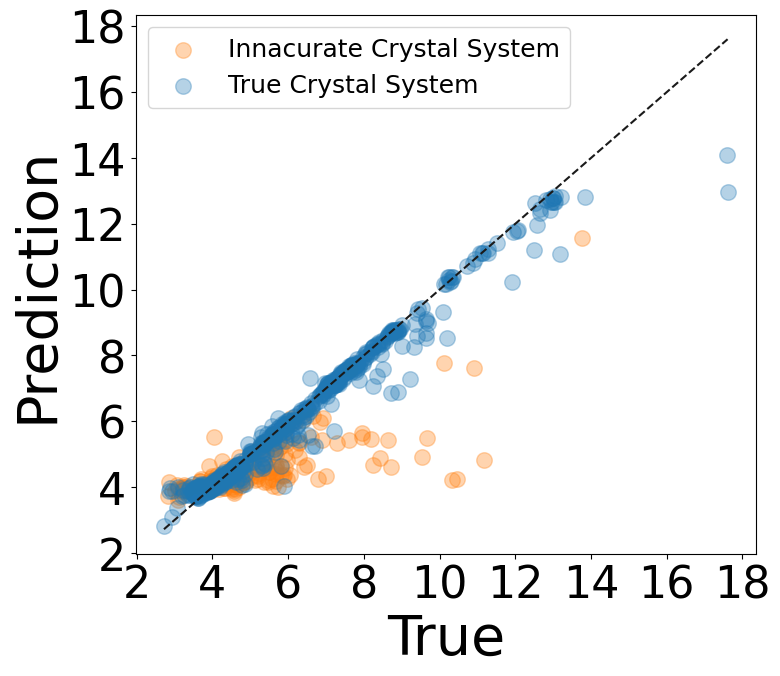

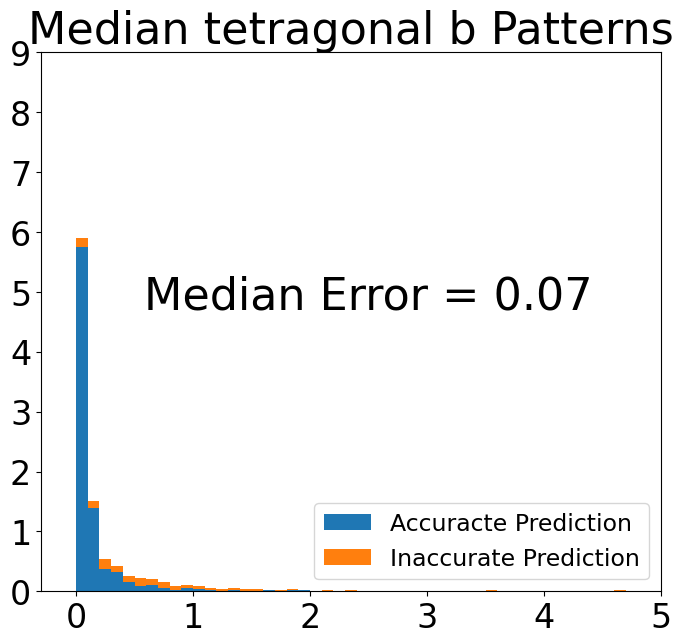

c
Median All 0.26374999999999993
0.6280516666426162


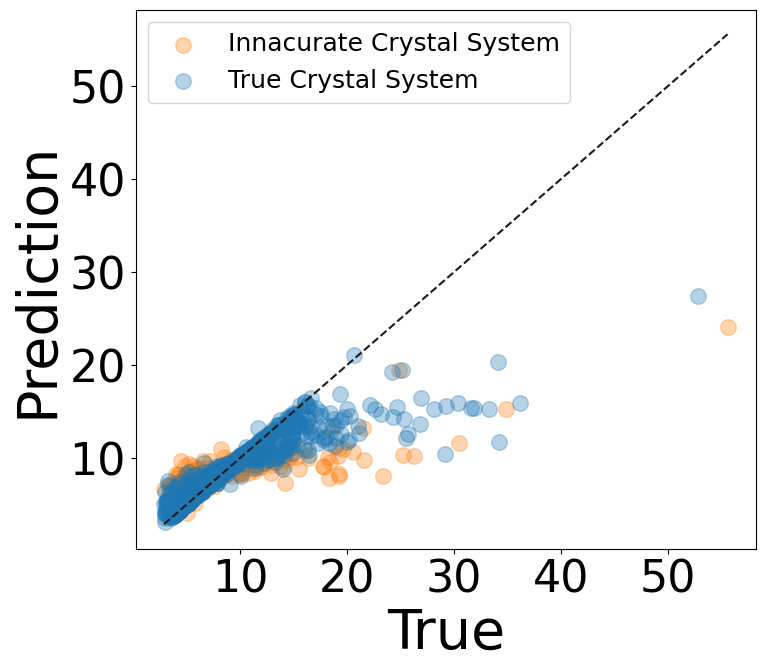

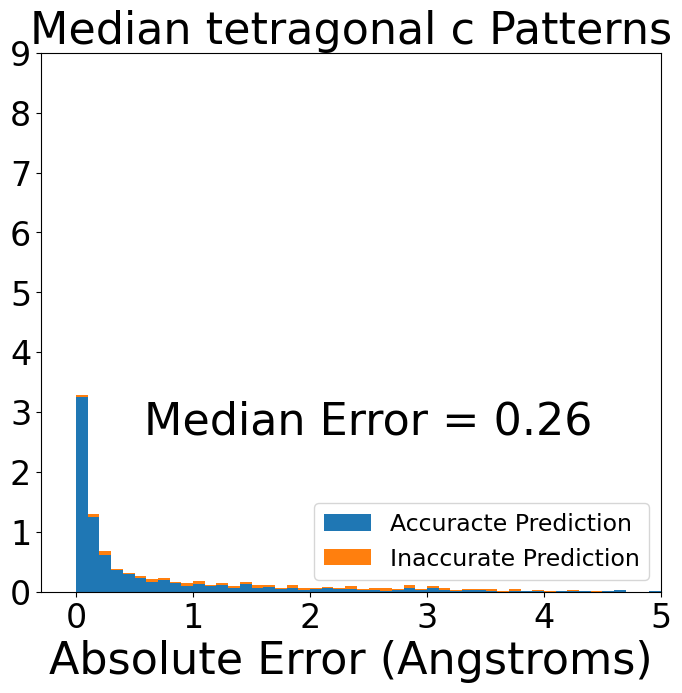

orthorhombic
a
Median All 0.5124999999999993
0.492754168337766


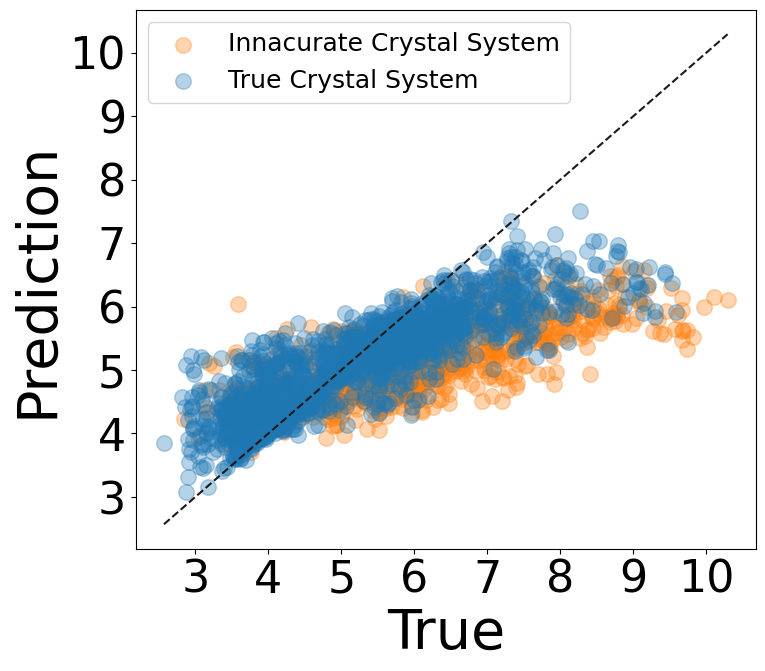

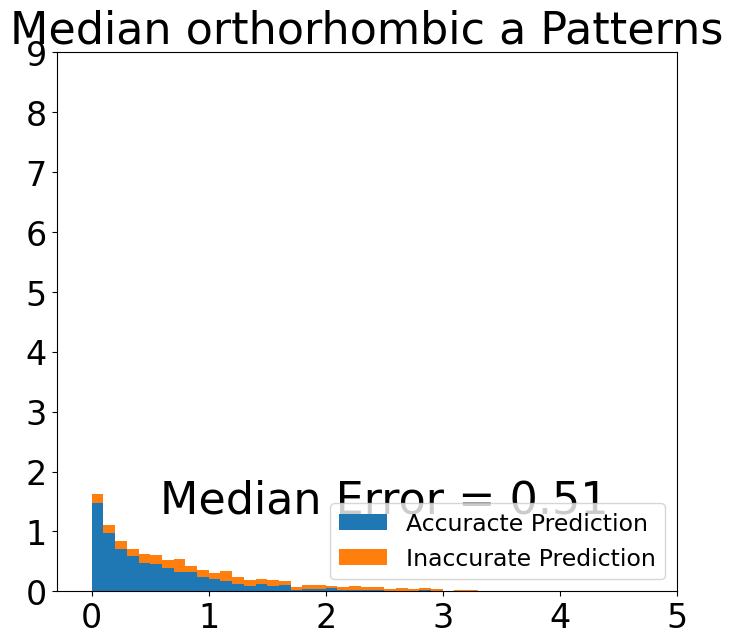

b
Median All 0.6425000000000001
0.6805875848877055


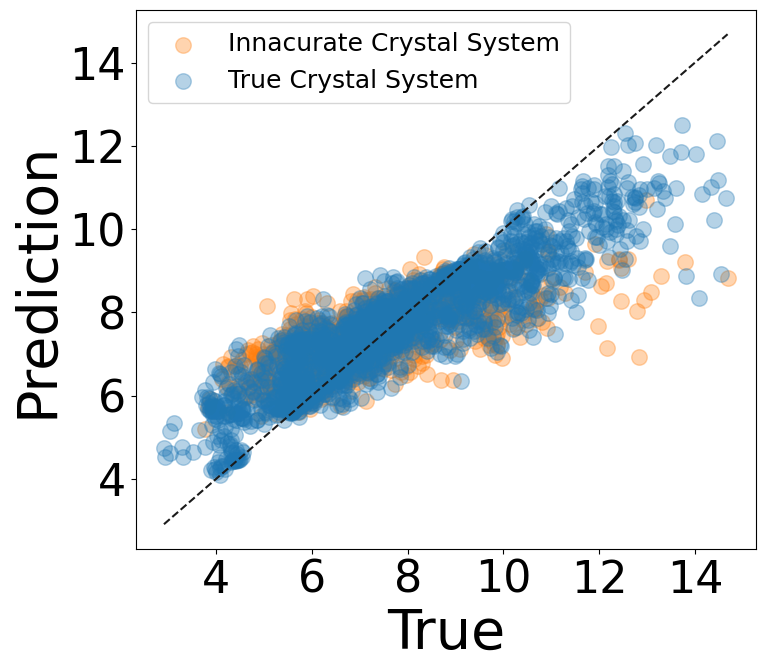

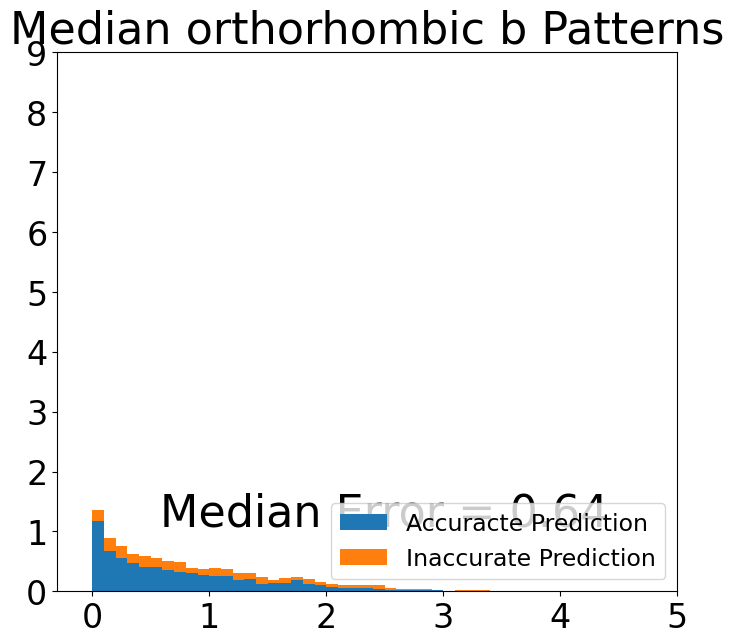

c
Median All 1.2025000000000006
0.485226076596849


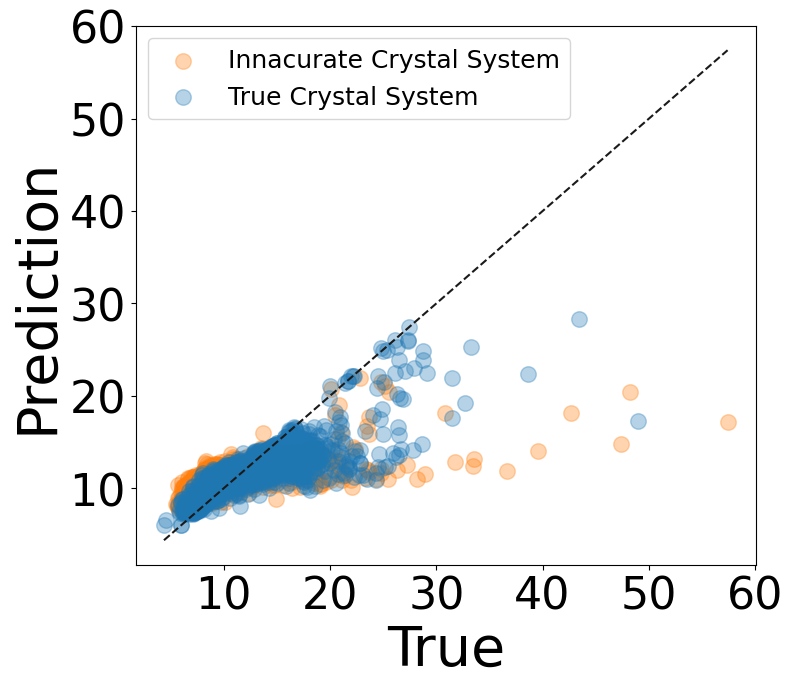

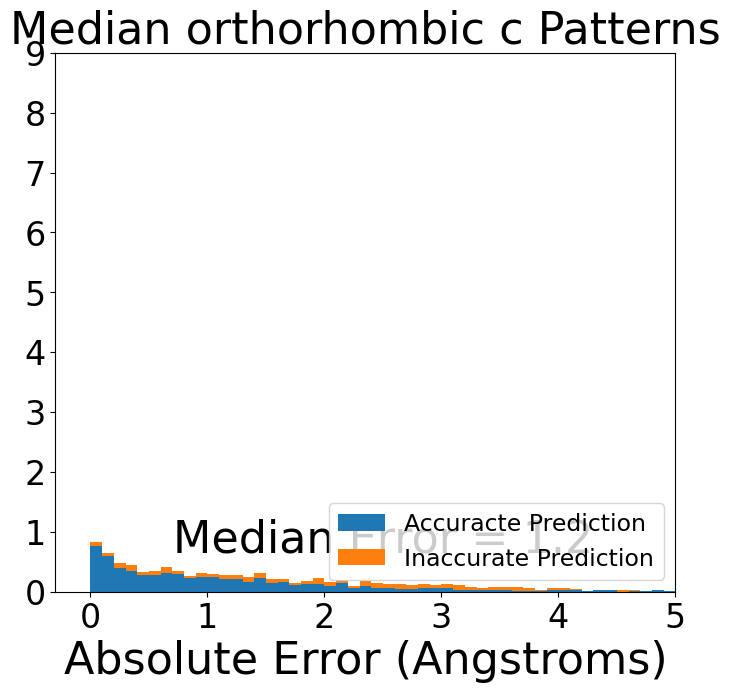

monoclinic
a
Median All 1.2674999999999992
0.28259638166462475


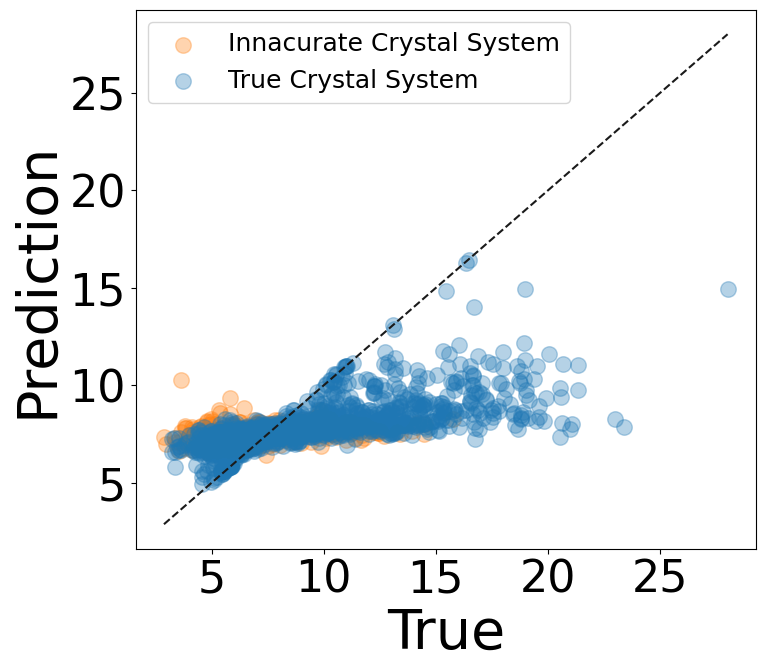

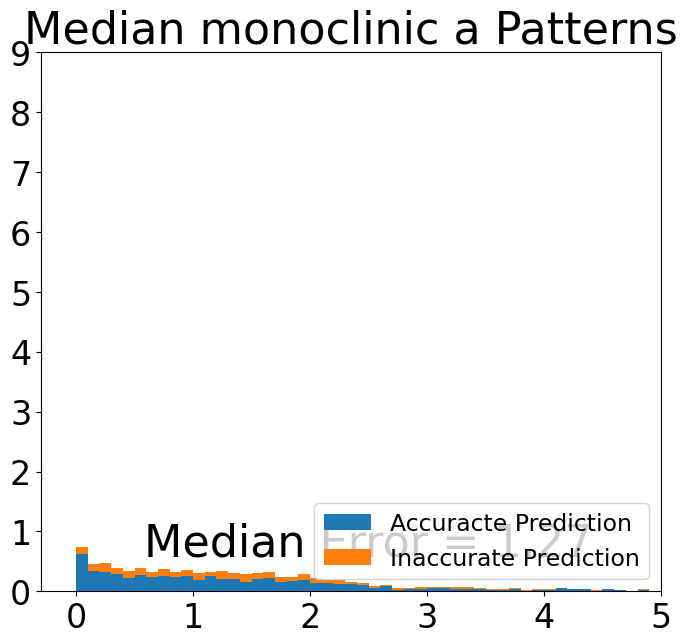

b
Median All 1.0675
0.36410628286213276


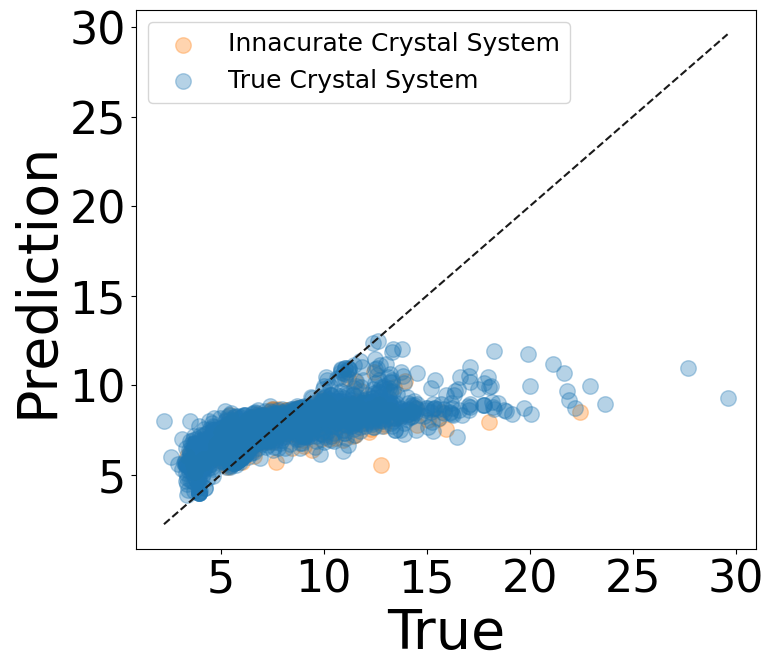

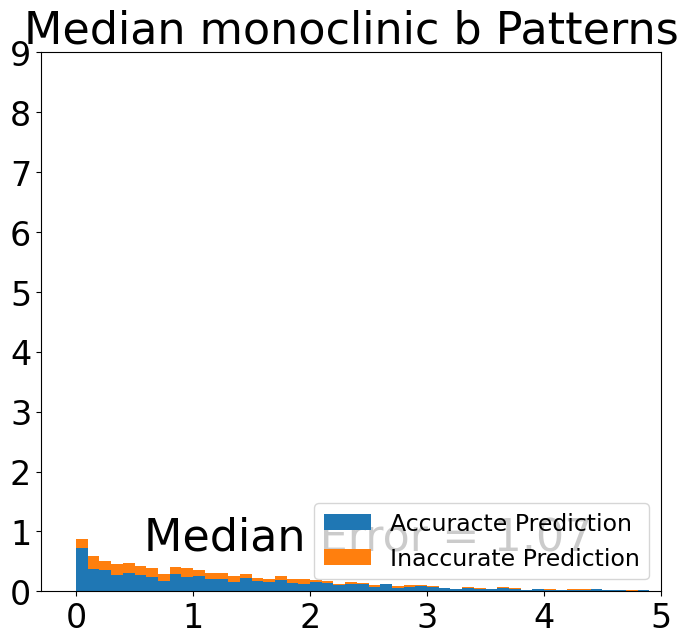

c
Median All 1.402499999999999
0.1755743954543868


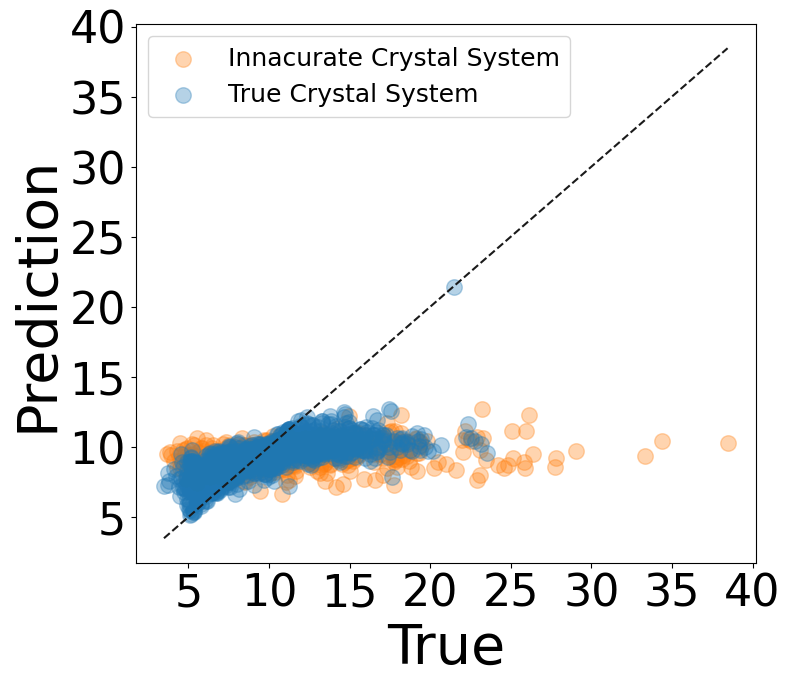

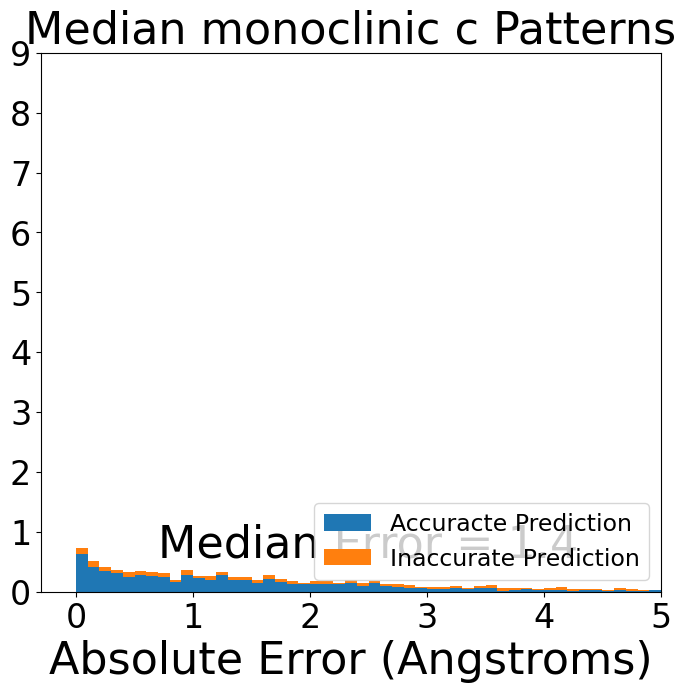

In [61]:
for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
    print(cry_sys)
    plt.rcParams['pdf.fonttype'] = 'truetype'
    df = rf_diff_obj.visualize_lattice_results_aggregate(cry_sys, cry_sys_type = 'Aggregate Predictions Crystal System', 
                                                             prediction_type = 'Median', show_hists = True, show_r2 = True, 
                                                         savefig = False, savenp = False, ylims = [0,9])

<font size="4"> Space Group

In [62]:
for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
# for cry_sys in ['trigonal']:
    rf_diff_obj.loaded_submodels_space_group = [False, '']
    print(cry_sys)
    df = rf_diff_obj.visualize_space_group_results_aggregate(cry_sys, regen_sg_predictions = False)
    # joblib.dump(df, cry_sys+'_aggregate_sg_df.joblib')

cubic
Accurate Accuracy
0.9471413160733549
Inaccurate Accuracy
0.0
All Accuracy
0.8950050968399592
hexagonal
Accurate Accuracy
0.8672566371681416
Inaccurate Accuracy
0.0
All Accuracy
0.8032786885245902
trigonal
Accurate Accuracy
0.8779761904761905
Inaccurate Accuracy
0.0
All Accuracy
0.8526011560693642
tetragonal
Accurate Accuracy
0.8368368368368369
Inaccurate Accuracy
0.0
All Accuracy
0.7096774193548387
orthorhombic
Accurate Accuracy
0.5548686244204019
Inaccurate Accuracy
0.0
All Accuracy
0.39610150790731885
monoclinic
Accurate Accuracy
0.6194739787353106
Inaccurate Accuracy
0.0
All Accuracy
0.4479967624443545


<font size="5"> Figure S3 Individual Prediction With Triclinic

In [65]:
triclinic_rf_diff_obj = RF_Diffraction_model(output_df = 'data/triclinic_output_df_radial.joblib')

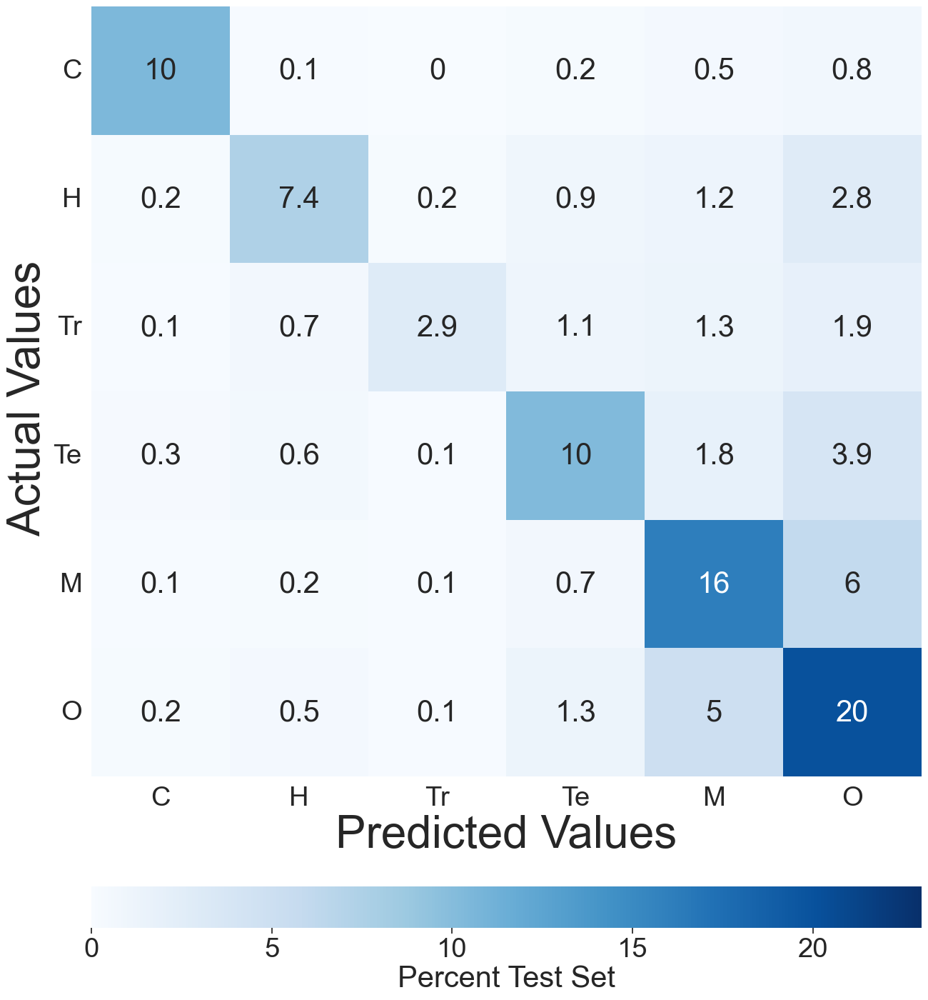

       C     H    Tr    Te     M     O
C   77.0  33.0  31.0  32.0  38.0  34.0
H   40.0  48.0  34.0  33.0  40.0  37.0
Tr  33.0  34.0  44.0  32.0  40.0  33.0
Te  38.0  35.0  31.0  51.0  40.0  36.0
M   33.0  32.0  32.0  32.0  55.0  39.0
O   35.0  33.0  27.0  33.0  46.0  48.0


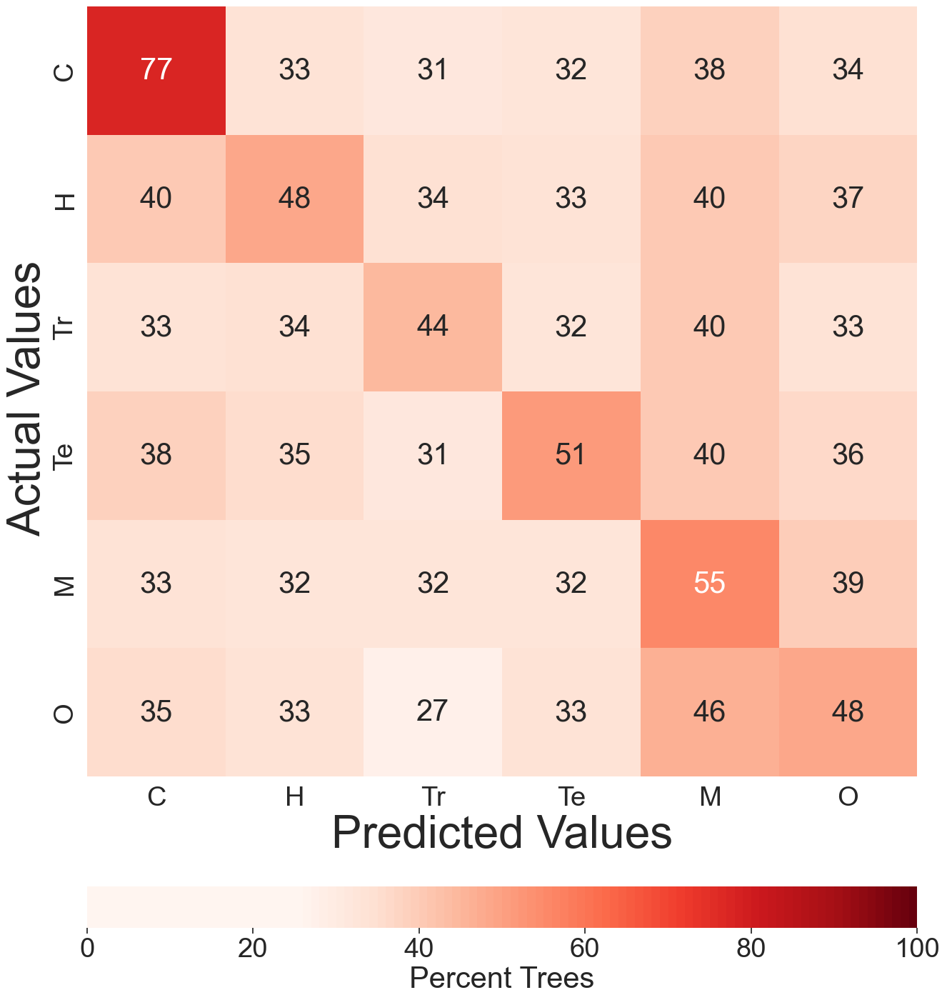

In [70]:
rf_diff_obj.show_cm_and_uncertianty_individual_prediction(savefigure=False, reset_output_df = False, visualize_from_saved_data = True, save_cm = True,
                                                          saved_accuracy_cm = 'data/triclinic_individual_pattern_df_cm_percent.pkl', 
                                                          saved_confidence_cm = 'data/triclinic_individual_pattern_prediction_matrix_confidence.npy',
                                                         figure_path = ['tri_individual_prediction_accuracy.pdf', 
                                                                   'tri_individual_prediction_confidence.pdf'])

In [72]:
crystal_sys_alph = ['cubic', 'hexagonal',  'monoclinic', 'orthorhombic', 'tetragonal', 'triclinic', 'trigonal']

with open('data/triclinic_df_cm_percent_unrounded.pkl', 'rb') as f:
    df_cm = pickle.load(f)

trues = []
print('True Positive Rate')
for i in range(0, len(np.asarray(df_cm))):
    print(crystal_sys_alph[i] + ' ' + str(np.asarray(df_cm)[i][i]/sum(np.asarray(df_cm).T[i])))
    
trues = []
print('Sensitivity')
for i in range(0, len(np.asarray(df_cm))):
    print(crystal_sys_alph[i] + ' ' + str(np.asarray(df_cm)[i][i]/sum(np.asarray(df_cm)[i])))

True Positive Rate
cubic 0.923141920908781
hexagonal 0.7696574907903522
monoclinic 0.5521763325349012
orthorhombic 0.5379681415154185
tetragonal 0.6687025998074856
triclinic 0.663656233544208
trigonal 0.8384215449933436
Sensitivity
cubic 0.8559942829590853
hexagonal 0.5761608177488368
monoclinic 0.6717435091163994
orthorhombic 0.7392613834976149
tetragonal 0.6115569696706524
triclinic 0.14306217938052312
trigonal 0.38057641688420213


<font size="6"> Figure 6

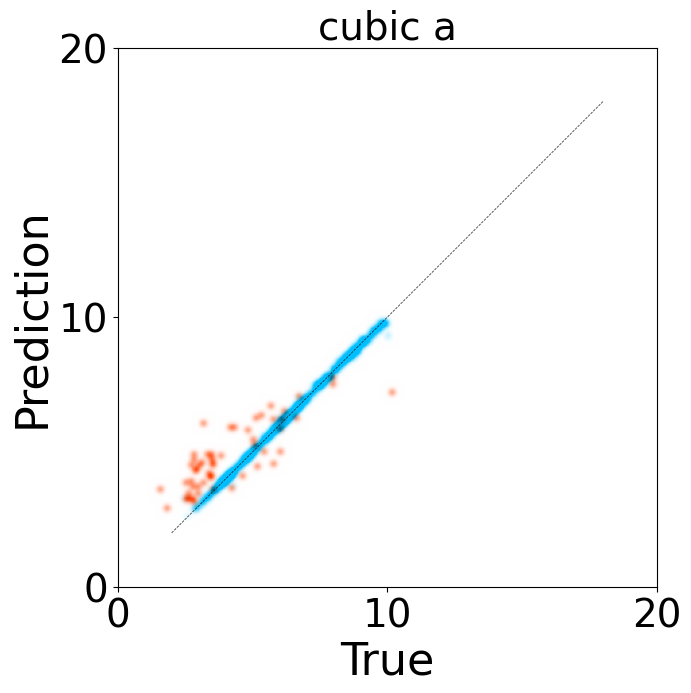

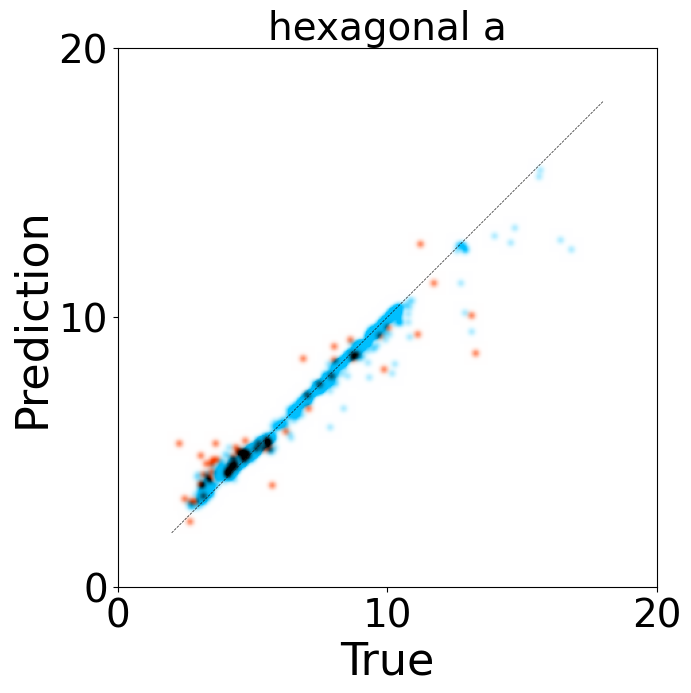

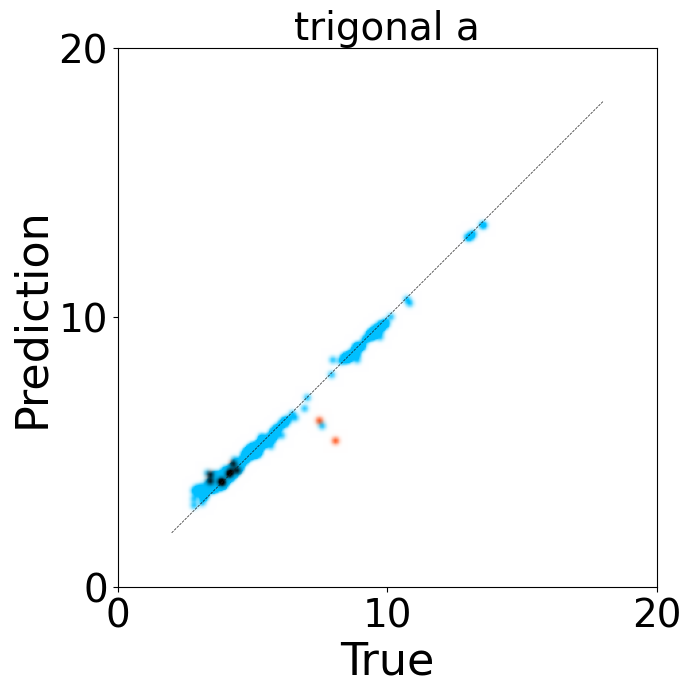

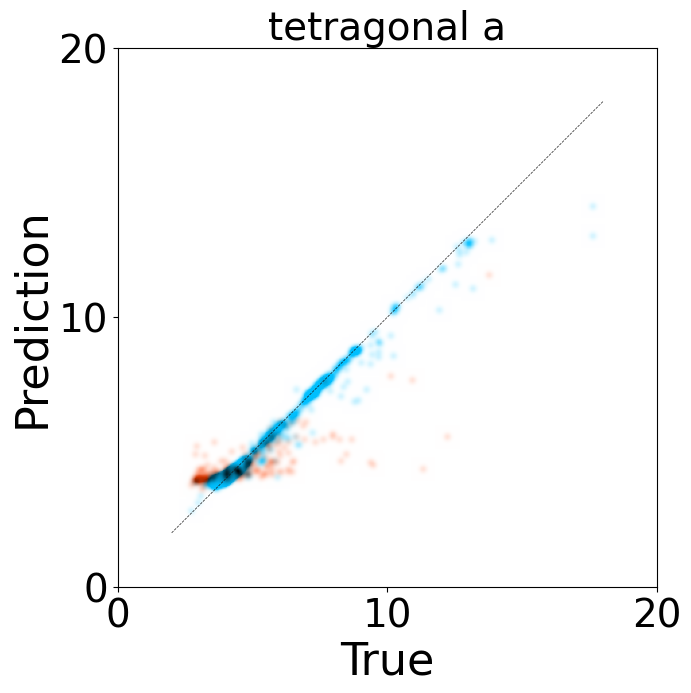

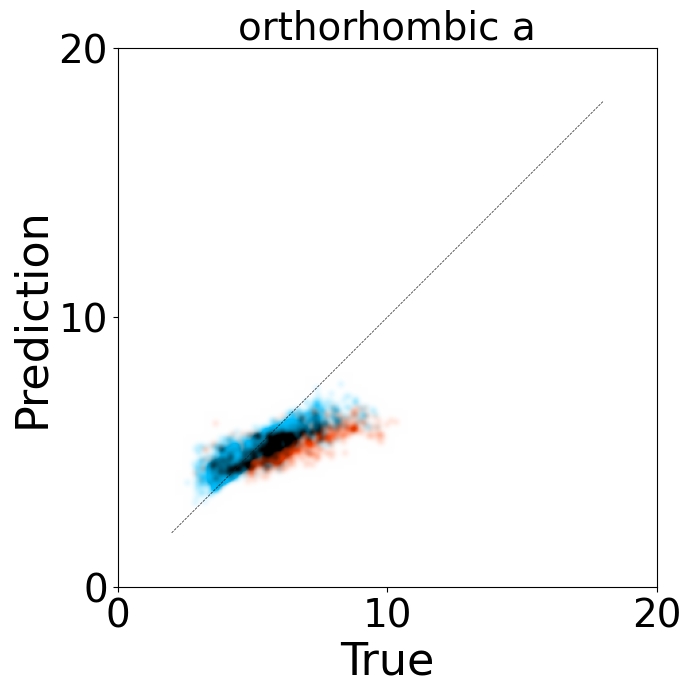

...

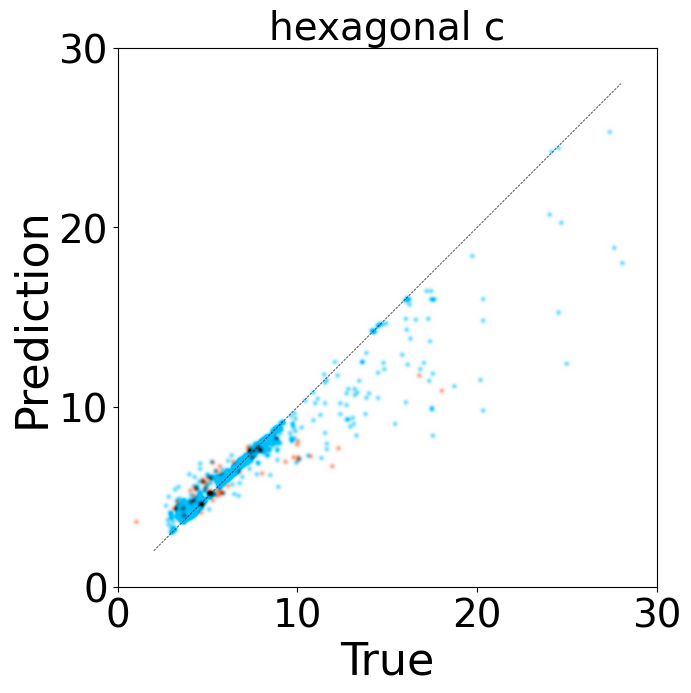

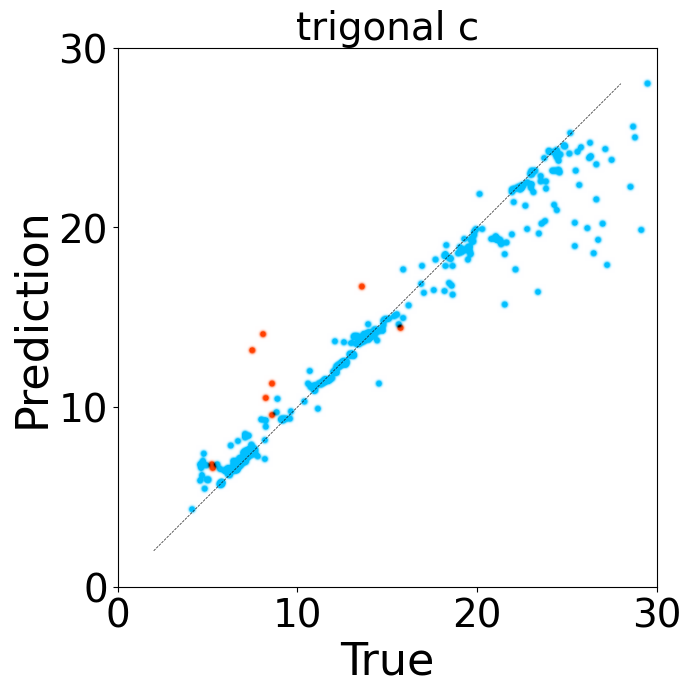

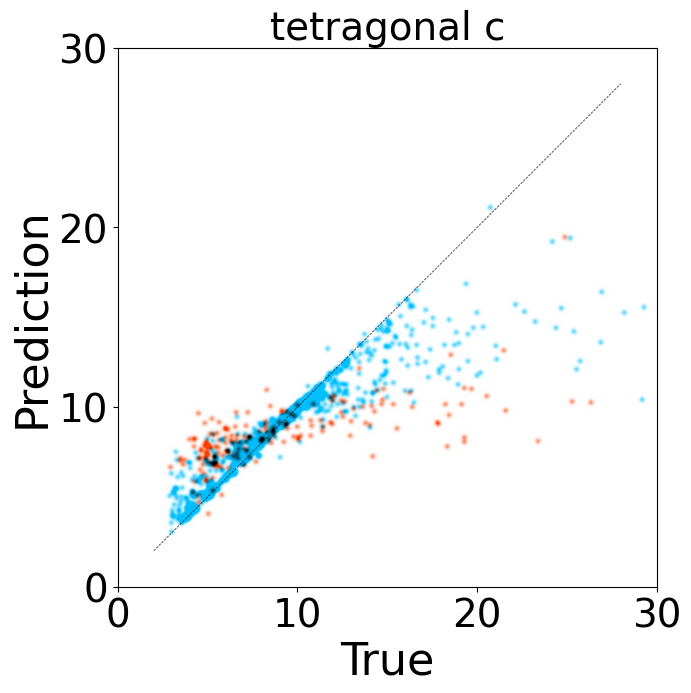

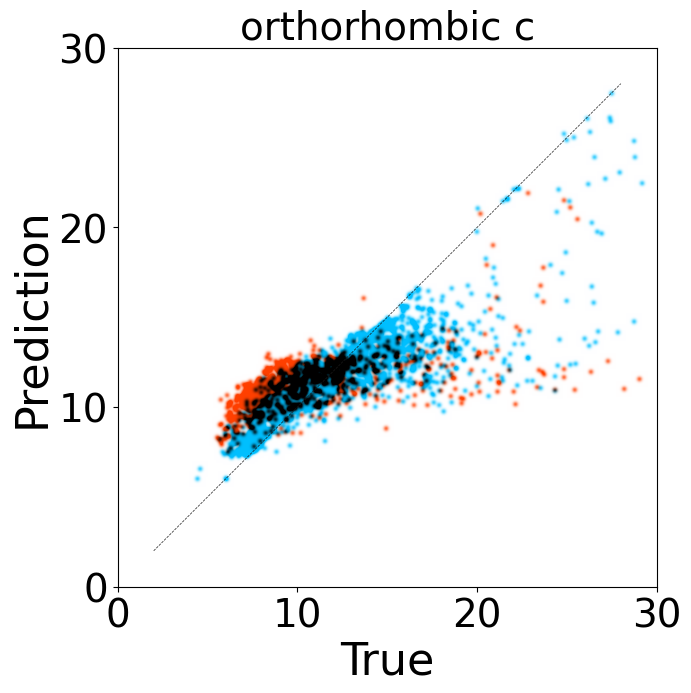

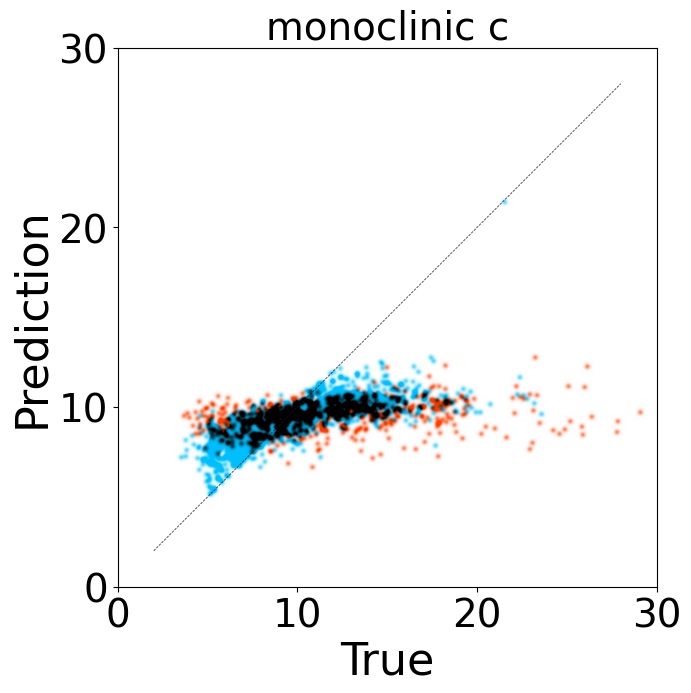

In [73]:
mpl.style.use('default')
for param in ['a', 'b', 'c']:
    for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
        output_set = np.load('data/10_aggregate_npy/10_aggregate_'+cry_sys+'_'+param+'.npy', allow_pickle=True)
        true_val_acc = output_set[0]
        median_per_pattern_acc = output_set[1]
        true_val_inacc = output_set[2]
        median_per_pattern_inacc = output_set[3]
        # plt.figure(figsize=(8, 7))
        # plt.scatter(true_val_inacc, median_per_pattern_inacc, alpha = 0.1, label = "Innacurate Crystal System",
        #            color = '#FF7F0E')
        # plt.scatter(true_val_acc, median_per_pattern_acc, alpha = 0.1, label = 'True Crystal System',
        #            color = '#1F77B4')
        # plt.plot(np.linspace(min(true_val_inacc), max(true_val_inacc), 100),
        #          np.linspace(min(true_val_inacc), max(true_val_inacc), 100), linestyle = '--', color = 'k')
        # plt.yticks(fontsize=20)
        # plt.xticks(fontsize = 20)
        # plt.xlabel('True', fontsize = 30)
        # plt.ylabel('Prediction', fontsize = 30)
        # plt.legend(fontsize = 18)
        # plt.show()
        if param == 'a':
            rmax=20
        if param == 'b':
            rmax=20
        if param == 'c':
            rmax=30
        if param in ['a','b']:
            if cry_sys == 'cubic':
                scale_saturation = (5.0, 20.0)
            if cry_sys == 'hexagonal':
                scale_saturation = (15.0, 30.0)
            if cry_sys == 'trigonal':
                scale_saturation = (25.0, 25.0)
            if cry_sys == 'tetragonal':
                scale_saturation = (30.0, 25.0)
            if cry_sys == 'orthorhombic':
                scale_saturation = (10.0, 10.0)
            if cry_sys == 'monoclinic':
                scale_saturation = (15.0, 10.0)
                
        if param in ['c']:
            if cry_sys == 'cubic':
                scale_saturation = (5.0, 25.0)
            if cry_sys == 'hexagonal':
                scale_saturation = (30, 25.0)
            if cry_sys == 'trigonal':
                scale_saturation = (25.0, 25.0)
            if cry_sys == 'tetragonal':
                scale_saturation = (27.5, 25.0)
            if cry_sys == 'orthorhombic':
                scale_saturation = (20.0, 20.0)
            if cry_sys == 'monoclinic':
                scale_saturation = (20.0, 20.0)
        fig,ax = plot_hist_2D(
                true_val_acc,
                median_per_pattern_acc,
                true_val_inacc,
                median_per_pattern_inacc,
                figsize = (8, 7),
                r_max = rmax,
                scale_saturation = scale_saturation,
                title=cry_sys+' '+param,
                dr=0.05,
                r_sigma=0.1
                )
        
        plt.rcParams['pdf.fonttype'] = 'truetype'
        # fig.savefig('10 aggregate '+cry_sys+' '+param+'.pdf', bbox_inches="tight")

<font size="6"> Figure S1

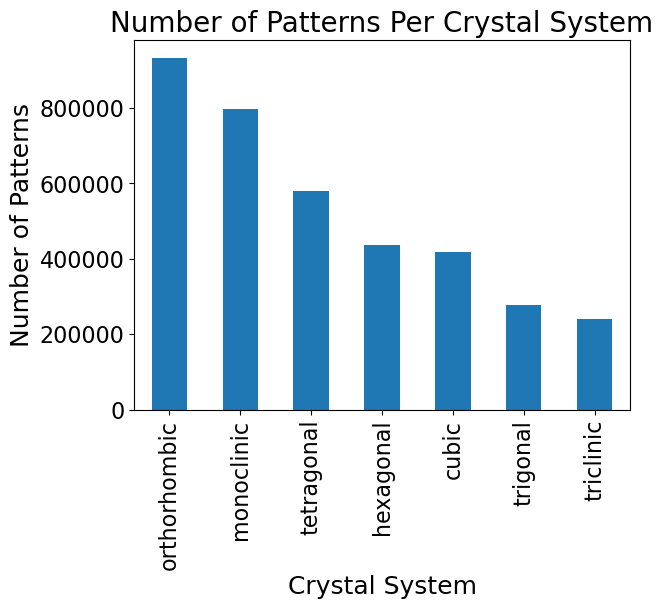

In [74]:
rf_diff_obj.show_distributions()

<font size="6"> Figure S3

<font size="4"> Individual Pattern

orthorhombic 0.4340318689794378
monoclinic 0.37695942804786126
tetragonal 0.2957109348821624
hexagonal 0.21946600091008597
cubic 0.07671463469710345
trigonal 0.14160559059144368


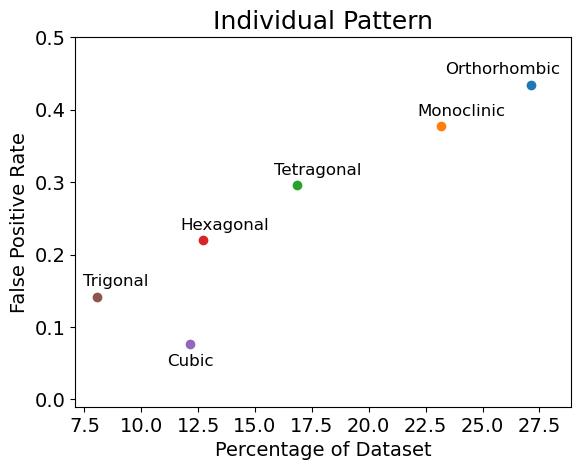

In [75]:
warnings.filterwarnings('ignore')
systems = ['orthorhombic', 'monoclinic', 'tetragonal', 'hexagonal', 'cubic',  'trigonal']
percentages_false_pos = []

for cry_sys in systems:
    predicted_cry_sys = rf_diff_obj.output_df.loc[rf_diff_obj.output_df['Predictions Crystal System']== cry_sys]
    
    false_positives = rf_diff_obj.output_df.loc[(rf_diff_obj.output_df['Predictions Crystal System'] == cry_sys) & 
                                                                           (rf_diff_obj.output_df['True Values Crystal System'] != cry_sys)]
    
    false_pos_rate = len(false_positives)/len(predicted_cry_sys)
    print(cry_sys + ' ' + str(false_pos_rate))
    percentages_false_pos.append(false_pos_rate)

vals = np.asarray(rf_diff_obj.output_df['True Values Crystal System'].value_counts())
vals = vals/sum(vals)
vals = vals*100

plot_set = []
for i in range(0, 6):
    plot_set.append([vals[i], percentages_false_pos[i], systems[i]])
for i in range(len(plot_set)):
    x = plot_set[i][0]
    y = plot_set[i][1]
    z = plot_set[i][2]
    plt.scatter(x, y)
    if z == 'cubic':
        plt.text(x -1, y - 0.03 , z.capitalize(), fontsize=12)
    elif z == 'orthorhombic':
        plt.text(x-3.75, y + 0.015 , z.capitalize(), fontsize=12)
    elif z == 'monoclinic':
        plt.text(x -1, y + 0.015 , z.capitalize(), fontsize=12)
    elif z == 'trigonal':
        plt.text(x-0.6, y + 0.015 , z.capitalize(), fontsize=12)
    else:
        plt.text(x-1, y + 0.015 , z.capitalize(), fontsize=12)
plt.ylabel('False Positive Rate', fontsize = 14)
plt.xlabel('Percentage of Dataset', fontsize = 14)
plt.ylim([-0.01,0.5])
plt.xlim([7.1, 28.9])
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.title('Individual Pattern', fontsize = 18)
# plt.rcParams['pdf.fonttype'] = 'truetype'
# plt.savefig('Figures/Figure S3/Figure S3.pdf', bbox_inches="tight")
plt.show()

<font size="4"> 10 Pattern Aggregate

orthorhombic 0.28613460831187937
monoclinic 0.27681100768919464
tetragonal 0.15195246179966043
hexagonal 0.07377049180327869
cubic 0.05504587155963303
trigonal 0.028901734104046242


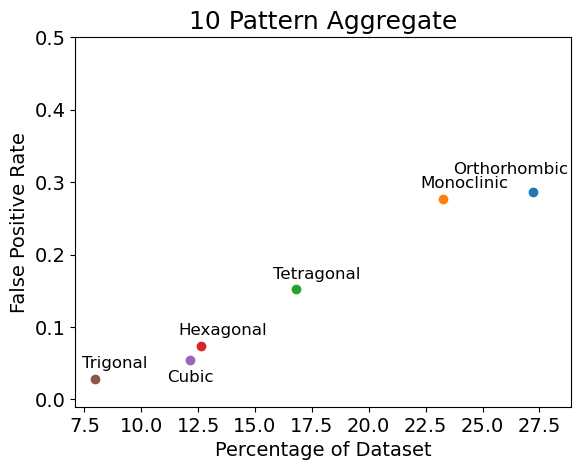

In [76]:
warnings.filterwarnings('ignore')
systems = ['orthorhombic', 'monoclinic', 'tetragonal', 'hexagonal', 'cubic',  'trigonal']
percentages_false_pos = []

for cry_sys in systems:
    predicted_cry_sys = rf_diff_obj.condensed_output_df.loc[rf_diff_obj.condensed_output_df['Aggregate Predictions Crystal System']== cry_sys]
    
    false_positives = rf_diff_obj.condensed_output_df.loc[(rf_diff_obj.condensed_output_df['Aggregate Predictions Crystal System'] == cry_sys) & 
                                                                           (rf_diff_obj.condensed_output_df['True Values Crystal System'] != cry_sys)]
    
    false_pos_rate = len(false_positives)/len(predicted_cry_sys)
    print(cry_sys + ' ' + str(false_pos_rate))
    percentages_false_pos.append(false_pos_rate)

vals = np.asarray(rf_diff_obj.condensed_output_df['True Values Crystal System'].value_counts())
vals = vals/sum(vals)
vals = vals*100

plot_set = []
for i in range(0, 6):
    plot_set.append([vals[i], percentages_false_pos[i], systems[i]])
for i in range(len(plot_set)):
    x = plot_set[i][0]
    y = plot_set[i][1]
    z = plot_set[i][2]
    plt.scatter(x, y)
    if z == 'cubic':
        plt.text(x -1, y - 0.03 , z.capitalize(), fontsize=12)
    elif z == 'orthorhombic':
        plt.text(x-3.5, y + 0.025 , z.capitalize(), fontsize=12)
    elif z == 'monoclinic':
        plt.text(x -1, y + 0.015 , z.capitalize(), fontsize=12)
    elif z == 'trigonal':
        plt.text(x-0.6, y + 0.015 , z.capitalize(), fontsize=12)
    else:
        plt.text(x-1, y + 0.015 , z.capitalize(), fontsize=12)
plt.ylabel('False Positive Rate', fontsize = 14)
plt.xlabel('Percentage of Dataset', fontsize = 14)
plt.ylim([-0.01,0.5])
plt.xlim([7.1, 28.9])
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 14)
plt.title('10 Pattern Aggregate', fontsize = 18)
plt.rcParams['pdf.fonttype'] = 'truetype'
plt.savefig('ag Figure S3.pdf', bbox_inches="tight")
plt.show()

<font size="6"> Figure S4

<font size="4"> Individual Pattern

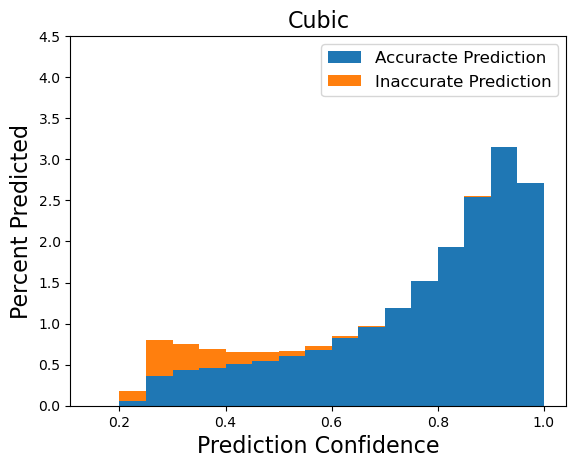

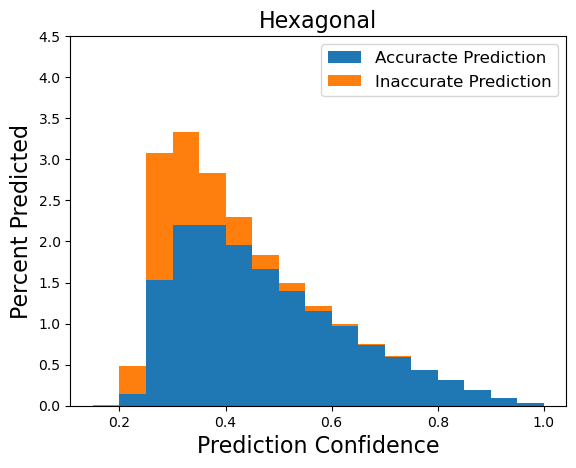

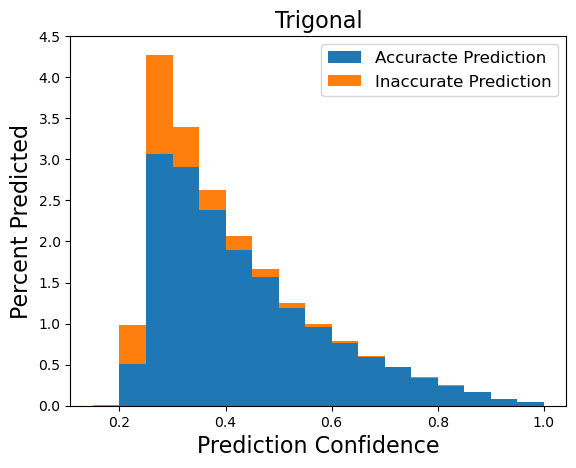

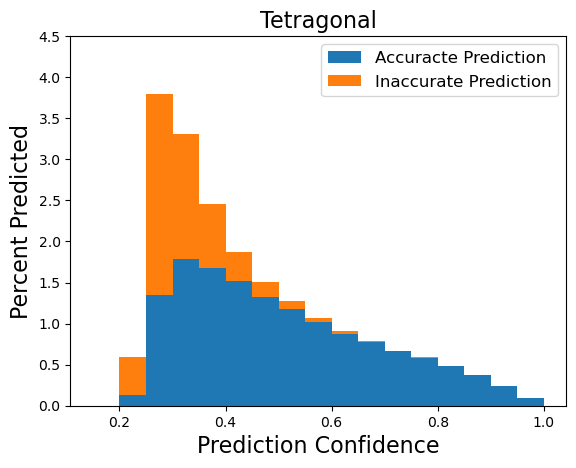

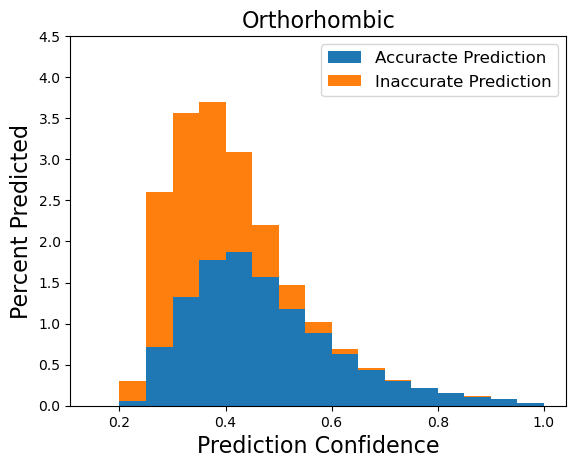

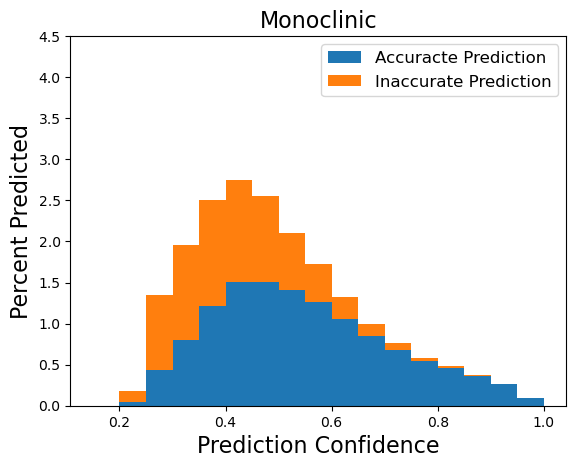

In [77]:
for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
    cry_sys_df = rf_diff_obj.output_df.loc[rf_diff_obj.output_df['Predictions Crystal System'] == cry_sys]
    true_cry_sys_pred = cry_sys_df.loc[cry_sys_df['True Values Crystal System']==cry_sys]	
    wrong_pred = cry_sys_df.loc[cry_sys_df['True Values Crystal System']!=cry_sys]
    # plt.hist(cry_sys_df['Prediction Confidence'], bins=np.arange(0.15, 1.05, 0.05), facecolor = 'white', density = True)
    hist = plt.hist([np.asarray(true_cry_sys_pred['Confidence Crystal System']),np.asarray(wrong_pred['Confidence Crystal System'])], 
             bins=np.arange(0.15, 1.05, 0.05), stacked=True, label=['Accuracte Prediction', 'Inaccurate Prediction'], density = True)
    plt.legend(fontsize = 12)
    plt.title(cry_sys.capitalize(), fontsize = 16)
    plt.ylim([0,4.5])
    plt.ylabel('Percent Predicted', fontsize = 16)
    plt.xlabel('Prediction Confidence', fontsize = 16)
    mpl.style.use('default')
    plt.rcParams['pdf.fonttype'] = 'truetype'
    # plt.savefig('Figures/Figure S4/Figure S4 '+ cry_sys +'.pdf', bbox_inches="tight")
    plt.show()

<font size="4"> 10 Pattern Aggregate

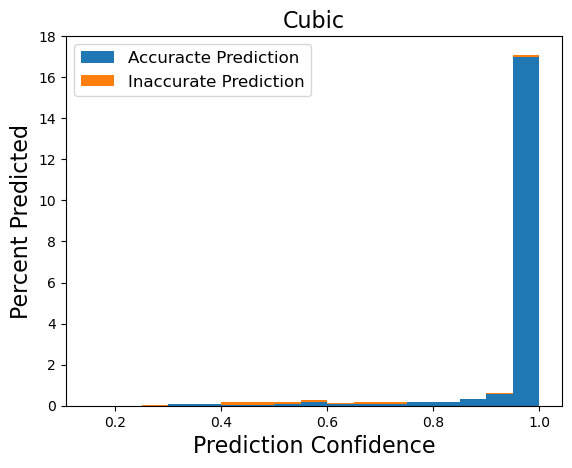

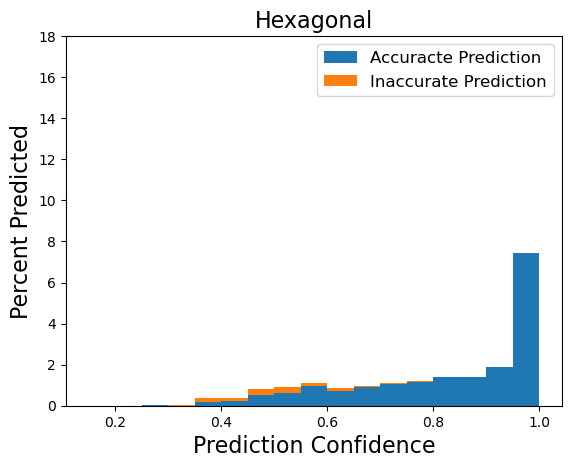

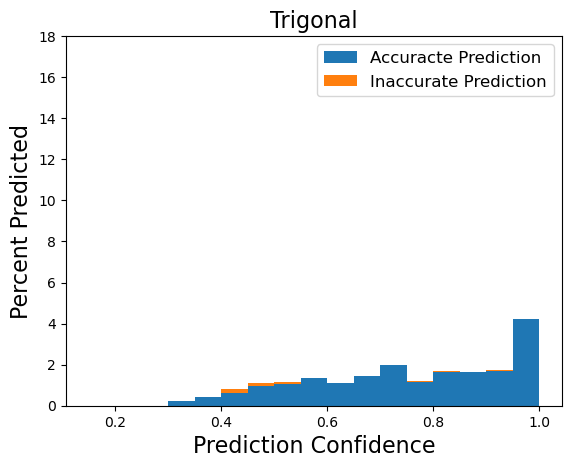

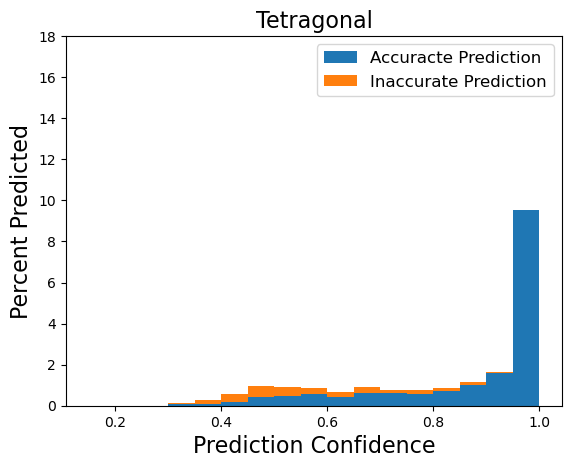

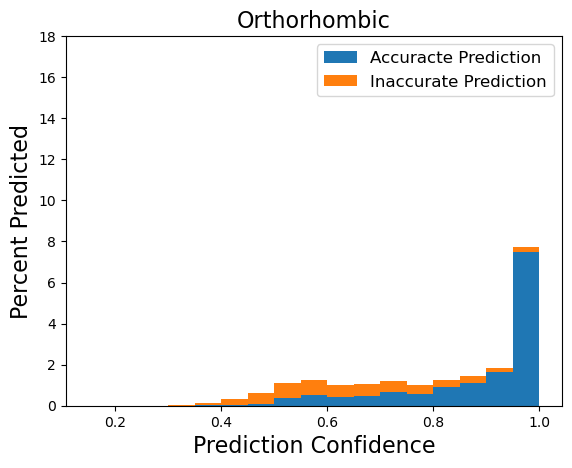

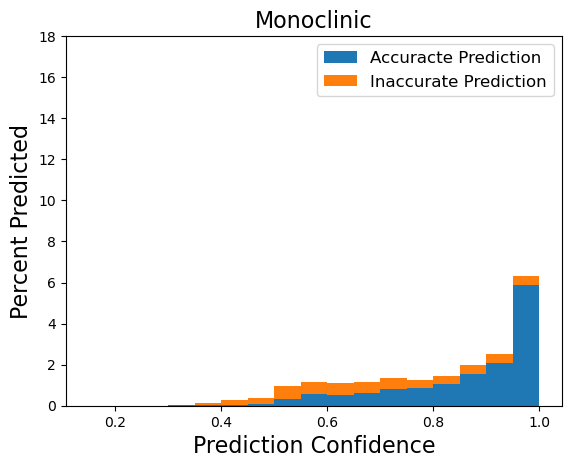

In [78]:
for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
    cry_sys_df = rf_diff_obj.condensed_output_df.loc[rf_diff_obj.condensed_output_df['Aggregate Predictions Crystal System'] == cry_sys]
    true_cry_sys_pred = cry_sys_df.loc[cry_sys_df['True Values Crystal System']==cry_sys]	
    wrong_pred = cry_sys_df.loc[cry_sys_df['True Values Crystal System']!=cry_sys]
    # plt.hist(cry_sys_df['Prediction Confidence'], bins=np.arange(0.15, 1.05, 0.05), facecolor = 'white', density = True)
    hist = plt.hist([np.asarray(true_cry_sys_pred['Prediction Confidence']),np.asarray(wrong_pred['Prediction Confidence'])], 
             bins=np.arange(0.15, 1.05, 0.05), stacked=True, label=['Accuracte Prediction', 'Inaccurate Prediction'], density = True)
    plt.legend(fontsize = 12)
    plt.title(cry_sys.capitalize(), fontsize = 16)
    plt.ylim([0,18])
    plt.ylabel('Percent Predicted', fontsize = 16)
    plt.xlabel('Prediction Confidence', fontsize = 16)
    mpl.style.use('default')
    plt.rcParams['pdf.fonttype'] = 'truetype'
    plt.savefig('10 ag Figure S4 '+ cry_sys +'.pdf', bbox_inches="tight")
    plt.show()

<font size="6"> Figure S5

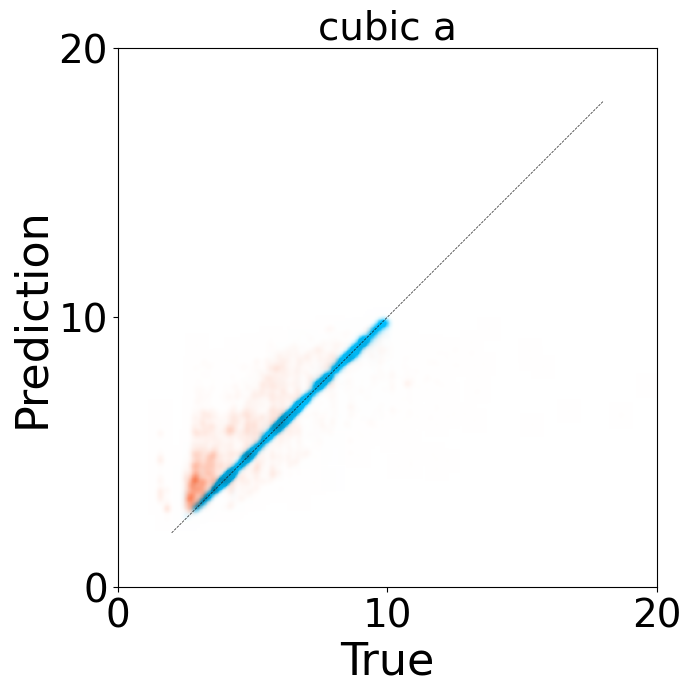

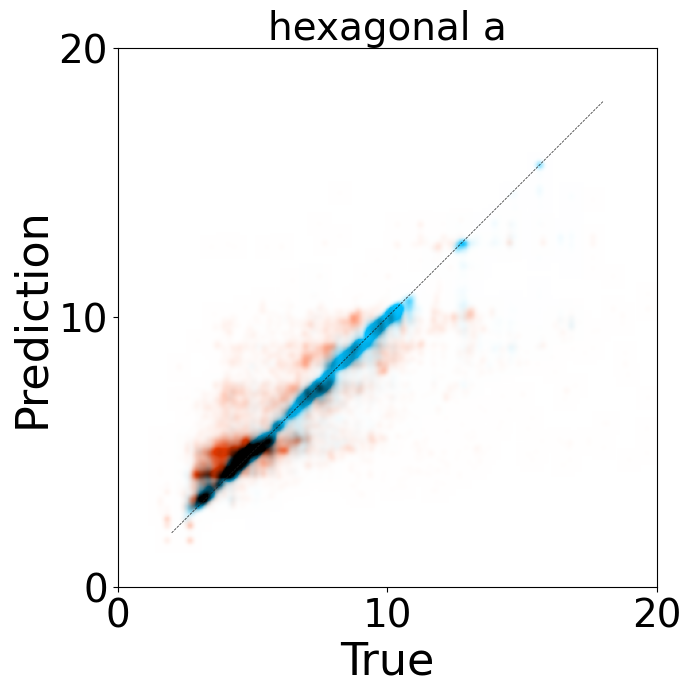

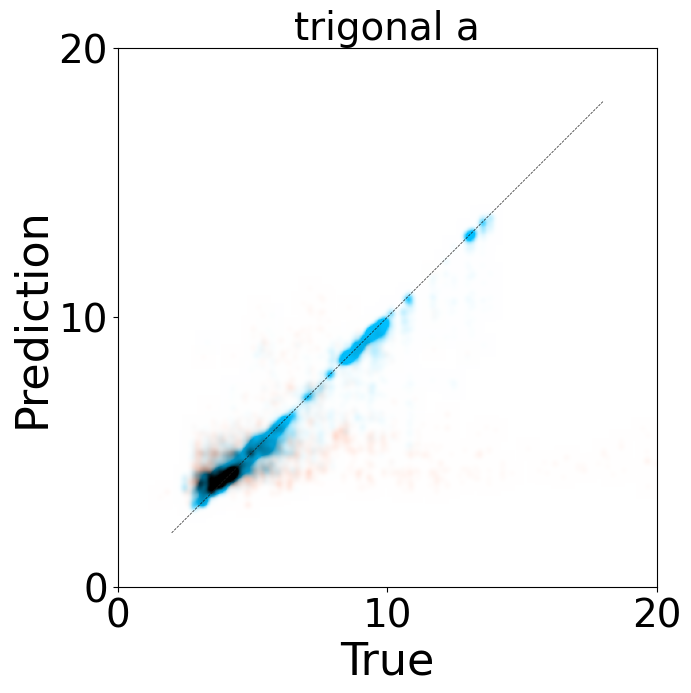

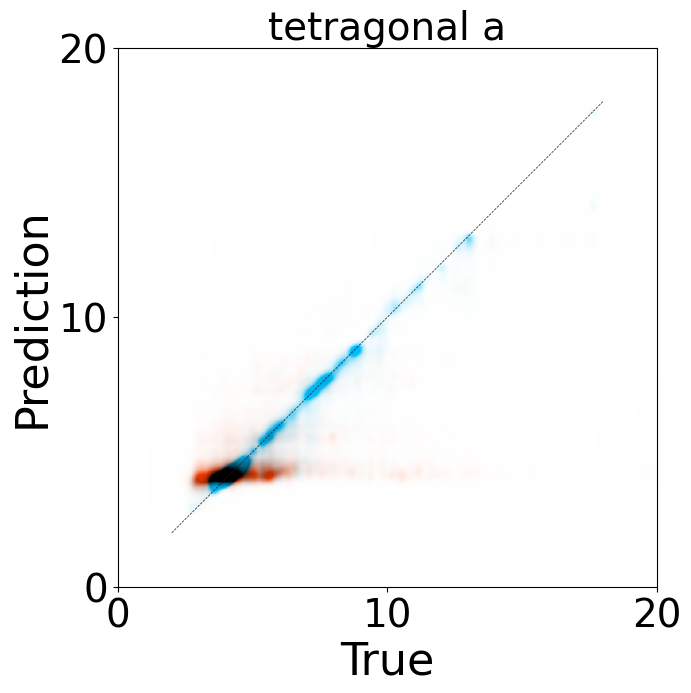

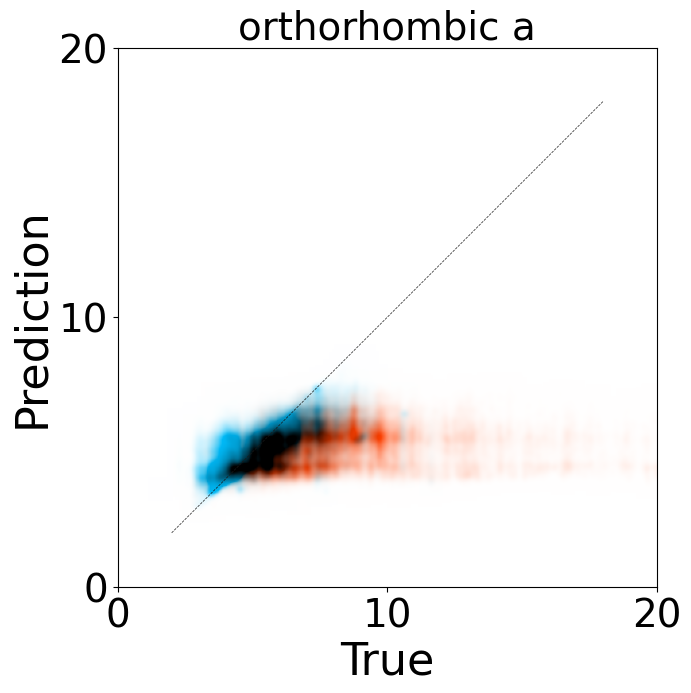

...

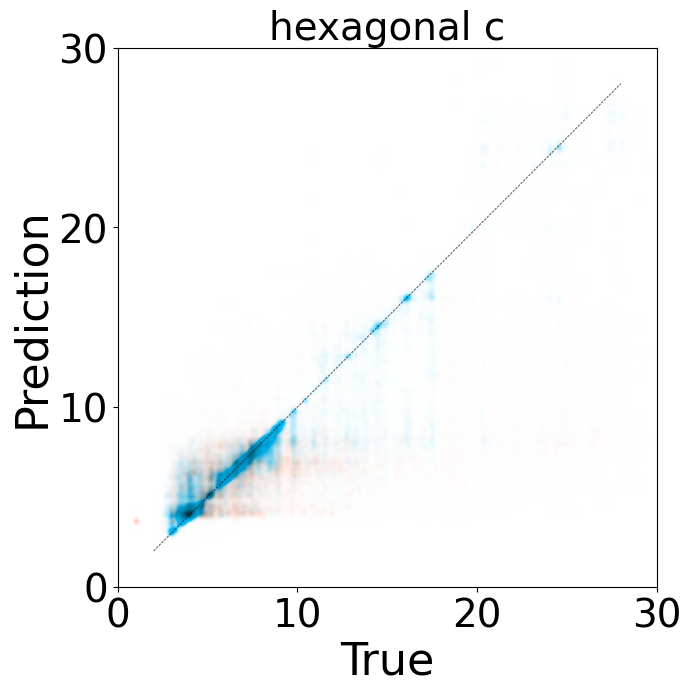

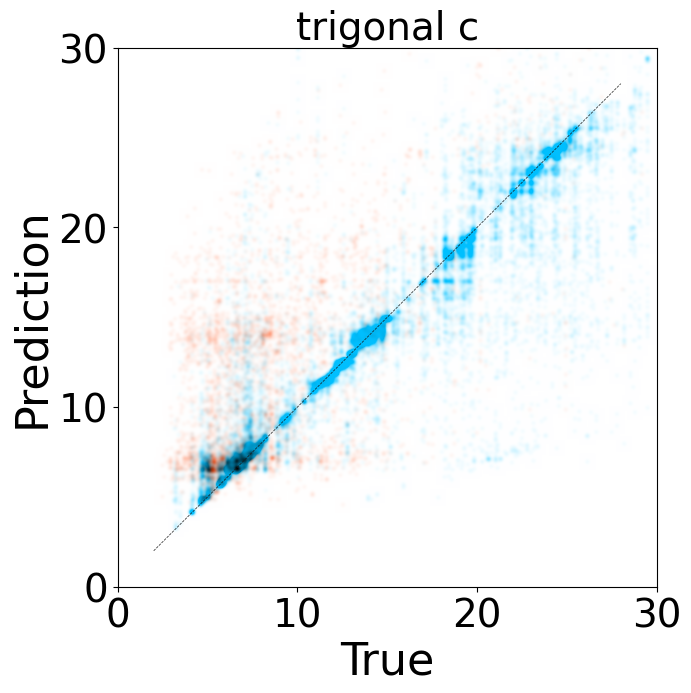

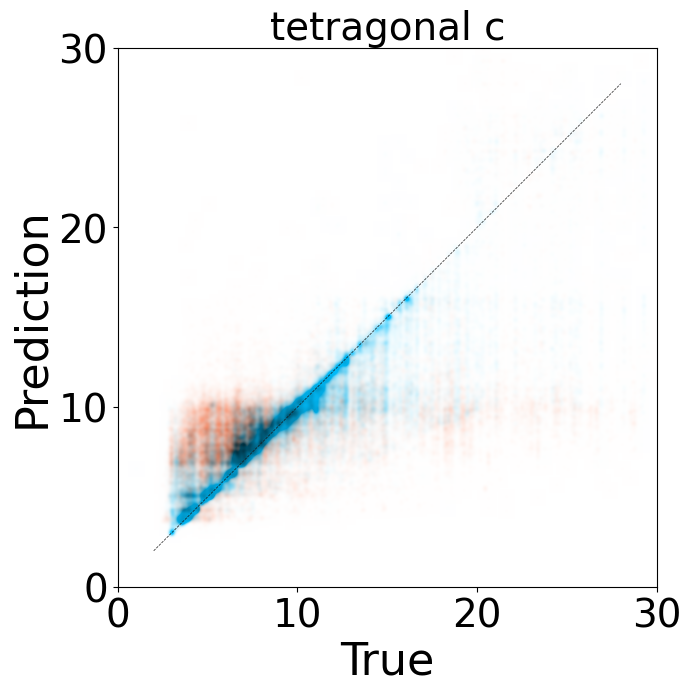

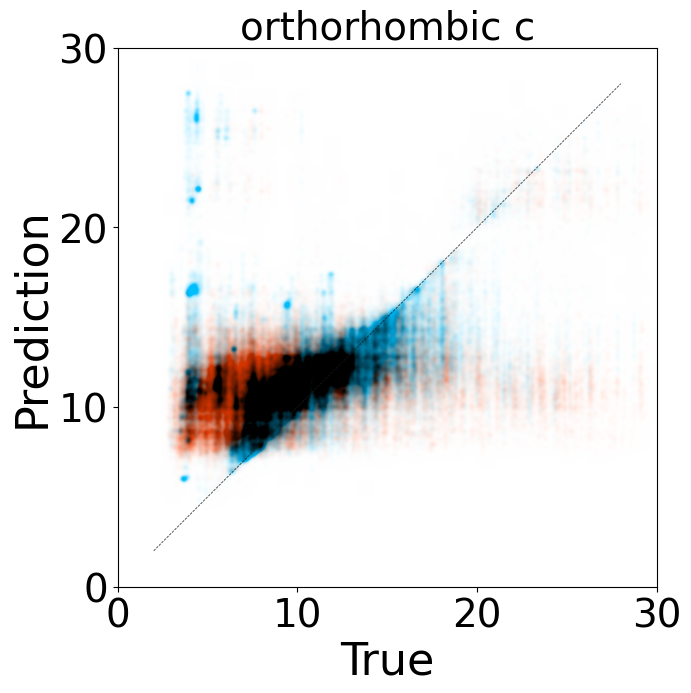

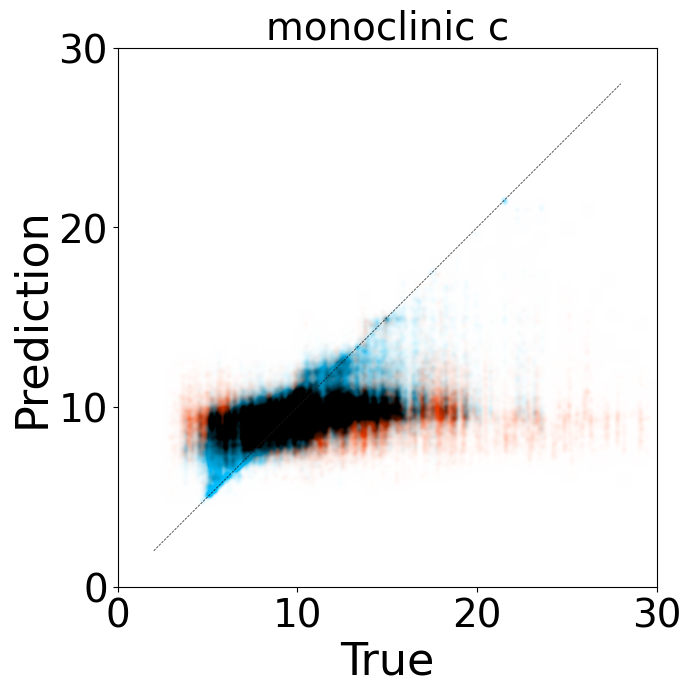

In [79]:
mpl.style.use('default')
for param in ['a', 'b', 'c']:
    for cry_sys in ['cubic', 'hexagonal', 'trigonal', 'tetragonal', 'orthorhombic', 'monoclinic']:
        output_set = np.load('data/individual_npy/individual_pattern_'+cry_sys+'_'+param+'.npy', allow_pickle=True)
        true_val_acc = output_set[0]
        median_per_pattern_acc = output_set[1]
        true_val_inacc = output_set[2]
        median_per_pattern_inacc = output_set[3]
        # plt.figure(figsize=(8, 7))
        # plt.scatter(true_val_inacc, median_per_pattern_inacc, alpha = 0.1, label = "Innacurate Crystal System",
        #            color = '#FF7F0E')
        # plt.scatter(true_val_acc, median_per_pattern_acc, alpha = 0.1, label = 'True Crystal System',
        #            color = '#1F77B4')
        # plt.plot(np.linspace(min(true_val_inacc), max(true_val_inacc), 100),
        #          np.linspace(min(true_val_inacc), max(true_val_inacc), 100), linestyle = '--', color = 'k')
        # plt.yticks(fontsize=20)
        # plt.xticks(fontsize = 20)
        # plt.xlabel('True', fontsize = 30)
        # plt.ylabel('Prediction', fontsize = 30)
        # plt.legend(fontsize = 18)
        # plt.show()
        if param == 'a':
            rmax=20
        if param == 'b':
            rmax=20
        if param == 'c':
            rmax=30
        if param in ['a','b']:
            if cry_sys == 'cubic':
                scale_saturation = (5.0, 20.0)
            if cry_sys == 'hexagonal':
                scale_saturation = (15.0, 30.0)
            if cry_sys == 'trigonal':
                scale_saturation = (25.0, 25.0)
            if cry_sys == 'tetragonal':
                scale_saturation = (30.0, 25.0)
            if cry_sys == 'orthorhombic':
                scale_saturation = (10.0, 10.0)
            if cry_sys == 'monoclinic':
                scale_saturation = (15.0, 10.0)
                
        if param in ['c']:
            if cry_sys == 'cubic':
                scale_saturation = (5.0, 25.0)
            if cry_sys == 'hexagonal':
                scale_saturation = (30, 25.0)
            if cry_sys == 'trigonal':
                scale_saturation = (25.0, 25.0)
            if cry_sys == 'tetragonal':
                scale_saturation = (27.5, 25.0)
            if cry_sys == 'orthorhombic':
                scale_saturation = (20.0, 20.0)
            if cry_sys == 'monoclinic':
                scale_saturation = (20.0, 20.0)
        fig,ax = plot_hist_2D(
                true_val_acc,
                median_per_pattern_acc,
                true_val_inacc,
                median_per_pattern_inacc,
                figsize = (8, 7),
                r_max = rmax,
                scale_saturation = scale_saturation,
                title=cry_sys+' '+param,
                dr=0.05,
                r_sigma=0.1
                )
        
        plt.rcParams['pdf.fonttype'] = 'truetype'
        # fig.savefig('Individual Pattern '+cry_sys+' '+param+'.pdf', bbox_inches="tight")

<font size="5"> In text values generated using confusion matricies 

In [80]:
# Confidence of inaccurate vs accurate predictions of individual patterns

inac_con = []
acc_con = []
for i in tqdm(range(0, len(rf_diff_obj.output_df))):
    row = rf_diff_obj.output_df.iloc[i]
    if row['Predictions Crystal System'] == row['True Values Crystal System']:
        acc_con.append(row['Confidence Crystal System'])
    if row['Predictions Crystal System'] != row['True Values Crystal System']:
        inac_con.append(row['Confidence Crystal System'])

print(np.mean(inac_con))
print(np.mean(acc_con))

100%|███████████████████████████████████████████████████████████████████████| 859656/859656 [01:07<00:00, 12666.59it/s]

0.37782639152104697
0.546835341911504


In [81]:
# Confidence of inaccurate vs accurate predictions of 10 pattern aggregates


inac_con = []
acc_con = []
for i in tqdm(range(0, len(rf_diff_obj.condensed_output_df))):
    row = rf_diff_obj.condensed_output_df.iloc[i]
    if row['Aggregate Predictions Crystal System'] == row['True Values Crystal System']:
        acc_con.append(row['Prediction Confidence'])
    if row['Aggregate Predictions Crystal System'] != row['True Values Crystal System']:
        inac_con.append(row['Prediction Confidence'])
        
print(np.mean(inac_con))
print(np.mean(acc_con))

100%|███████████████████████████████████████████████████████████████████████████| 8549/8549 [00:00<00:00, 11722.78it/s]

0.656666700193962
0.881926477117916


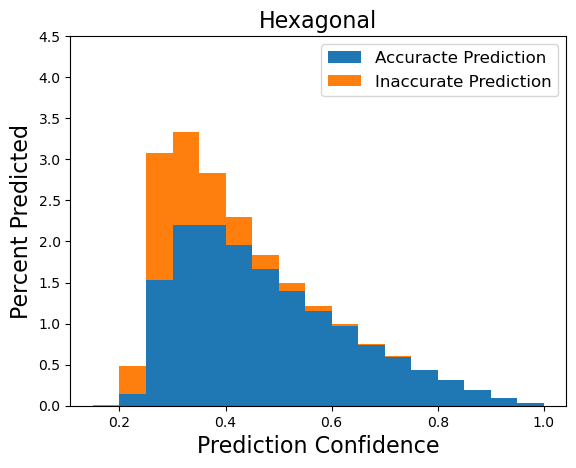

In [82]:
for cry_sys in ['hexagonal']:
    cry_sys_df = rf_diff_obj.output_df.loc[rf_diff_obj.output_df['Predictions Crystal System'] == cry_sys]
    true_cry_sys_pred = cry_sys_df.loc[cry_sys_df['True Values Crystal System']==cry_sys]	
    wrong_pred = cry_sys_df.loc[cry_sys_df['True Values Crystal System']!=cry_sys]
    # plt.hist(cry_sys_df['Prediction Confidence'], bins=np.arange(0.15, 1.05, 0.05), facecolor = 'white', density = True)
    hist = plt.hist([np.asarray(true_cry_sys_pred['Confidence Crystal System']),np.asarray(wrong_pred['Confidence Crystal System'])], 
             bins=np.arange(0.15, 1.05, 0.05), stacked=True, label=['Accuracte Prediction', 'Inaccurate Prediction'], density = True)
    plt.legend(fontsize = 12)
    plt.title(cry_sys.capitalize(), fontsize = 16)
    plt.ylim([0,4.5])
    plt.ylabel('Percent Predicted', fontsize = 16)
    plt.xlabel('Prediction Confidence', fontsize = 16)
    mpl.style.use('default')
    plt.rcParams['pdf.fonttype'] = 'truetype'
    # plt.savefig('Figures/Figure S4/Figure S4 '+ cry_sys +'.pdf', bbox_inches="tight")
    plt.show()

In [83]:
# confidence vs probability of accuracy for hexagonal patterns, two examples

print(hist[1][3:5])
hist[0][0][3]/hist[0][1][3]

[0.3  0.35]


0.6600901500036946

In [84]:
print(hist[1][7:9])
hist[0][0][7]/hist[0][1][7]

[0.5  0.55]


0.9379934210526315

<font size="5"> Examples of how aggregate data was generated

In [108]:
rf_diff_obj.condense_crystal_system_output(method='Difference Aggregation', load_from_path = False, num=10,
            path = 'Model_data/Crystal_sys_outputs/10_pattern_lattice_added_difference_aggregation_condensed_df.joblib')

100%|██████████████████████████████████████████████████████████████████████████████| 8549/8549 [11:42<00:00, 12.17it/s]


In [113]:
rf_diff_obj.add_lattice_data_to_condensed_df()

df ready
trigonal
model loaded


100%|██████████████████████████████████████████████████████████████████████████████| 8549/8549 [02:05<00:00, 68.33it/s]


hexagonal
model loaded


100%|██████████████████████████████████████████████████████████████████████████████| 8549/8549 [04:13<00:00, 33.72it/s]


monoclinic
model loaded


100%|██████████████████████████████████████████████████████████████████████████████| 8549/8549 [10:33<00:00, 13.48it/s]


orthorhombic
model loaded


100%|██████████████████████████████████████████████████████████████████████████████| 8549/8549 [11:56<00:00, 11.94it/s]


tetragonal
model loaded


100%|██████████████████████████████████████████████████████████████████████████████| 8549/8549 [06:11<00:00, 23.02it/s]


cubic
model loaded


100%|██████████████████████████████████████████████████████████████████████████████| 8549/8549 [04:38<00:00, 30.74it/s]


In [118]:
lengths = []
for i in range(len(rf_diff_obj.condensed_output_df)):
    lengths.append(len(rf_diff_obj.condensed_output_df.iloc[i]['pred_cry_sys_full_predictions_a']))

In [115]:
joblib.dump(rf_diff_obj.condensed_output_df, '052224_10_pattern_lattice_added_difference_aggregation_condensed_df.joblib')

['052224_10_pattern_lattice_added_difference_aggregation_condensed_df.joblib']

In [123]:
rf_diff_obj.add_full_pred_median_to_condensed_df()

pred_cry_sys_full_predictions_a
pred_cry_sys_full_predictions_b
pred_cry_sys_full_predictions_c
true_cry_sys_full_predictions_a
true_cry_sys_full_predictions_b
true_cry_sys_full_predictions_c


100%|████████████████████████████████████████████████████████████████████████| 859656/859656 [03:10<00:00, 4507.57it/s]
